In [1]:
# import required documents

import random
import requests
from bs4 import BeautifulSoup
from collections import Counter
import pandas as pd
from cryptocmd import CmcScraper
import numpy as np
import seaborn as sns
import datetime as dt
import warnings
warnings.filterwarnings('ignore')
import os
import math
import matplotlib.pyplot as plt
import pickle

# Machine Learning
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score
from sklearn.metrics import mean_poisson_deviance, mean_gamma_deviance, accuracy_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.svm import SVC, SVR

# Deep Learning
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, GRU, Bidirectional

# Statistical Tests and visulizations
from itertools import product
import statsmodels.api as sm

from itertools import cycle
import plotly.offline as py
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

In [9]:
# List of cryptocurrency symbols 
cryptos = ["BTC", "ETH", "BNB", "ADA", "SOL", "XRP", "LTC","LINK", "DOGE", "SHIB", 
            "MANA", "VET", "XMR", "BCH", "AVAX", "TRX", "MATIC", "CRO", "RNDR", "XTZ", 
            "BAT", "SC", "FTM","DCR","MKR", "ATOM","STX", "XLM", "QNT", "NEO"]

# Initialize a list to hold DataFrames
crypto_data = []

# Downloading data
for crypto in cryptos:
    scraper = CmcScraper(crypto, '03-01-2009', '19-05-2024')
    data = scraper.get_dataframe()
    # Add a column for the cryptocurrency symbol
    data['Symbol'] = crypto
    crypto_data.append(data) # Append DataFrame to the list

# concatenate all DataFrames in the list into a single DataFrames
historical_data = pd.concat(crypto_data, ignore_index=True)
    
# Save the combined dataset
historical_data.to_csv('crypto_historical_data.csv', index=False)

In [3]:
#cryptos = ["BTC", "ETH", "XRP", "ETH", "BTC", "XRP", "XRP", "BTC", "ETH", "ETH"]  # Example data
crypto_counter = Counter(historical_data['Symbol'])
# Get all items from the counter and sort them if needed
items = crypto_counter.items()  # list or Sort by symbol alphabetically

# Define how many columns you want
num_columns = 3

# Calculate how many rows you will need
num_rows = (len(items) + num_columns - 1) // num_columns

# Prepare an empty list to format the rows
formatted_rows = [''] * num_rows

# Fill the rows with formatted string data
for index, (symbol, count) in enumerate(items):
    column = index // num_rows
    row = index % num_rows
    # Format each item as 'Symbol (Count)'
    formatted_entry = f"{symbol} = {count}"
    # Adjust spacing between columns
    if column < num_columns - 1:  # Not the last column
        formatted_entry = f"{formatted_entry:<15}"  # Left align and set width
    formatted_rows[row] += formatted_entry

# Print each row
for row in formatted_rows:
    print(row)

BTC = 5060     MANA = 2437    BAT = 2545
ETH = 3209     VET = 2117     SC = 3189
BNB = 2491     XMR = 3651     FTM = 2029
ADA = 2423     BCH = 2493     DCR = 3022
SOL = 1501     AVAX = 1338    MKR = 2390
XRP = 3942     TRX = 2441     ATOM = 1894
LTC = 4040     MATIC = 1849   STX = 1666
LINK = 2430    CRO = 1984     XLM = 3576
DOGE = 3809    RNDR = 1439    QNT = 2110
SHIB = 1388    XTZ = 2150     NEO = 2810


In [4]:
# Assuming 'historical_data' is the DataFrame containing all the data
earliest_dates = historical_data.groupby('Symbol')['Date'].min()
print(earliest_dates)

Symbol
ADA     2017-10-01
ATOM    2019-03-14
AVAX    2020-07-13
BAT     2017-06-01
BCH     2017-07-23
BNB     2017-07-25
BTC     2010-07-13
CRO     2018-12-14
DCR     2016-02-10
DOGE    2013-12-15
ETH     2015-08-07
FTM     2018-10-30
LINK    2017-09-20
LTC     2013-04-28
MANA    2017-09-17
MATIC   2019-04-28
MKR     2017-01-29
NEO     2016-09-09
QNT     2018-08-10
RNDR    2020-06-11
SC      2015-08-26
SHIB    2020-08-01
SOL     2020-04-10
STX     2019-10-28
TRX     2017-09-13
VET     2018-08-03
XLM     2014-08-05
XMR     2014-05-21
XRP     2013-08-04
XTZ     2018-07-01
Name: Date, dtype: datetime64[ns]


In [5]:
data = historical_data.loc[:, ['Date', 'Open', 'High', 'Low','Close','Volume', 'Market Cap', 'Symbol']]

In [6]:
data.to_csv("selected_column_data.csv", index = False)

In [7]:
data = data.set_index('Date')
data

,Open,High,Low,Close,Volume,Market Cap,Symbol
Date,,,,,,,
2024-05-19,66937.930074,67694.298780,65937.177806,66278.370082,1.924909e+10,1.305732e+12,BTC
2024-05-18,67066.211043,67387.330366,66663.496521,66940.804410,1.671228e+10,1.318742e+12,BTC
2024-05-17,65231.298680,67459.459502,65119.314977,67051.874913,2.803128e+10,1.321187e+12,BTC
2024-05-16,66256.111817,66712.429379,64613.056046,65231.580313,3.157308e+10,1.285008e+12,BTC
2024-05-15,61553.989847,66454.449965,61330.408780,66267.491467,3.981517e+10,1.305167e+12,BTC
...,...,...,...,...,...,...,...
2016-09-13,0.374469,0.375092,0.301766,0.309509,3.336910e+03,0.000000e+00,NEO
2016-09-12,0.376312,0.376671,0.360443,0.374598,1.115840e+03,0.000000e+00,NEO
2016-09-11,0.390948,0.398459,0.372790,0.376150,8.787000e+02,0.000000e+00,NEO


# Extracting each crypto data

In [8]:
# Creating a dictionary with symbol as key and the corresponding DataFrame as value
crypto_data = {symbol: data[data['Symbol'] == symbol].copy() 
               for symbol in data['Symbol'].unique()}

In [9]:
crypto_data

{'BTC':                     Open          High           Low         Close  \
 Date                                                                 
 2024-05-19  66937.930074  67694.298780  65937.177806  66278.370082   
 2024-05-18  67066.211043  67387.330366  66663.496521  66940.804410   
 2024-05-17  65231.298680  67459.459502  65119.314977  67051.874913   
 2024-05-16  66256.111817  66712.429379  64613.056046  65231.580313   
 2024-05-15  61553.989847  66454.449965  61330.408780  66267.491467   
 ...                  ...           ...           ...           ...   
 2010-07-17      0.066500      0.077735      0.057418      0.065993   
 2010-07-16      0.058001      0.072220      0.057484      0.066492   
 2010-07-15      0.056403      0.067954      0.053969      0.057568   
 2010-07-14      0.058157      0.061588      0.048647      0.056402   
 2010-07-13      0.061833      0.066349      0.052617      0.058163   
 
                   Volume    Market Cap Symbol  
 Date              

In [10]:
def get_crypto_data(symbol):
    if symbol in crypto_data:
        df = crypto_data[symbol].loc[:, ['Open', 'High', 'Low', 'Close', 'Volume', 'Market Cap']]
        #df.set_index('Date', inplace=True)
        df = df.sort_index()
        return df
    else:
        return None  # or handle error/missing symbol

# Usage
btc = get_crypto_data('BTC')
eth = get_crypto_data('ETH')
bnb = get_crypto_data('BNB')

In [11]:
# List all cryptos
cryptos = ["BTC", "ETH", "BNB", "ADA", "SOL", "XRP", "LTC","LINK", "DOGE", "SHIB", 
            "MANA", "VET", "XMR", "BCH", "AVAX", "TRX", "MATIC", "CRO", "RNDR", "XTZ", 
            "BAT", "SC", "FTM","DCR","MKR", "ATOM","STX", "XLM", "QNT", "NEO"]

# LSTM -> Train the model for individual crypto

# 1. Bitcoin (BTC)

### LSTM

Epoch 1/100
110/110 [==============================] - 1s 7ms/step - loss: 0.0034 - val_loss: 0.8422
Epoch 2/100
110/110 [==============================] - 1s 5ms/step - loss: 8.8373e-04 - val_loss: 0.5576
Epoch 3/100
110/110 [==============================] - 1s 5ms/step - loss: 8.3225e-04 - val_loss: 0.3256
Epoch 4/100
110/110 [==============================] - 1s 5ms/step - loss: 6.4799e-04 - val_loss: 0.2328
Epoch 5/100
110/110 [==============================] - 1s 5ms/step - loss: 6.3092e-04 - val_loss: 0.1581
Epoch 6/100
110/110 [==============================] - 1s 5ms/step - loss: 6.4389e-04 - val_loss: 0.1519
Epoch 7/100
110/110 [==============================] - 1s 5ms/step - loss: 6.1637e-04 - val_loss: 0.0946
Epoch 8/100
110/110 [==============================] - 1s 5ms/step - loss: 5.6067e-04 - val_loss: 0.1097
Epoch 9/100
110/110 [==============================] - 1s 5ms/step - loss: 5.4112e-04 - val_loss: 0.0922
Epoch 10/100
110/110 [==============================] - 1s 

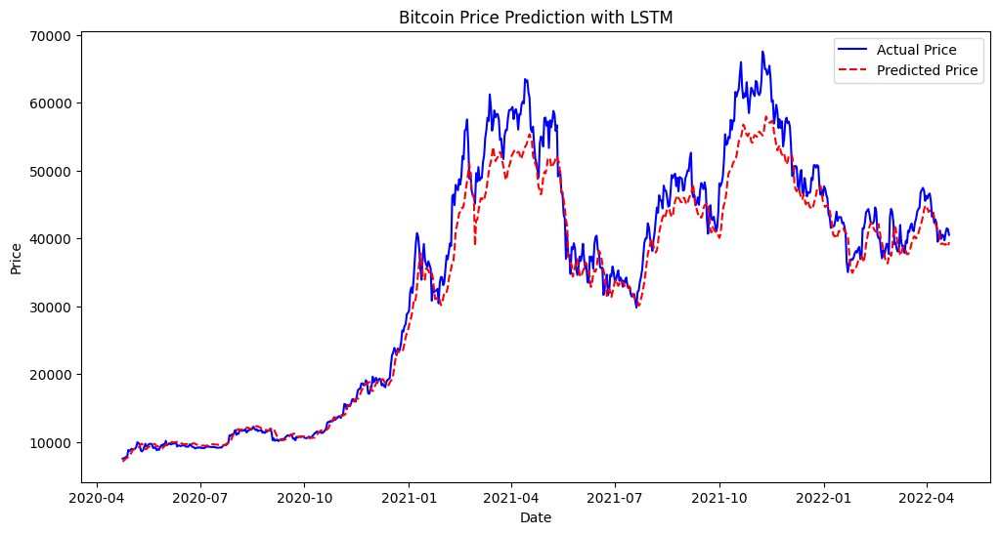

Metrics for LSTM Model on BTC: {'MSE': 0.03280954068946736, 'MAE': 0.1251749430512543, 'RMSE': 0.1811340406700722, 'R2': 0.9603574631684968}


In [12]:
# Define features and target
btc = get_crypto_data('BTC')
features = btc.drop(["Close"], axis=1)
label = btc["Close"]

# Splitting features and label into training, validation, and test sets (70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_btc_features, validation_label, test_btc_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)

# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_btc, y_train_btc = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_btc, y_validation_btc = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_btc = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_btc.shape[1], X_train_btc.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_btc.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_btc = model_lstm_btc.fit(X_train_btc, y_train_btc, epochs=100, batch_size=32, validation_data=(X_validation_btc, y_validation_btc), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_btc = model_lstm_btc.evaluate(X_validation_btc, y_validation_btc)

# prediction
y_pred_lstm_btc = model_lstm_btc.predict(X_validation_btc).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_btc = mean_squared_error(y_validation_btc, y_pred_lstm_btc)
mae_lstm_btc = mean_absolute_error(y_validation_btc, y_pred_lstm_btc)
rmse_lstm_btc = np.sqrt(mse_lstm_btc)
r2_lstm_btc = r2_score(y_validation_btc, y_pred_lstm_btc)

# Store metrics for later comparison
metrics_lstm_btc = {
    "MSE": mse_lstm_btc,
    "MAE": mae_lstm_btc,
    "RMSE": rmse_lstm_btc,
    "R2": r2_lstm_btc
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_btc = scaler_label.inverse_transform(y_validation_btc.reshape(-1, 1))
y_pred_actual_lstm_btc = scaler_label.inverse_transform(y_pred_lstm_btc)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_btc.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_btc.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('Bitcoin Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on BTC:", metrics_lstm_btc)

### GRU

Epoch 1/100
110/110 [==============================] - 1s 6ms/step - loss: 0.0029 - val_loss: 0.1611
Epoch 2/100
110/110 [==============================] - 1s 5ms/step - loss: 9.4013e-04 - val_loss: 0.1628
Epoch 3/100
110/110 [==============================] - 1s 5ms/step - loss: 7.2398e-04 - val_loss: 0.1105
Epoch 4/100
110/110 [==============================] - 1s 5ms/step - loss: 6.5069e-04 - val_loss: 0.0400
Epoch 5/100
110/110 [==============================] - 1s 5ms/step - loss: 5.6584e-04 - val_loss: 0.0475
Epoch 6/100
110/110 [==============================] - 1s 5ms/step - loss: 4.9618e-04 - val_loss: 0.0528
Epoch 7/100
110/110 [==============================] - 1s 5ms/step - loss: 4.7620e-04 - val_loss: 0.0358
Epoch 8/100
110/110 [==============================] - 1s 5ms/step - loss: 4.6041e-04 - val_loss: 0.0256
Epoch 9/100
110/110 [==============================] - 1s 5ms/step - loss: 4.5072e-04 - val_loss: 0.0541
Epoch 10/100
110/110 [==============================] - 1s 

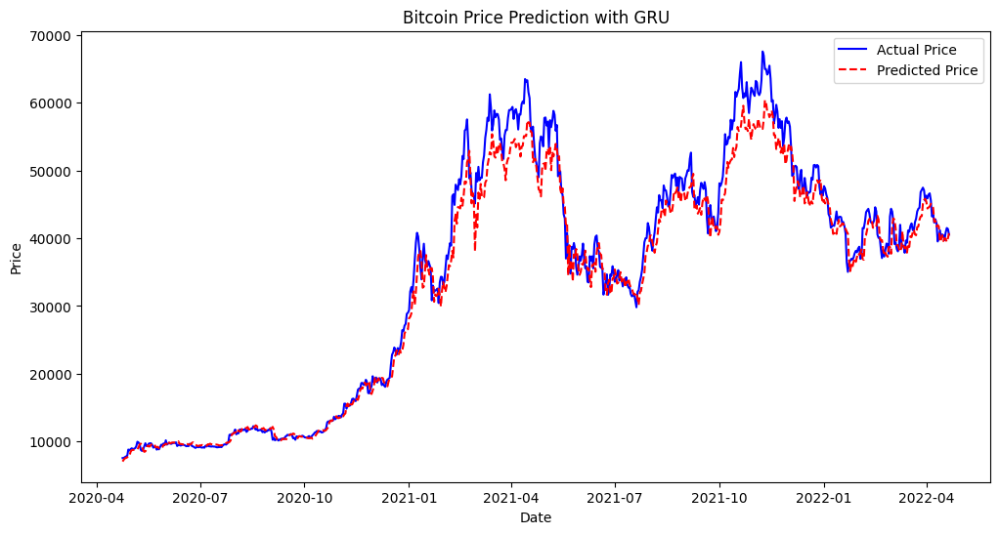

Metrics for GRU Model on BTC: {'MSE': 0.02274132784057835, 'MAE': 0.1032223953164667, 'RMSE': 0.1508022806212769, 'R2': 0.9725225069424143}


In [13]:
# Build the GRU model
model_gru_btc = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_btc.shape[1], X_train_btc.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_btc.compile(optimizer='adam', loss='mse')
history_gru_btc = model_gru_btc.fit(X_train_btc, y_train_btc, epochs=100, batch_size=32, validation_data=(X_validation_btc, y_validation_btc), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_btc = model_gru_btc.predict(X_validation_btc).reshape(-1,1)
mse_gru_btc = mean_squared_error(y_validation_btc, y_pred_gru_btc)
mae_gru_btc = mean_absolute_error(y_validation_btc, y_pred_gru_btc)
rmse_gru_btc = np.sqrt(mse_gru_btc)
r2_gru_btc = r2_score(y_validation_btc, y_pred_gru_btc)

# Store metrics
metrics_gru_btc = {
    "MSE": mse_gru_btc,
    "MAE": mae_gru_btc,
    "RMSE": rmse_gru_btc,
    "R2": r2_gru_btc
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_btc = scaler_label.inverse_transform(y_validation_btc.reshape(-1, 1))
y_pred_actual_gru_btc = scaler_label.inverse_transform(y_pred_gru_btc)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_btc.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_btc.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('Bitcoin Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on BTC:", metrics_gru_btc)

### Bi-LSTM

Epoch 1/100
110/110 [==============================] - 2s 9ms/step - loss: 0.0026 - val_loss: 0.4080
Epoch 2/100
110/110 [==============================] - 1s 6ms/step - loss: 9.9269e-04 - val_loss: 0.1206
Epoch 3/100
110/110 [==============================] - 1s 5ms/step - loss: 8.9616e-04 - val_loss: 0.1233
Epoch 4/100
110/110 [==============================] - 1s 5ms/step - loss: 7.7255e-04 - val_loss: 0.1089
Epoch 5/100
110/110 [==============================] - 1s 5ms/step - loss: 6.6630e-04 - val_loss: 0.0479
Epoch 6/100
110/110 [==============================] - 1s 5ms/step - loss: 6.5914e-04 - val_loss: 0.0467
Epoch 7/100
110/110 [==============================] - 1s 5ms/step - loss: 6.4258e-04 - val_loss: 0.0837
Epoch 8/100
110/110 [==============================] - 1s 7ms/step - loss: 6.1452e-04 - val_loss: 0.0706
Epoch 9/100
110/110 [==============================] - 1s 6ms/step - loss: 5.4587e-04 - val_loss: 0.0927
Epoch 10/100
110/110 [==============================] - 1s 

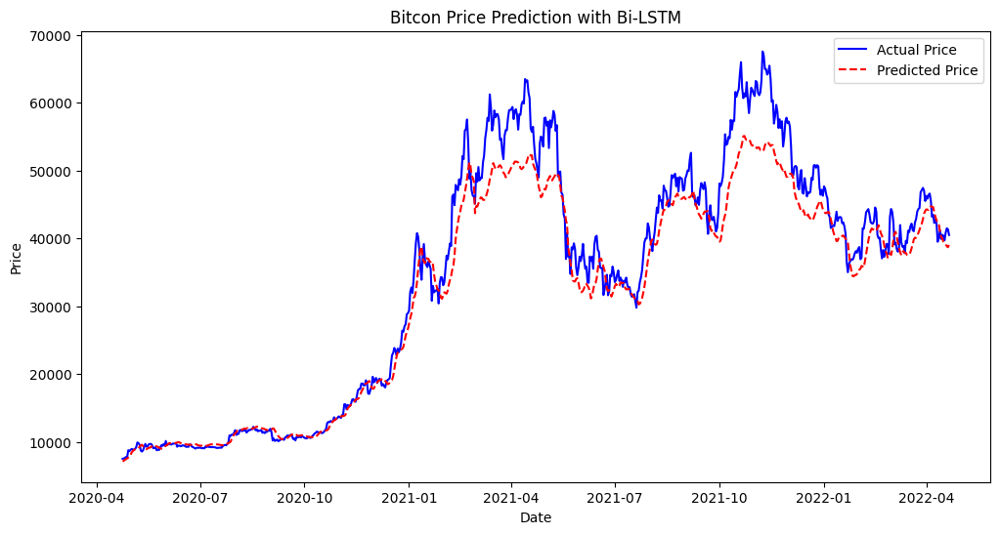

Metrics for Bi-LSTM Model on BTC: {'MSE': 0.04671660896555863, 'MAE': 0.14829639582163198, 'RMSE': 0.21614025299688772, 'R2': 0.9435540744355919}


In [14]:
# Build the Bi-LSTM model
model_bilstm_btc = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_btc.shape[1], X_train_btc.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_btc.compile(optimizer='adam', loss='mse')
history_bilstm_btc = model_bilstm_btc.fit(X_train_btc, y_train_btc, epochs=100, batch_size=32, validation_data=(X_validation_btc, y_validation_btc), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_btc = model_bilstm_btc.predict(X_validation_btc).reshape(-1, 1)
mse_bilstm_btc = mean_squared_error(y_validation_btc, y_pred_bilstm_btc)
mae_bilstm_btc = mean_absolute_error(y_validation_btc, y_pred_bilstm_btc)
rmse_bilstm_btc = np.sqrt(mse_bilstm_btc)
r2_bilstm_btc = r2_score(y_validation_btc, y_pred_bilstm_btc)

# Store metrics
metrics_bilstm_btc = {
    "MSE": mse_bilstm_btc,
    "MAE": mae_bilstm_btc,
    "RMSE": rmse_bilstm_btc,
    "R2": r2_bilstm_btc
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_btc = scaler_label.inverse_transform(y_validation_btc.reshape(-1, 1))
y_pred_actual_bilstm_btc = scaler_label.inverse_transform(y_pred_bilstm_btc)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_btc.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_btc.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('Bitcon Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on BTC:", metrics_bilstm_btc)

# 2. Ethereum (ETH)

## LSTM

Epoch 1/100
70/70 [==============================] - 1s 7ms/step - loss: 0.0019 - val_loss: 0.0043
Epoch 2/100
70/70 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 0.0026
Epoch 3/100
70/70 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 0.0039
Epoch 4/100
70/70 [==============================] - 0s 5ms/step - loss: 9.1905e-04 - val_loss: 0.0023
Epoch 5/100
70/70 [==============================] - 0s 5ms/step - loss: 8.3229e-04 - val_loss: 0.0023
Epoch 6/100
70/70 [==============================] - 0s 5ms/step - loss: 9.4860e-04 - val_loss: 0.0021
Epoch 7/100
70/70 [==============================] - 0s 5ms/step - loss: 9.0728e-04 - val_loss: 0.0019
Epoch 8/100
70/70 [==============================] - 0s 5ms/step - loss: 6.8402e-04 - val_loss: 0.0020
Epoch 9/100
70/70 [==============================] - 0s 5ms/step - loss: 6.4988e-04 - val_loss: 0.0021
Epoch 10/100
70/70 [==============================] - 0s 5ms/step - loss: 6.9471e-04 

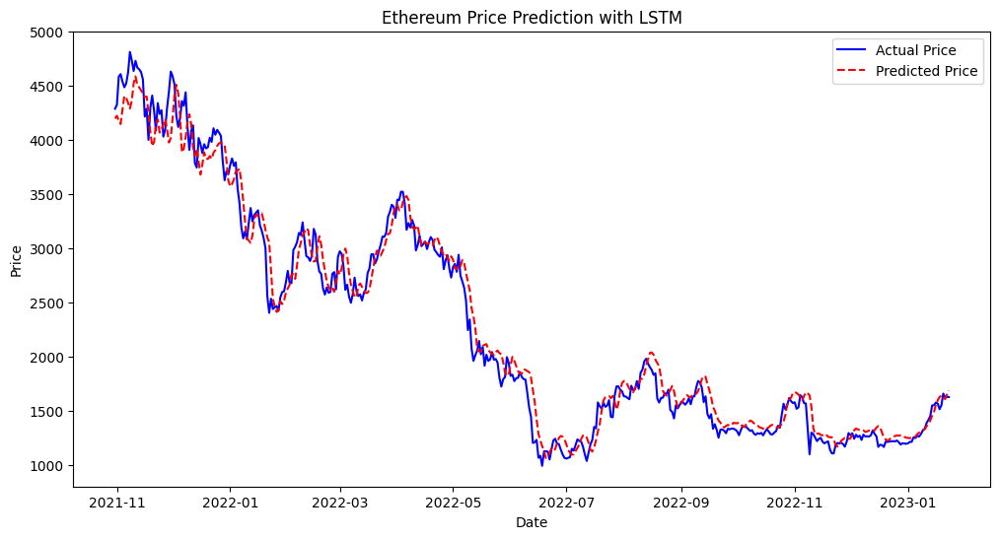

Metrics for LSTM Model on ETH: {'MSE': 0.0015585842816317047, 'MAE': 0.029283467806074718, 'RMSE': 0.03947890932677478, 'R2': 0.9761224171440134}


In [15]:
# Define features and target
eth = get_crypto_data('ETH')
features = eth.drop(["Close"], axis=1)
label = eth["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_eth_features, validation_label, test_eth_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)


# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_eth, y_train_eth = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_eth, y_validation_eth = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_eth = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_eth.shape[1], X_train_eth.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_eth.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_eth = model_lstm_eth.fit(X_train_eth, y_train_eth, epochs=100, batch_size=32, validation_data=(X_validation_eth, y_validation_eth), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_eth = model_lstm_eth.evaluate(X_validation_eth, y_validation_eth)

# prediction
y_pred_lstm_eth = model_lstm_eth.predict(X_validation_eth).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_eth = mean_squared_error(y_validation_eth, y_pred_lstm_eth)
mae_lstm_eth = mean_absolute_error(y_validation_eth, y_pred_lstm_eth)
rmse_lstm_eth = np.sqrt(mse_lstm_eth)
r2_lstm_eth = r2_score(y_validation_eth, y_pred_lstm_eth)

# Store metrics for later comparison
metrics_lstm_eth = {
    "MSE": mse_lstm_eth,
    "MAE": mae_lstm_eth,
    "RMSE": rmse_lstm_eth,
    "R2": r2_lstm_eth
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_eth = scaler_label.inverse_transform(y_validation_eth.reshape(-1, 1))
y_pred_actual_lstm_eth = scaler_label.inverse_transform(y_pred_lstm_eth)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_eth.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_eth.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('Ethereum Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on ETH:", metrics_lstm_eth)

## GRU

Epoch 1/100
70/70 [==============================] - 1s 7ms/step - loss: 0.0089 - val_loss: 0.0020
Epoch 2/100
70/70 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 3/100
70/70 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 0.0022
Epoch 4/100
70/70 [==============================] - 0s 5ms/step - loss: 7.7817e-04 - val_loss: 0.0019
Epoch 5/100
70/70 [==============================] - 0s 5ms/step - loss: 7.7136e-04 - val_loss: 0.0017
Epoch 6/100
70/70 [==============================] - 0s 5ms/step - loss: 8.3568e-04 - val_loss: 0.0016
Epoch 7/100
70/70 [==============================] - 0s 5ms/step - loss: 6.5361e-04 - val_loss: 0.0015
Epoch 8/100
70/70 [==============================] - 0s 5ms/step - loss: 7.0563e-04 - val_loss: 0.0017
Epoch 9/100
70/70 [==============================] - 0s 5ms/step - loss: 6.9360e-04 - val_loss: 0.0015
Epoch 10/100
70/70 [==============================] - 0s 5ms/step - loss: 6.2508e-04 

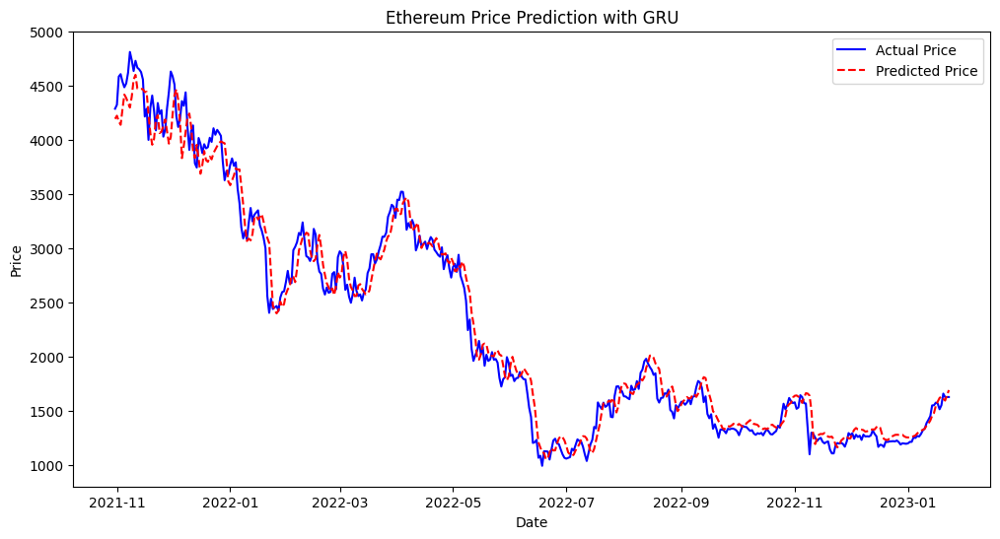

Metrics for GRU Model on ETH: {'MSE': 0.0014510599846792717, 'MAE': 0.028272058825790064, 'RMSE': 0.03809278126731194, 'R2': 0.977769694317132}


In [16]:
# Build the GRU model
model_gru_eth = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_eth.shape[1], X_train_eth.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_eth.compile(optimizer='adam', loss='mse')
history_gru_eth = model_gru_eth.fit(X_train_eth, y_train_eth, epochs=100, batch_size=32, validation_data=(X_validation_eth, y_validation_eth), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_eth = model_gru_eth.predict(X_validation_eth).reshape(-1,1)
mse_gru_eth = mean_squared_error(y_validation_eth, y_pred_gru_eth)
mae_gru_eth = mean_absolute_error(y_validation_eth, y_pred_gru_eth)
rmse_gru_eth = np.sqrt(mse_gru_eth)
r2_gru_eth = r2_score(y_validation_eth, y_pred_gru_eth)

# Store metrics
metrics_gru_eth = {
    "MSE": mse_gru_eth,
    "MAE": mae_gru_eth,
    "RMSE": rmse_gru_eth,
    "R2": r2_gru_eth
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_eth = scaler_label.inverse_transform(y_validation_eth.reshape(-1, 1))
y_pred_actual_gru_eth = scaler_label.inverse_transform(y_pred_gru_eth)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_eth.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_eth.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('Ethereum Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on ETH:", metrics_gru_eth)

## Bi-LSTM

Epoch 1/100
70/70 [==============================] - 0s 5ms/step - loss: 7.1902e-04 - val_loss: 0.0023
Epoch 2/100
70/70 [==============================] - 0s 5ms/step - loss: 7.0527e-04 - val_loss: 0.0024
Epoch 3/100
70/70 [==============================] - 0s 5ms/step - loss: 7.1943e-04 - val_loss: 0.0032
Epoch 4/100
70/70 [==============================] - 0s 5ms/step - loss: 7.3816e-04 - val_loss: 0.0028
Epoch 5/100
70/70 [==============================] - 0s 5ms/step - loss: 6.7061e-04 - val_loss: 0.0021
Epoch 6/100
70/70 [==============================] - 0s 5ms/step - loss: 5.7966e-04 - val_loss: 0.0018
Epoch 7/100
70/70 [==============================] - 0s 5ms/step - loss: 5.6750e-04 - val_loss: 0.0022
Epoch 8/100
70/70 [==============================] - 0s 5ms/step - loss: 5.6308e-04 - val_loss: 0.0020
Epoch 9/100
70/70 [==============================] - 0s 5ms/step - loss: 6.3005e-04 - val_loss: 0.0029
Epoch 10/100
70/70 [==============================] - 0s 5ms/step - loss:

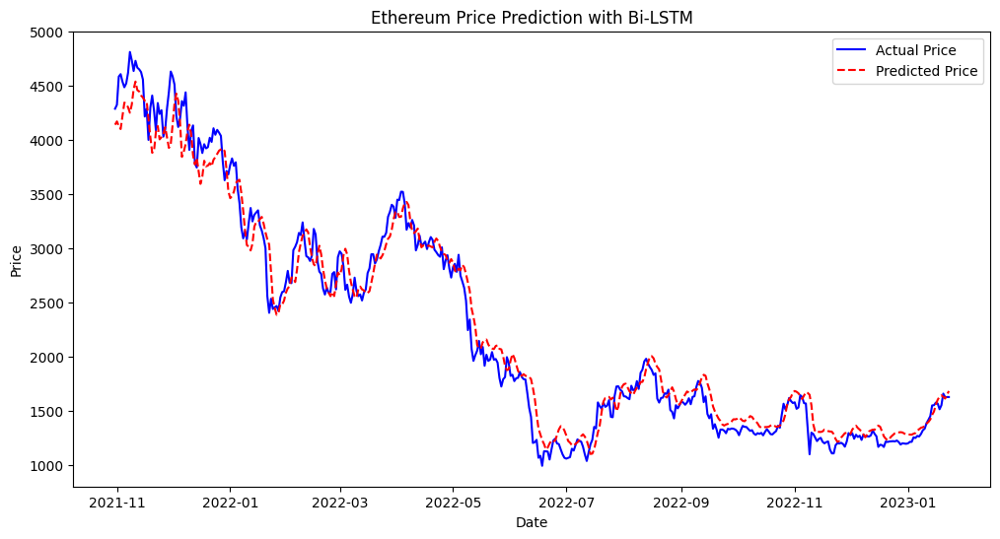

Metrics for Bi-LSTM Model on ETH: {'MSE': 0.0017837703873645522, 'MAE': 0.032056567112642896, 'RMSE': 0.04223470595806904, 'R2': 0.9726725556504637}


In [17]:
# Build the Bi-LSTM model
model_bilstm_eth = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_eth.shape[1], X_train_eth.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_eth.compile(optimizer='adam', loss='mse')
history_bilstm_eth = model_bilstm_btc.fit(X_train_eth, y_train_eth, epochs=100, batch_size=32, validation_data=(X_validation_eth, y_validation_eth), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_eth = model_bilstm_btc.predict(X_validation_eth).reshape(-1, 1)
mse_bilstm_eth = mean_squared_error(y_validation_eth, y_pred_bilstm_eth)
mae_bilstm_eth = mean_absolute_error(y_validation_eth, y_pred_bilstm_eth)
rmse_bilstm_eth = np.sqrt(mse_bilstm_eth)
r2_bilstm_eth = r2_score(y_validation_eth, y_pred_bilstm_eth)

# Store metrics
metrics_bilstm_eth = {
    "MSE": mse_bilstm_eth,
    "MAE": mae_bilstm_eth,
    "RMSE": rmse_bilstm_eth,
    "R2": r2_bilstm_eth
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_eth = scaler_label.inverse_transform(y_validation_eth.reshape(-1, 1))
y_pred_actual_bilstm_eth = scaler_label.inverse_transform(y_pred_bilstm_eth)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_eth.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_eth.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('Ethereum Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on ETH:", metrics_bilstm_eth)

# 3. BNB (BNB)

## LSTM

Epoch 1/200
54/54 [==============================] - 1s 8ms/step - loss: 0.0043 - val_loss: 7.1981e-04
Epoch 2/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 9.7345e-04
Epoch 3/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 7.3732e-04
Epoch 4/200
54/54 [==============================] - 0s 6ms/step - loss: 0.0015 - val_loss: 6.3143e-04
Epoch 5/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 0.0011
Epoch 6/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 0.0013
Epoch 7/200
54/54 [==============================] - 0s 6ms/step - loss: 0.0012 - val_loss: 7.7776e-04
Epoch 8/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 5.2183e-04
Epoch 9/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 5.3889e-04
Epoch 10/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0012 

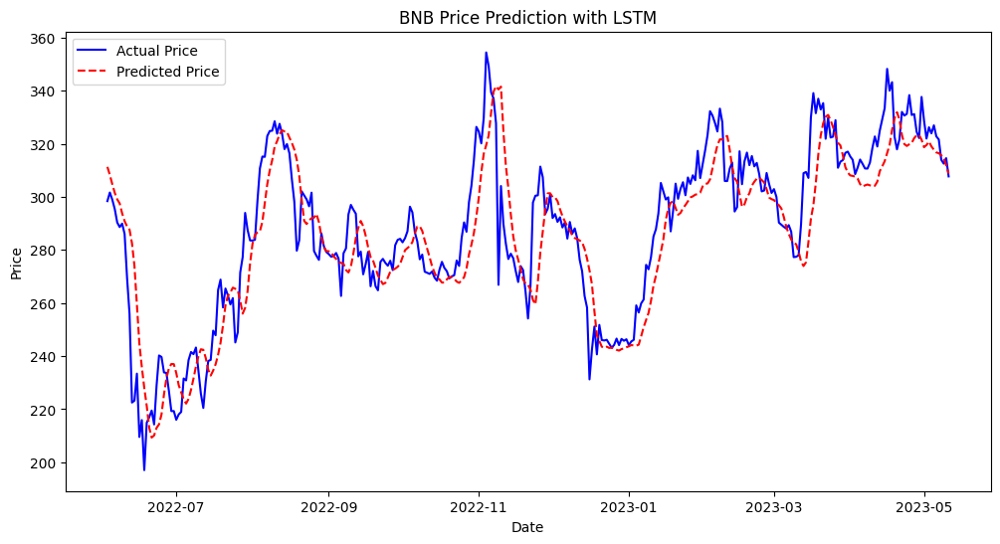

Metrics for LSTM Model on BNB: {'MSE': 0.0005057758455406722, 'MAE': 0.016702178280995395, 'RMSE': 0.022489460765893702, 'R2': 0.768881977100037}


In [18]:
# Define features and target
bnb = get_crypto_data('BNB')
features = bnb.drop(["Close"], axis=1)
label = bnb["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_bnb_features, validation_label, test_bnb_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)

# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_bnb, y_train_bnb = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_bnb, y_validation_bnb = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_bnb = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_bnb.shape[1], X_train_bnb.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_bnb.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_bnb = model_lstm_bnb.fit(X_train_bnb, y_train_bnb, epochs=200, batch_size=32, validation_data=(X_validation_bnb, y_validation_bnb), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_bnb = model_lstm_bnb.evaluate(X_validation_bnb, y_validation_bnb)

# prediction
y_pred_lstm_bnb = model_lstm_bnb.predict(X_validation_bnb).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_bnb = mean_squared_error(y_validation_bnb, y_pred_lstm_bnb)
mae_lstm_bnb = mean_absolute_error(y_validation_bnb, y_pred_lstm_bnb)
rmse_lstm_bnb = np.sqrt(mse_lstm_bnb)
r2_lstm_bnb = r2_score(y_validation_bnb, y_pred_lstm_bnb)

# Store metrics for later comparison
metrics_lstm_bnb = {
    "MSE": mse_lstm_bnb,
    "MAE": mae_lstm_bnb,
    "RMSE": rmse_lstm_bnb,
    "R2": r2_lstm_bnb
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_bnb = scaler_label.inverse_transform(y_validation_bnb.reshape(-1, 1))
y_pred_actual_lstm_bnb = scaler_label.inverse_transform(y_pred_lstm_bnb)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_bnb.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_bnb.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('BNB Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on BNB:", metrics_lstm_bnb)

## GRU

Epoch 1/200
54/54 [==============================] - 1s 8ms/step - loss: 0.0282 - val_loss: 8.9621e-04
Epoch 2/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0022 - val_loss: 5.0764e-04
Epoch 3/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 4.8708e-04
Epoch 4/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 4.7979e-04
Epoch 5/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 5.3484e-04
Epoch 6/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 8.3007e-04
Epoch 7/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 7.4569e-04
Epoch 8/200
54/54 [==============================] - 0s 6ms/step - loss: 0.0013 - val_loss: 5.8372e-04
Epoch 9/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 5.7787e-04
Epoch 10/200
54/54 [==============================] - 0s 5ms/step - loss:

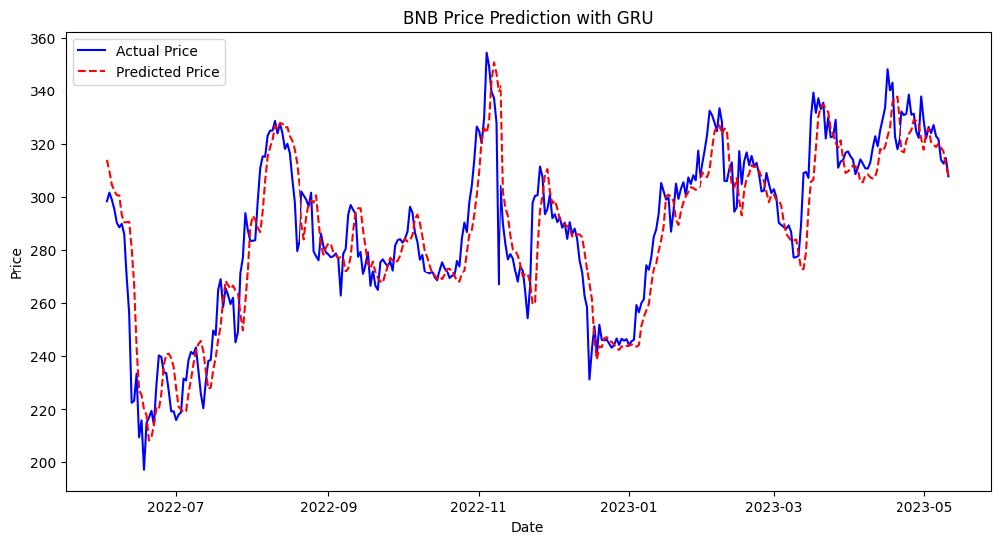

Metrics for GRU Model on BNB: {'MSE': 0.00037888870381174697, 'MAE': 0.01402327550442442, 'RMSE': 0.019465063673457298, 'R2': 0.826863997369248}


In [19]:
# Build the GRU model
model_gru_bnb = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_bnb.shape[1], X_train_bnb.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_bnb.compile(optimizer='adam', loss='mse')
history_gru_bnb = model_gru_bnb.fit(X_train_bnb, y_train_bnb, epochs=200, batch_size=32, validation_data=(X_validation_bnb, y_validation_bnb), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_bnb = model_gru_bnb.predict(X_validation_bnb).reshape(-1,1)
mse_gru_bnb = mean_squared_error(y_validation_bnb, y_pred_gru_bnb)
mae_gru_bnb = mean_absolute_error(y_validation_bnb, y_pred_gru_bnb)
rmse_gru_bnb = np.sqrt(mse_gru_bnb)
r2_gru_bnb = r2_score(y_validation_bnb, y_pred_gru_bnb)

# Store metrics
metrics_gru_bnb = {
    "MSE": mse_gru_bnb,
    "MAE": mae_gru_bnb,
    "RMSE": rmse_gru_bnb,
    "R2": r2_gru_bnb
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_bnb = scaler_label.inverse_transform(y_validation_bnb.reshape(-1, 1))
y_pred_actual_gru_bnb = scaler_label.inverse_transform(y_pred_gru_bnb)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_bnb.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_bnb.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('BNB Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on BNB:", metrics_gru_bnb)

## Bi-LSTM

Epoch 1/200
54/54 [==============================] - 1s 10ms/step - loss: 0.0087 - val_loss: 0.0012
Epoch 2/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0027 - val_loss: 0.0021
Epoch 3/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 8.8067e-04
Epoch 4/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 5/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 7.1606e-04
Epoch 6/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 0.0027
Epoch 7/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 7.3608e-04
Epoch 8/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 0.0014
Epoch 9/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 5.8929e-04
Epoch 10/200
54/54 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss:

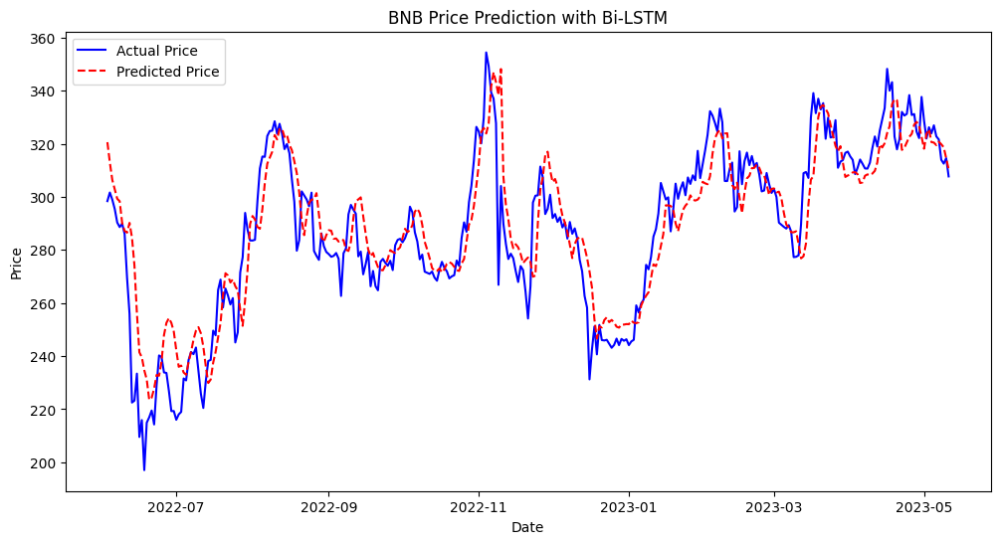

Metrics for Bi-LSTM Model on BNB: {'MSE': 0.0004233478679182233, 'MAE': 0.015231084225562918, 'RMSE': 0.020575419021692444, 'R2': 0.8065480526702884}


In [20]:
# Build the Bi-LSTM model
model_bilstm_bnb = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_bnb.shape[1], X_train_bnb.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_bnb.compile(optimizer='adam', loss='mse')
history_bilstm_bnb = model_bilstm_bnb.fit(X_train_bnb, y_train_bnb, epochs=200, batch_size=32, validation_data=(X_validation_bnb, y_validation_bnb), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_bnb = model_bilstm_bnb.predict(X_validation_bnb).reshape(-1, 1)
mse_bilstm_bnb = mean_squared_error(y_validation_bnb, y_pred_bilstm_bnb)
mae_bilstm_bnb = mean_absolute_error(y_validation_bnb, y_pred_bilstm_bnb)
rmse_bilstm_bnb = np.sqrt(mse_bilstm_bnb)
r2_bilstm_bnb = r2_score(y_validation_bnb, y_pred_bilstm_bnb)

# Store metrics
metrics_bilstm_bnb = {
    "MSE": mse_bilstm_bnb,
    "MAE": mae_bilstm_bnb,
    "RMSE": rmse_bilstm_bnb,
    "R2": r2_bilstm_bnb
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_bnb = scaler_label.inverse_transform(y_validation_bnb.reshape(-1, 1))
y_pred_actual_bilstm_bnb = scaler_label.inverse_transform(y_pred_bilstm_bnb)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_bnb.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_bnb.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('BNB Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on BNB:", metrics_bilstm_bnb)

# 4. ADA

## LSTM

Epoch 1/150
53/53 [==============================] - 1s 8ms/step - loss: 0.0021 - val_loss: 1.2646e-04
Epoch 2/150
53/53 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 1.1373e-04
Epoch 3/150
53/53 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 1.8606e-04
Epoch 4/150
53/53 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 6.3366e-05
Epoch 5/150
53/53 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 1.8257e-04
Epoch 6/150
53/53 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 8.9115e-05
Epoch 7/150
53/53 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 6.0445e-05
Epoch 8/150
53/53 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 6.1602e-05
Epoch 9/150
53/53 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 1.2659e-04
Epoch 10/150
53/53 [==============================] - 0s 7ms/step - loss:

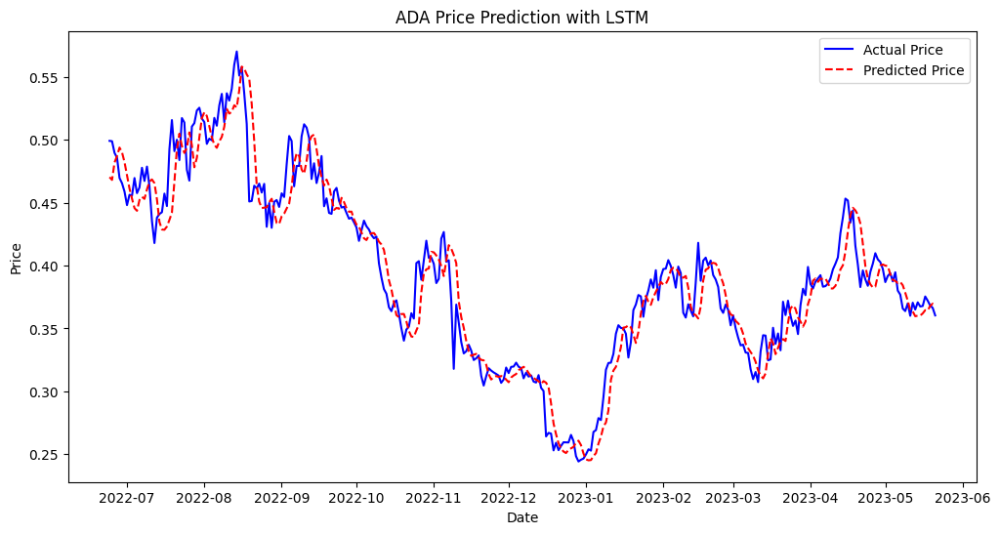

Metrics for LSTM Model on ADA: {'MSE': 5.061485099407718e-05, 'MAE': 0.0052918304518501024, 'RMSE': 0.007114411500192913, 'R2': 0.9134250217942529}


In [21]:
# Define features and target
ada = get_crypto_data('ADA')
features = ada.drop(["Close"], axis=1)
label = ada["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_ada_features, validation_label, test_ada_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)

# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_ada, y_train_ada = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_ada, y_validation_ada = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_ada = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_ada.shape[1], X_train_ada.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_ada.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_ada = model_lstm_ada.fit(X_train_ada, y_train_ada, epochs=150, batch_size=32, validation_data=(X_validation_ada, y_validation_ada), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_ada = model_lstm_ada.evaluate(X_validation_ada, y_validation_ada)

# prediction
y_pred_lstm_ada = model_lstm_ada.predict(X_validation_ada).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_ada = mean_squared_error(y_validation_ada, y_pred_lstm_ada)
mae_lstm_ada = mean_absolute_error(y_validation_ada, y_pred_lstm_ada)
rmse_lstm_ada = np.sqrt(mse_lstm_ada)
r2_lstm_ada = r2_score(y_validation_ada, y_pred_lstm_ada)

# Store metrics for later comparison
metrics_lstm_ada = {
    "MSE": mse_lstm_ada,
    "MAE": mae_lstm_ada,
    "RMSE": rmse_lstm_ada,
    "R2": r2_lstm_ada
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_ada = scaler_label.inverse_transform(y_validation_ada.reshape(-1, 1))
y_pred_actual_lstm_ada = scaler_label.inverse_transform(y_pred_lstm_ada)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_ada.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_ada.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('ADA Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on ADA:", metrics_lstm_ada)

## GRU

Epoch 1/200
53/53 [==============================] - 1s 8ms/step - loss: 0.0698 - val_loss: 8.0134e-04
Epoch 2/200
53/53 [==============================] - 0s 5ms/step - loss: 0.0026 - val_loss: 1.3978e-04
Epoch 3/200
53/53 [==============================] - 0s 5ms/step - loss: 0.0023 - val_loss: 9.5616e-05
Epoch 4/200
53/53 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 9.5337e-05
Epoch 5/200
53/53 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 1.8053e-04
Epoch 6/200
53/53 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 8.8813e-05
Epoch 7/200
53/53 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 8.0439e-05
Epoch 8/200
53/53 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 8.4479e-05
Epoch 9/200
53/53 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 1.0011e-04
Epoch 10/200
53/53 [==============================] - 0s 5ms/step - loss:

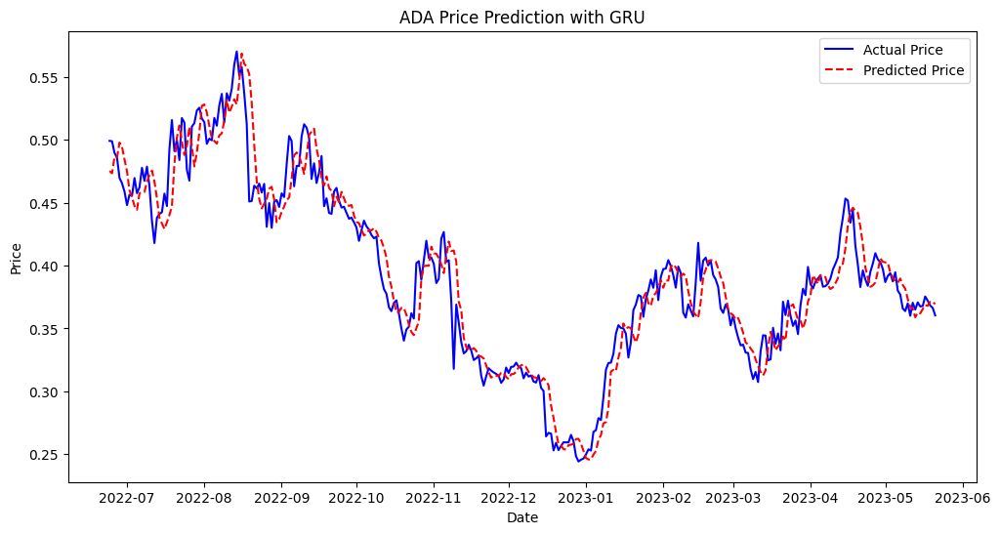

Metrics for GRU Model on ADA: {'MSE': 5.0057804412115056e-05, 'MAE': 0.005248158391125462, 'RMSE': 0.007075154020381115, 'R2': 0.914377830994434}


In [22]:
# Build the GRU model
model_gru_ada = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_ada.shape[1], X_train_ada.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_ada.compile(optimizer='adam', loss='mse')
history_gru_ada = model_gru_ada.fit(X_train_ada, y_train_ada, epochs=200, batch_size=32, validation_data=(X_validation_ada, y_validation_ada), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_ada = model_gru_ada.predict(X_validation_ada).reshape(-1,1)
mse_gru_ada = mean_squared_error(y_validation_ada, y_pred_gru_ada)
mae_gru_ada = mean_absolute_error(y_validation_ada, y_pred_gru_ada)
rmse_gru_ada = np.sqrt(mse_gru_ada)
r2_gru_ada = r2_score(y_validation_ada, y_pred_gru_ada)

# Store metrics
metrics_gru_ada = {
    "MSE": mse_gru_ada,
    "MAE": mae_gru_ada,
    "RMSE": rmse_gru_ada,
    "R2": r2_gru_ada
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_ada = scaler_label.inverse_transform(y_validation_ada.reshape(-1, 1))
y_pred_actual_gru_ada = scaler_label.inverse_transform(y_pred_gru_ada)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_ada.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_ada.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('ADA Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on ADA:", metrics_gru_ada)

## Bi-LSTM

Epoch 1/200
53/53 [==============================] - 2s 10ms/step - loss: 0.0068 - val_loss: 3.2411e-04
Epoch 2/200
53/53 [==============================] - 0s 5ms/step - loss: 0.0027 - val_loss: 1.8202e-04
Epoch 3/200
53/53 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 8.5937e-05
Epoch 4/200
53/53 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 4.6952e-04
Epoch 5/200
53/53 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 1.0111e-04
Epoch 6/200
53/53 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 1.0850e-04
Epoch 7/200
53/53 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 7.6220e-05
Epoch 8/200
53/53 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 7.6584e-05
Epoch 9/200
53/53 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 7.9930e-05
Epoch 10/200
53/53 [==============================] - 0s 5ms/step - loss

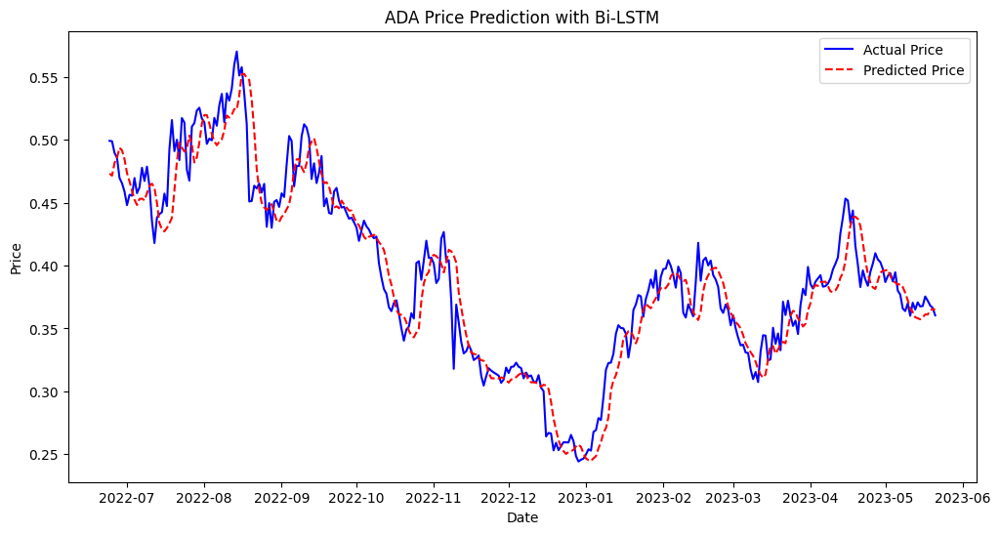

Metrics for Bi-LSTM Model on ADA: {'MSE': 5.4157851807111435e-05, 'MAE': 0.005516504479865151, 'RMSE': 0.007359201845792207, 'R2': 0.907364839611611}


In [23]:
# Build the Bi-LSTM model
model_bilstm_ada = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_ada.shape[1], X_train_ada.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_ada.compile(optimizer='adam', loss='mse')
history_bilstm_ada = model_bilstm_ada.fit(X_train_ada, y_train_ada, epochs=200, batch_size=32, validation_data=(X_validation_ada, y_validation_ada), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_ada = model_bilstm_ada.predict(X_validation_ada).reshape(-1, 1)
mse_bilstm_ada = mean_squared_error(y_validation_ada, y_pred_bilstm_ada)
mae_bilstm_ada = mean_absolute_error(y_validation_ada, y_pred_bilstm_ada)
rmse_bilstm_ada = np.sqrt(mse_bilstm_ada)
r2_bilstm_ada = r2_score(y_validation_ada, y_pred_bilstm_ada)

# Store metrics
metrics_bilstm_ada = {
    "MSE": mse_bilstm_ada,
    "MAE": mae_bilstm_ada,
    "RMSE": rmse_bilstm_ada,
    "R2": r2_bilstm_ada
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_ada = scaler_label.inverse_transform(y_validation_ada.reshape(-1, 1))
y_pred_actual_bilstm_ada = scaler_label.inverse_transform(y_pred_bilstm_ada)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_ada.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_ada.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('ADA Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on ADA:", metrics_bilstm_ada)

# 5.  SOL

## LSTM

Epoch 1/100
32/32 [==============================] - 1s 10ms/step - loss: 0.0208 - val_loss: 1.1880e-04
Epoch 2/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0024 - val_loss: 4.8866e-05
Epoch 3/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0025 - val_loss: 8.0311e-05
Epoch 4/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0022 - val_loss: 9.9387e-05
Epoch 5/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 1.6198e-04
Epoch 6/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 4.2303e-05
Epoch 7/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 4.6967e-05
Epoch 8/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 7.3610e-05
Epoch 9/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 7.3742e-05
Epoch 10/100
32/32 [==============================] - 0s 5ms/step - loss

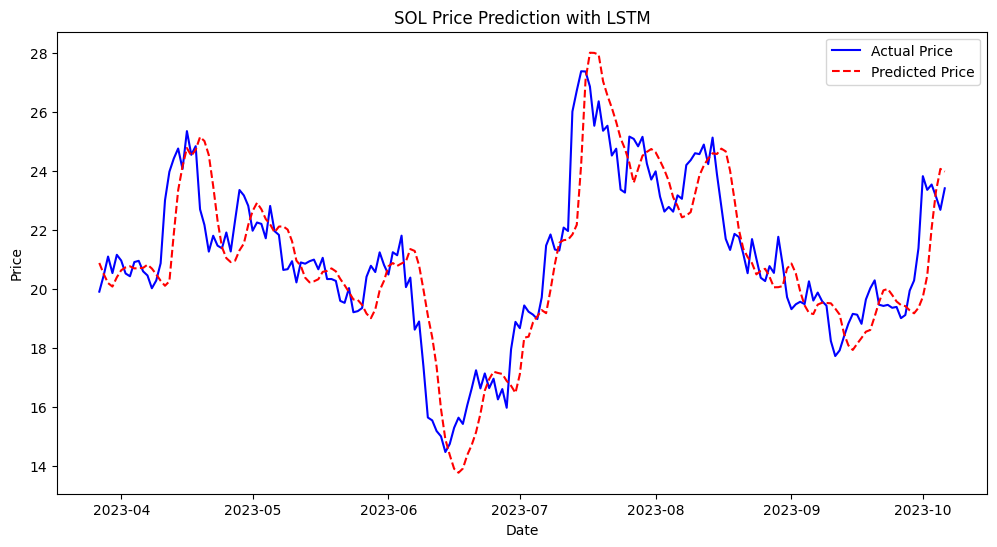

Metrics for LSTM Model on SOL: {'MSE': 2.739578152292287e-05, 'MAE': 0.003971069698233868, 'RMSE': 0.005234097966500328, 'R2': 0.7379651837893497}


In [24]:
# Define features and target
sol = get_crypto_data('SOL')
features = sol.drop(["Close"], axis=1)
label = sol["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_sol_features, validation_label, test_sol_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)

# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_sol, y_train_sol = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_sol, y_validation_sol = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_sol = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_sol.shape[1], X_train_sol.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_sol.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_sol = model_lstm_sol.fit(X_train_sol, y_train_sol, epochs=100, batch_size=32, validation_data=(X_validation_sol, y_validation_sol), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_sol = model_lstm_sol.evaluate(X_validation_sol, y_validation_sol)

# prediction
y_pred_lstm_sol = model_lstm_sol.predict(X_validation_sol).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_sol = mean_squared_error(y_validation_sol, y_pred_lstm_sol)
mae_lstm_sol = mean_absolute_error(y_validation_sol, y_pred_lstm_sol)
rmse_lstm_sol = np.sqrt(mse_lstm_sol)
r2_lstm_sol = r2_score(y_validation_sol, y_pred_lstm_sol)

# Store metrics for later comparison
metrics_lstm_sol = {
    "MSE": mse_lstm_sol,
    "MAE": mae_lstm_sol,
    "RMSE": rmse_lstm_sol,
    "R2": r2_lstm_sol
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_sol = scaler_label.inverse_transform(y_validation_sol.reshape(-1, 1))
y_pred_actual_lstm_sol = scaler_label.inverse_transform(y_pred_lstm_sol)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_sol.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_sol.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('SOL Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on SOL:", metrics_lstm_sol)

## GRU

Epoch 1/100
32/32 [==============================] - 1s 10ms/step - loss: 0.0142 - val_loss: 2.3352e-04
Epoch 2/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0024 - val_loss: 4.3383e-05
Epoch 3/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0023 - val_loss: 5.7337e-05
Epoch 4/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 1.0008e-04
Epoch 5/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0022 - val_loss: 5.6311e-05
Epoch 6/100
32/32 [==============================] - 0s 6ms/step - loss: 0.0019 - val_loss: 1.2088e-04
Epoch 7/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 4.8207e-05
Epoch 8/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 1.5617e-04
Epoch 9/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 2.8924e-05
Epoch 10/100
32/32 [==============================] - 0s 5ms/step - loss

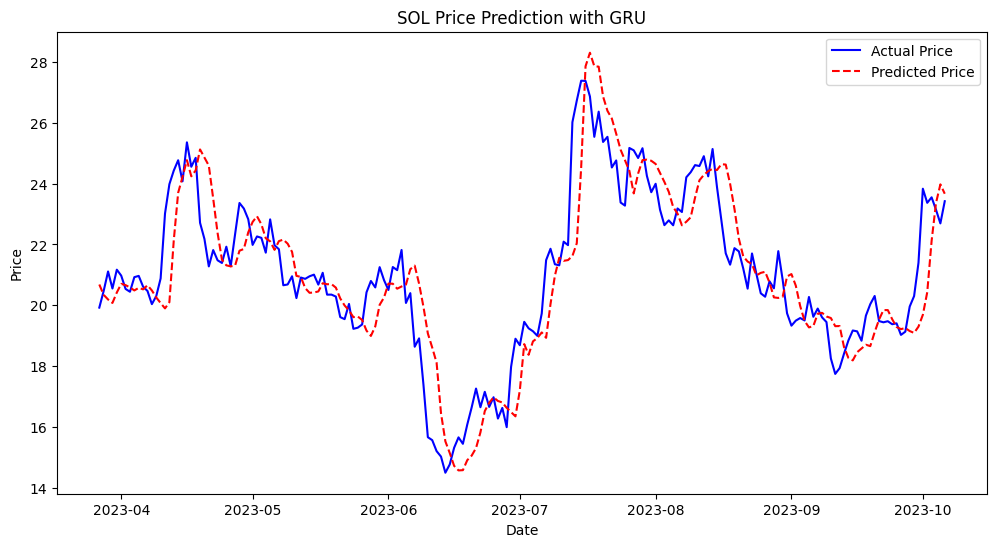

Metrics for GRU Model on SOL: {'MSE': 2.6586160191516243e-05, 'MAE': 0.003801625086998099, 'RMSE': 0.005156176896840938, 'R2': 0.7457090394117143}


In [25]:
# Build the GRU model
model_gru_sol = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_sol.shape[1], X_train_sol.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_sol.compile(optimizer='adam', loss='mse')
history_gru_sol = model_gru_sol.fit(X_train_sol, y_train_sol, epochs=100, batch_size=32, validation_data=(X_validation_sol, y_validation_sol), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_sol = model_gru_sol.predict(X_validation_sol).reshape(-1,1)
mse_gru_sol = mean_squared_error(y_validation_sol, y_pred_gru_sol)
mae_gru_sol = mean_absolute_error(y_validation_sol, y_pred_gru_sol)
rmse_gru_sol = np.sqrt(mse_gru_sol)
r2_gru_sol = r2_score(y_validation_sol, y_pred_gru_sol)

# Store metrics
metrics_gru_sol = {
    "MSE": mse_gru_sol,
    "MAE": mae_gru_sol,
    "RMSE": rmse_gru_sol,
    "R2": r2_gru_sol
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_sol = scaler_label.inverse_transform(y_validation_sol.reshape(-1, 1))
y_pred_actual_gru_sol = scaler_label.inverse_transform(y_pred_gru_sol)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_sol.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_sol.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('SOL Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on SOL:", metrics_gru_sol)

## Bi-LSTM

Epoch 1/100
32/32 [==============================] - 1s 10ms/step - loss: 0.0056 - val_loss: 8.2662e-05
Epoch 2/100
32/32 [==============================] - 0s 6ms/step - loss: 0.0024 - val_loss: 1.4082e-04
Epoch 3/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 1.1253e-04
Epoch 4/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 1.1053e-04
Epoch 5/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 1.5948e-04
Epoch 6/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 2.7217e-05
Epoch 7/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 1.5751e-04
Epoch 8/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 1.4898e-04
Epoch 9/100
32/32 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 7.5559e-05
Epoch 10/100
32/32 [==============================] - 0s 5ms/step - loss

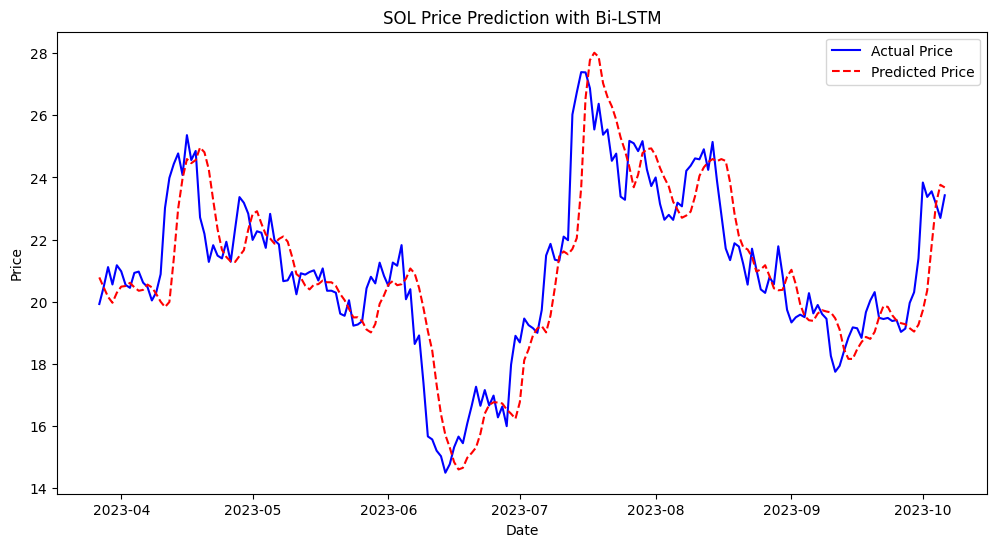

Metrics for Bi-LSTM Model on SOL: {'MSE': 2.7217396854876395e-05, 'MAE': 0.0038364243980575823, 'RMSE': 0.005217029504888428, 'R2': 0.739671395151389}


In [26]:
# Build the GRU model
model_bilstm_sol = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_sol.shape[1], X_train_sol.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_bilstm_sol.compile(optimizer='adam', loss='mse')
history_bilstm_sol = model_bilstm_sol.fit(X_train_sol, y_train_sol, epochs=100, batch_size=32, validation_data=(X_validation_sol, y_validation_sol), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_sol = model_bilstm_sol.predict(X_validation_sol).reshape(-1,1)
mse_bilstm_sol = mean_squared_error(y_validation_sol, y_pred_bilstm_sol)
mae_bilstm_sol = mean_absolute_error(y_validation_sol, y_pred_bilstm_sol)
rmse_bilstm_sol = np.sqrt(mse_bilstm_sol)
r2_bilstm_sol = r2_score(y_validation_sol, y_pred_bilstm_sol)

# Store metrics
metrics_bilstm_sol = {
    "MSE": mse_bilstm_sol,
    "MAE": mae_bilstm_sol,
    "RMSE": rmse_bilstm_sol,
    "R2": r2_bilstm_sol
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_bilstm_sol = scaler_label.inverse_transform(y_validation_sol.reshape(-1, 1))
y_pred_actual_bilstm_sol = scaler_label.inverse_transform(y_pred_bilstm_sol)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_sol.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_sol.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('SOL Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for Bi-LSTM Model on SOL:", metrics_bilstm_sol)

# 6. XRP

## LSTM

Epoch 1/200
86/86 [==============================] - 1s 7ms/step - loss: 0.0019 - val_loss: 0.0012
Epoch 2/200
86/86 [==============================] - 1s 6ms/step - loss: 6.4324e-04 - val_loss: 9.8411e-04
Epoch 3/200
86/86 [==============================] - 0s 5ms/step - loss: 6.7586e-04 - val_loss: 0.0010
Epoch 4/200
86/86 [==============================] - 0s 5ms/step - loss: 6.4327e-04 - val_loss: 9.7825e-04
Epoch 5/200
86/86 [==============================] - 0s 5ms/step - loss: 5.6609e-04 - val_loss: 0.0012
Epoch 6/200
86/86 [==============================] - 0s 5ms/step - loss: 4.9768e-04 - val_loss: 0.0016
Epoch 7/200
86/86 [==============================] - 0s 5ms/step - loss: 4.4006e-04 - val_loss: 8.3496e-04
Epoch 8/200
86/86 [==============================] - 0s 5ms/step - loss: 4.1473e-04 - val_loss: 8.7345e-04
Epoch 9/200
86/86 [==============================] - 0s 5ms/step - loss: 4.5165e-04 - val_loss: 8.1822e-04
Epoch 10/200
86/86 [==============================] - 0s 

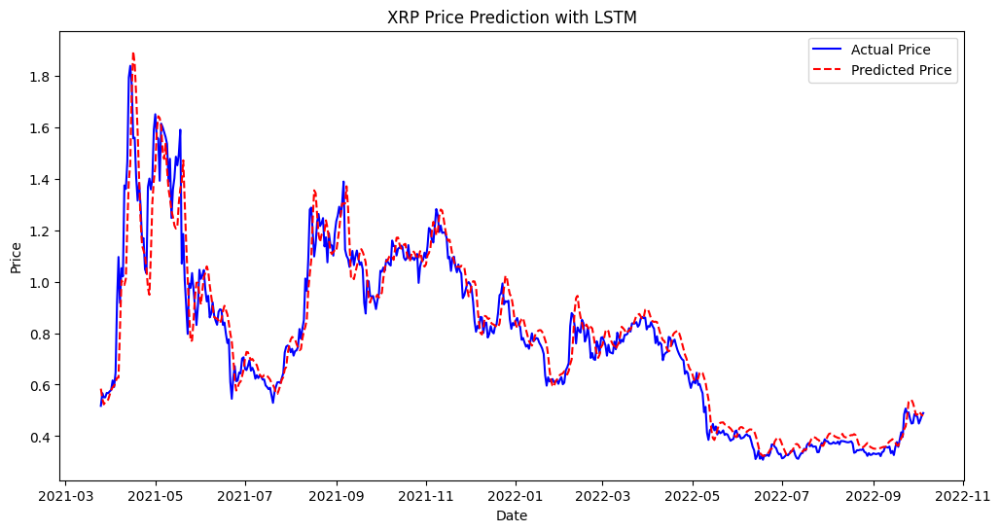

Metrics for LSTM Model on XRP: {'MSE': 0.0007452432316425694, 'MAE': 0.017654760861518744, 'RMSE': 0.02729914342323893, 'R2': 0.9217564926820245}


In [27]:
# Define features and target
xrp = get_crypto_data('XRP')
features = xrp.drop(["Close"], axis=1)
label = xrp["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_xrp_features, validation_label, test_xrp_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)


# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_xrp, y_train_xrp = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_xrp, y_validation_xrp = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_xrp = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_xrp.shape[1], X_train_xrp.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_xrp.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_xrp = model_lstm_xrp.fit(X_train_xrp, y_train_xrp, epochs=200, batch_size=32, validation_data=(X_validation_xrp, y_validation_xrp), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_xrp = model_lstm_xrp.evaluate(X_validation_xrp, y_validation_xrp)

# prediction
y_pred_lstm_xrp = model_lstm_xrp.predict(X_validation_xrp).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_xrp = mean_squared_error(y_validation_xrp, y_pred_lstm_xrp)
mae_lstm_xrp = mean_absolute_error(y_validation_xrp, y_pred_lstm_xrp)
rmse_lstm_xrp = np.sqrt(mse_lstm_xrp)
r2_lstm_xrp = r2_score(y_validation_xrp, y_pred_lstm_xrp)

# Store metrics for later comparison
metrics_lstm_xrp = {
    "MSE": mse_lstm_xrp,
    "MAE": mae_lstm_xrp,
    "RMSE": rmse_lstm_xrp,
    "R2": r2_lstm_xrp
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_xrp = scaler_label.inverse_transform(y_validation_xrp.reshape(-1, 1))
y_pred_actual_lstm_xrp = scaler_label.inverse_transform(y_pred_lstm_xrp)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_xrp.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_xrp.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('XRP Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on XRP:", metrics_lstm_xrp)

## GRU

Epoch 1/200
86/86 [==============================] - 1s 7ms/step - loss: 0.0019 - val_loss: 0.0010
Epoch 2/200
86/86 [==============================] - 0s 5ms/step - loss: 7.3104e-04 - val_loss: 0.0013
Epoch 3/200
86/86 [==============================] - 0s 5ms/step - loss: 5.8516e-04 - val_loss: 8.6303e-04
Epoch 4/200
86/86 [==============================] - 0s 5ms/step - loss: 6.3010e-04 - val_loss: 0.0011
Epoch 5/200
86/86 [==============================] - 0s 5ms/step - loss: 4.7042e-04 - val_loss: 7.5339e-04
Epoch 6/200
86/86 [==============================] - 0s 5ms/step - loss: 6.2444e-04 - val_loss: 7.5498e-04
Epoch 7/200
86/86 [==============================] - 0s 5ms/step - loss: 4.2752e-04 - val_loss: 0.0010
Epoch 8/200
86/86 [==============================] - 0s 5ms/step - loss: 4.4246e-04 - val_loss: 0.0012
Epoch 9/200
86/86 [==============================] - 0s 5ms/step - loss: 4.6343e-04 - val_loss: 0.0011
Epoch 10/200
86/86 [==============================] - 0s 5ms/step

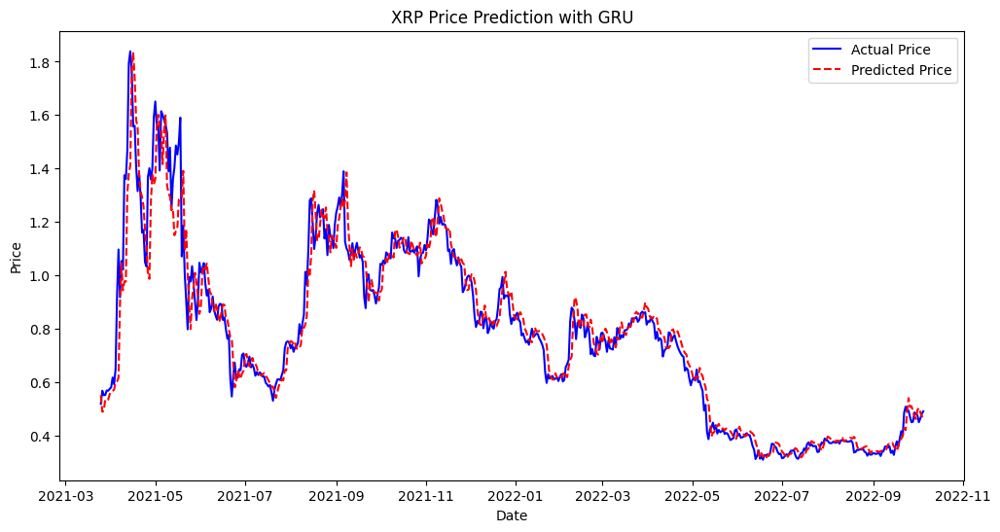

Metrics for GRU Model on XRP: {'MSE': 0.000647777798705932, 'MAE': 0.015320901347254317, 'RMSE': 0.025451479302899704, 'R2': 0.9319894434710161}


In [28]:
# Build the GRU model
model_gru_xrp = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_xrp.shape[1], X_train_xrp.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_xrp.compile(optimizer='adam', loss='mse')
history_gru_xrp = model_gru_xrp.fit(X_train_xrp, y_train_xrp, epochs=200, batch_size=32, validation_data=(X_validation_xrp, y_validation_xrp), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_xrp = model_gru_xrp.predict(X_validation_xrp).reshape(-1,1)
mse_gru_xrp = mean_squared_error(y_validation_xrp, y_pred_gru_xrp)
mae_gru_xrp = mean_absolute_error(y_validation_xrp, y_pred_gru_xrp)
rmse_gru_xrp = np.sqrt(mse_gru_xrp)
r2_gru_xrp = r2_score(y_validation_xrp, y_pred_gru_xrp)

# Store metrics
metrics_gru_xrp = {
    "MSE": mse_gru_xrp,
    "MAE": mae_gru_xrp,
    "RMSE": rmse_gru_xrp,
    "R2": r2_gru_xrp
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_xrp = scaler_label.inverse_transform(y_validation_xrp.reshape(-1, 1))
y_pred_actual_gru_xrp = scaler_label.inverse_transform(y_pred_gru_xrp)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_xrp.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_xrp.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('XRP Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on XRP:", metrics_gru_xrp)

## Bi-LSTM

Epoch 1/200
86/86 [==============================] - 2s 12ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 2/200
86/86 [==============================] - 0s 5ms/step - loss: 7.8595e-04 - val_loss: 0.0011
Epoch 3/200
86/86 [==============================] - 0s 5ms/step - loss: 6.2273e-04 - val_loss: 0.0012
Epoch 4/200
86/86 [==============================] - 0s 5ms/step - loss: 6.8424e-04 - val_loss: 0.0015
Epoch 5/200
86/86 [==============================] - 0s 5ms/step - loss: 5.9995e-04 - val_loss: 0.0011
Epoch 6/200
86/86 [==============================] - 0s 5ms/step - loss: 5.3717e-04 - val_loss: 0.0016
Epoch 7/200
86/86 [==============================] - 0s 5ms/step - loss: 5.0959e-04 - val_loss: 8.7869e-04
Epoch 8/200
86/86 [==============================] - 0s 5ms/step - loss: 4.1080e-04 - val_loss: 8.3620e-04
Epoch 9/200
86/86 [==============================] - 0s 5ms/step - loss: 4.3885e-04 - val_loss: 0.0011
Epoch 10/200
86/86 [==============================] - 0s 5ms/step - 

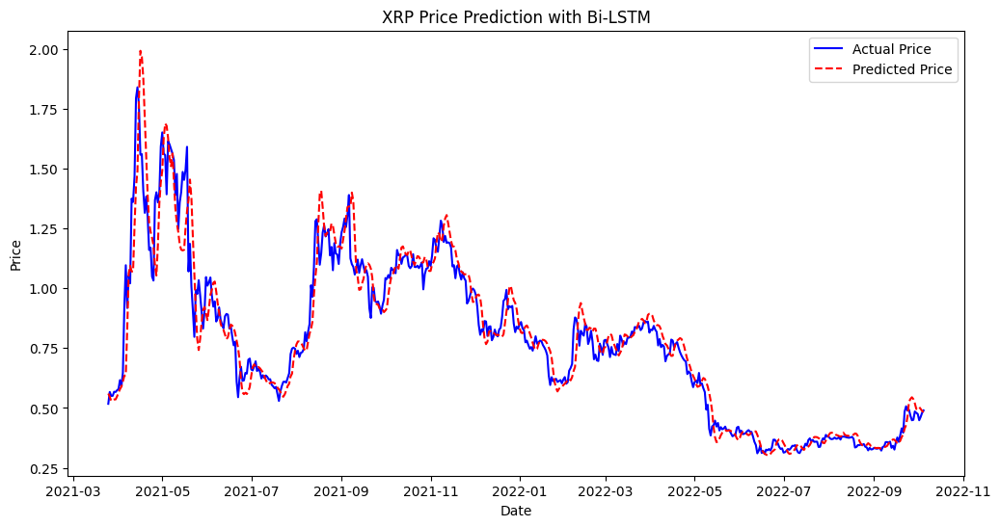

Metrics for Bi-LSTM Model on XRP: {'MSE': 0.0008147685137821067, 'MAE': 0.017779733660596857, 'RMSE': 0.028544150255036614, 'R2': 0.9144569940876136}


In [29]:
# Build the Bi-LSTM model
model_bilstm_xrp = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_xrp.shape[1], X_train_xrp.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_xrp.compile(optimizer='adam', loss='mse')
history_bilstm_xrp = model_bilstm_xrp.fit(X_train_xrp, y_train_xrp, epochs=200, batch_size=32, validation_data=(X_validation_xrp, y_validation_xrp), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_xrp = model_bilstm_xrp.predict(X_validation_xrp).reshape(-1, 1)
mse_bilstm_xrp = mean_squared_error(y_validation_xrp, y_pred_bilstm_xrp)
mae_bilstm_xrp = mean_absolute_error(y_validation_xrp, y_pred_bilstm_xrp)
rmse_bilstm_xrp = np.sqrt(mse_bilstm_xrp)
r2_bilstm_xrp = r2_score(y_validation_xrp, y_pred_bilstm_xrp)

# Store metrics
metrics_bilstm_xrp = {
    "MSE": mse_bilstm_xrp,
    "MAE": mae_bilstm_xrp,
    "RMSE": rmse_bilstm_xrp,
    "R2": r2_bilstm_xrp
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_xrp = scaler_label.inverse_transform(y_validation_xrp.reshape(-1, 1))
y_pred_actual_bilstm_xrp = scaler_label.inverse_transform(y_pred_bilstm_xrp)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_xrp.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_xrp.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('XRP Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on XRP:", metrics_bilstm_xrp)

# 7. LTC

## LSTM

Epoch 1/200
88/88 [==============================] - 1s 7ms/step - loss: 0.0014 - val_loss: 0.0029
Epoch 2/200
88/88 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 0.0027
Epoch 3/200
88/88 [==============================] - 0s 5ms/step - loss: 8.6423e-04 - val_loss: 0.0024
Epoch 4/200
88/88 [==============================] - 0s 5ms/step - loss: 8.3562e-04 - val_loss: 0.0023
Epoch 5/200
88/88 [==============================] - 0s 5ms/step - loss: 7.6105e-04 - val_loss: 0.0021
Epoch 6/200
88/88 [==============================] - 0s 5ms/step - loss: 6.5163e-04 - val_loss: 0.0022
Epoch 7/200
88/88 [==============================] - 0s 5ms/step - loss: 7.1603e-04 - val_loss: 0.0022
Epoch 8/200
88/88 [==============================] - 0s 5ms/step - loss: 6.4813e-04 - val_loss: 0.0019
Epoch 9/200
88/88 [==============================] - 0s 5ms/step - loss: 6.7473e-04 - val_loss: 0.0021
Epoch 10/200
88/88 [==============================] - 0s 5ms/step - loss: 6.6044e

Epoch 80/200
88/88 [==============================] - 0s 5ms/step - loss: 4.5016e-04 - val_loss: 0.0017
Epoch 81/200
88/88 [==============================] - 0s 5ms/step - loss: 4.8195e-04 - val_loss: 0.0024
Epoch 82/200
88/88 [==============================] - 0s 5ms/step - loss: 4.6257e-04 - val_loss: 0.0015
Epoch 83/200
88/88 [==============================] - 0s 5ms/step - loss: 4.4321e-04 - val_loss: 0.0015
Epoch 84/200
88/88 [==============================] - 0s 5ms/step - loss: 4.6220e-04 - val_loss: 0.0016
Epoch 85/200
88/88 [==============================] - 0s 5ms/step - loss: 4.2015e-04 - val_loss: 0.0016
Epoch 86/200
88/88 [==============================] - 0s 5ms/step - loss: 4.2469e-04 - val_loss: 0.0015
Epoch 87/200
88/88 [==============================] - 0s 5ms/step - loss: 4.3268e-04 - val_loss: 0.0016
Epoch 88/200
88/88 [==============================] - 0s 5ms/step - loss: 4.2431e-04 - val_loss: 0.0019
Epoch 89/200
18/18 [==============================] - 0s 1ms/ste

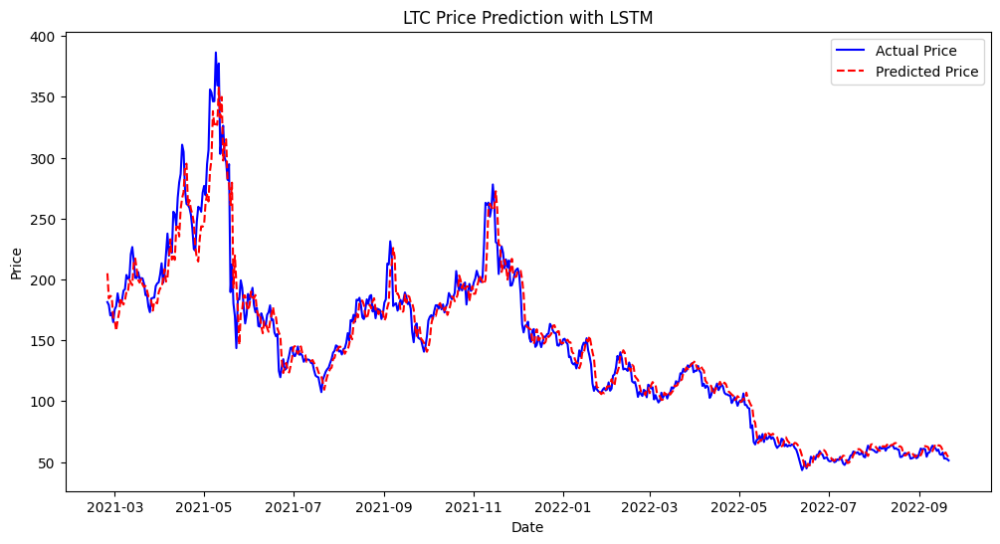

Metrics for LSTM Model on LTC: {'MSE': 0.001483046679180495, 'MAE': 0.024545358378262938, 'RMSE': 0.03851034509298112, 'R2': 0.9569188517421896}


In [30]:
# Define features and target
ltc = get_crypto_data('LTC')
features = ltc.drop(["Close"], axis=1)
label = ltc["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_ltc_features, validation_label, test_ltc_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)

# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_ltc, y_train_ltc = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_ltc, y_validation_ltc = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_ltc = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_ltc.shape[1], X_train_ltc.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_ltc.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_ltc = model_lstm_ltc.fit(X_train_ltc, y_train_ltc, epochs=200, batch_size=32, validation_data=(X_validation_ltc, y_validation_ltc), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_ltc = model_lstm_ltc.evaluate(X_validation_ltc, y_validation_ltc)

# prediction
y_pred_lstm_ltc = model_lstm_ltc.predict(X_validation_ltc).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_ltc = mean_squared_error(y_validation_ltc, y_pred_lstm_ltc)
mae_lstm_ltc = mean_absolute_error(y_validation_ltc, y_pred_lstm_ltc)
rmse_lstm_ltc = np.sqrt(mse_lstm_ltc)
r2_lstm_ltc = r2_score(y_validation_ltc, y_pred_lstm_ltc)

# Store metrics for later comparison
metrics_lstm_ltc = {
    "MSE": mse_lstm_ltc,
    "MAE": mae_lstm_ltc,
    "RMSE": rmse_lstm_ltc,
    "R2": r2_lstm_ltc
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_ltc = scaler_label.inverse_transform(y_validation_ltc.reshape(-1, 1))
y_pred_actual_lstm_ltc = scaler_label.inverse_transform(y_pred_lstm_ltc)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_ltc.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_ltc.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('LTC Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on LTC:", metrics_lstm_ltc)

## GRU

Epoch 1/200
88/88 [==============================] - 1s 7ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 2/200
88/88 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 3/200
88/88 [==============================] - 0s 5ms/step - loss: 9.6019e-04 - val_loss: 0.0019
Epoch 4/200
88/88 [==============================] - 0s 5ms/step - loss: 7.9842e-04 - val_loss: 0.0019
Epoch 5/200
88/88 [==============================] - 0s 5ms/step - loss: 8.2666e-04 - val_loss: 0.0017
Epoch 6/200
88/88 [==============================] - 0s 5ms/step - loss: 7.6155e-04 - val_loss: 0.0017
Epoch 7/200
88/88 [==============================] - 0s 5ms/step - loss: 6.5978e-04 - val_loss: 0.0017
Epoch 8/200
88/88 [==============================] - 0s 5ms/step - loss: 6.2237e-04 - val_loss: 0.0017
Epoch 9/200
88/88 [==============================] - 0s 5ms/step - loss: 6.1254e-04 - val_loss: 0.0016
Epoch 10/200
88/88 [==============================] - 0s 5ms/step - loss: 6.1347e

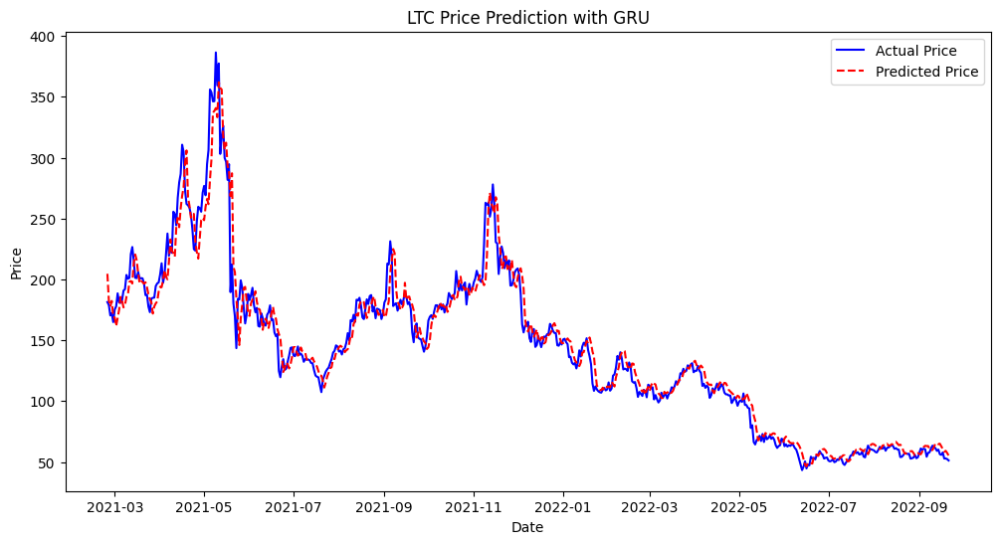

Metrics for GRU Model on LTC: {'MSE': 0.0015313138756659734, 'MAE': 0.025139366641909595, 'RMSE': 0.03913200577105617, 'R2': 0.9555167338743091}


In [31]:
# Build the GRU model
model_gru_ltc = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_ltc.shape[1], X_train_ltc.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_ltc.compile(optimizer='adam', loss='mse')
history_gru_ltc = model_gru_ltc.fit(X_train_ltc, y_train_ltc, epochs=200, batch_size=32, validation_data=(X_validation_ltc, y_validation_ltc), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_ltc = model_gru_ltc.predict(X_validation_ltc).reshape(-1,1)
mse_gru_ltc = mean_squared_error(y_validation_ltc, y_pred_gru_ltc)
mae_gru_ltc = mean_absolute_error(y_validation_ltc, y_pred_gru_ltc)
rmse_gru_ltc = np.sqrt(mse_gru_ltc)
r2_gru_ltc = r2_score(y_validation_ltc, y_pred_gru_ltc)

# Store metrics
metrics_gru_ltc = {
    "MSE": mse_gru_ltc,
    "MAE": mae_gru_ltc,
    "RMSE": rmse_gru_ltc,
    "R2": r2_gru_ltc
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_ltc = scaler_label.inverse_transform(y_validation_ltc.reshape(-1, 1))
y_pred_actual_gru_ltc = scaler_label.inverse_transform(y_pred_gru_ltc)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_ltc.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_ltc.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('LTC Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on LTC:", metrics_gru_ltc)

## Bi-LSTM

Epoch 1/200
88/88 [==============================] - 2s 10ms/step - loss: 0.0035 - val_loss: 0.0049
Epoch 2/200
88/88 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 0.0074
Epoch 3/200
88/88 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 0.0038
Epoch 4/200
88/88 [==============================] - 0s 5ms/step - loss: 8.5525e-04 - val_loss: 0.0030
Epoch 5/200
88/88 [==============================] - 0s 5ms/step - loss: 8.2571e-04 - val_loss: 0.0032
Epoch 6/200
88/88 [==============================] - 0s 5ms/step - loss: 7.7694e-04 - val_loss: 0.0025
Epoch 7/200
88/88 [==============================] - 0s 5ms/step - loss: 7.5267e-04 - val_loss: 0.0024
Epoch 8/200
88/88 [==============================] - 0s 5ms/step - loss: 8.4216e-04 - val_loss: 0.0022
Epoch 9/200
88/88 [==============================] - 0s 5ms/step - loss: 7.0982e-04 - val_loss: 0.0024
Epoch 10/200
88/88 [==============================] - 0s 5ms/step - loss: 6.9058e-04

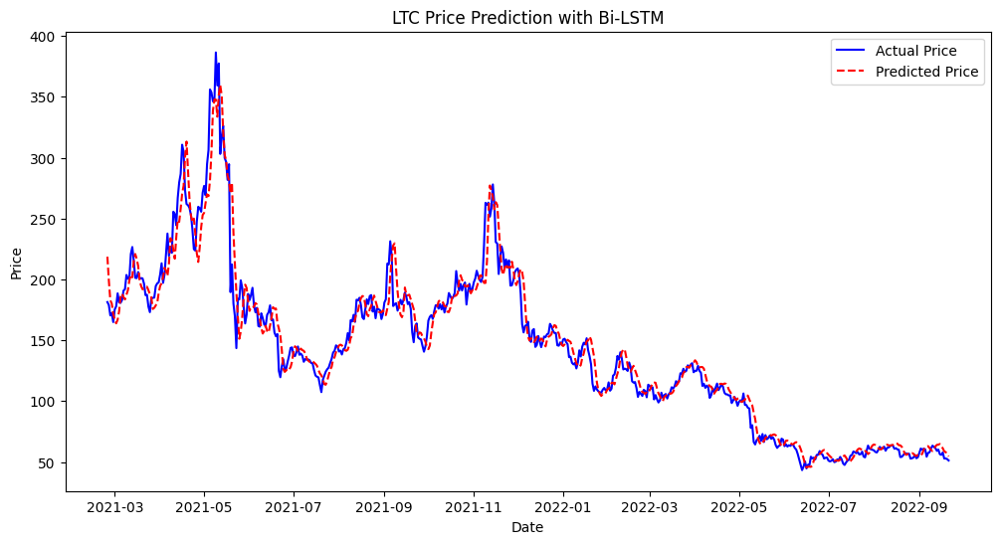

Metrics for Bi-LSTM Model on LTC: {'MSE': 0.0016748655676682863, 'MAE': 0.026258335933019638, 'RMSE': 0.040925121474081005, 'R2': 0.9513466886473926}


In [32]:
# Build the Bi-LSTM model
model_bilstm_ltc = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_ltc.shape[1], X_train_ltc.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_ltc.compile(optimizer='adam', loss='mse')
history_bilstm_ltc = model_bilstm_ltc.fit(X_train_ltc, y_train_ltc, epochs=200, batch_size=32, validation_data=(X_validation_ltc, y_validation_ltc), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_ltc = model_bilstm_ltc.predict(X_validation_ltc).reshape(-1, 1)
mse_bilstm_ltc = mean_squared_error(y_validation_ltc, y_pred_bilstm_ltc)
mae_bilstm_ltc = mean_absolute_error(y_validation_ltc, y_pred_bilstm_ltc)
rmse_bilstm_ltc = np.sqrt(mse_bilstm_ltc)
r2_bilstm_ltc = r2_score(y_validation_ltc, y_pred_bilstm_ltc)

# Store metrics
metrics_bilstm_ltc = {
    "MSE": mse_bilstm_ltc,
    "MAE": mae_bilstm_ltc,
    "RMSE": rmse_bilstm_ltc,
    "R2": r2_bilstm_ltc
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_ltc = scaler_label.inverse_transform(y_validation_ltc.reshape(-1, 1))
y_pred_actual_bilstm_ltc = scaler_label.inverse_transform(y_pred_bilstm_ltc)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_ltc.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_ltc.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('LTC Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on LTC:", metrics_bilstm_ltc)

# 8. LINK

## LSTM

Epoch 1/100
53/53 [==============================] - 1s 8ms/step - loss: 0.0091 - val_loss: 1.2183e-04
Epoch 2/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0022 - val_loss: 1.2187e-04
Epoch 3/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 1.5760e-04
Epoch 4/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 2.1608e-04
Epoch 5/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 1.7707e-04
Epoch 6/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 1.1278e-04
Epoch 7/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 9.8263e-05
Epoch 8/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 1.1708e-04
Epoch 9/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 1.6575e-04
Epoch 10/100
53/53 [==============================] - 0s 5ms/step - loss:

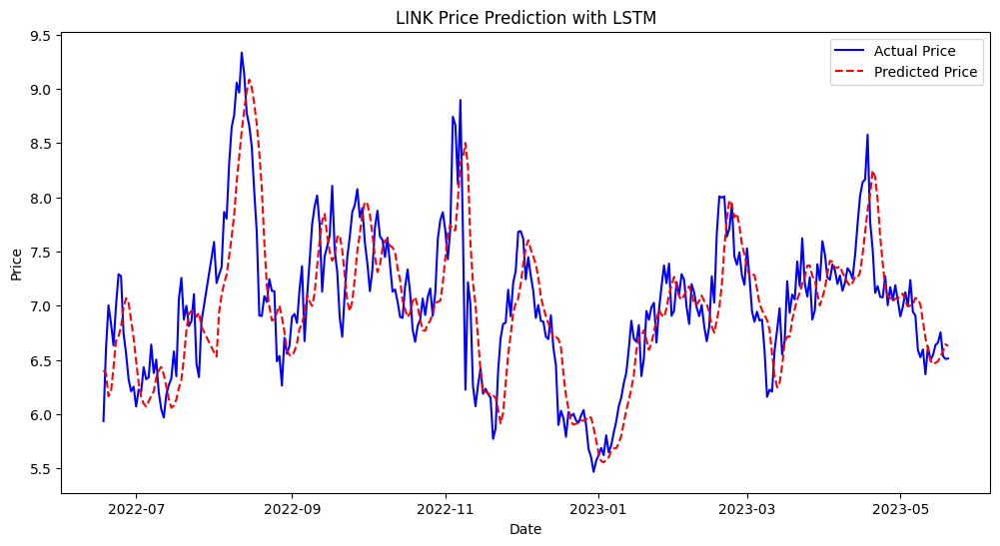

Metrics for LSTM Model on LINK: {'MSE': 7.30241474816922e-05, 'MAE': 0.006561876331139848, 'RMSE': 0.008545416752955481, 'R2': 0.5696424321833287}


In [33]:
# Define features and target
link = get_crypto_data('LINK')
features = link.drop(["Close"], axis=1)
label = link["Close"]

## Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_link_features, validation_label, test_link_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)

# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_link, y_train_link = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_link, y_validation_link = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_link = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_link.shape[1], X_train_link.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_link.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_link = model_lstm_link.fit(X_train_link, y_train_link, epochs=100, batch_size=32, validation_data=(X_validation_link, y_validation_link), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_link = model_lstm_link.evaluate(X_validation_link, y_validation_link)

# prediction
y_pred_lstm_link = model_lstm_link.predict(X_validation_link).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_link = mean_squared_error(y_validation_link, y_pred_lstm_link)
mae_lstm_link = mean_absolute_error(y_validation_link, y_pred_lstm_link)
rmse_lstm_link = np.sqrt(mse_lstm_link)
r2_lstm_link = r2_score(y_validation_link, y_pred_lstm_link)

# Store metrics for later comparison
metrics_lstm_link = {
    "MSE": mse_lstm_link,
    "MAE": mae_lstm_link,
    "RMSE": rmse_lstm_link,
    "R2": r2_lstm_link
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_link = scaler_label.inverse_transform(y_validation_link.reshape(-1, 1))
y_pred_actual_lstm_link = scaler_label.inverse_transform(y_pred_lstm_link)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_link.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_link.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('LINK Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on LINK:", metrics_lstm_link)

## GRU

Epoch 1/100
53/53 [==============================] - 1s 8ms/step - loss: 0.0171 - val_loss: 4.8534e-04
Epoch 2/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 1.3106e-04
Epoch 3/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 1.3944e-04
Epoch 4/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 1.8695e-04
Epoch 5/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 1.3072e-04
Epoch 6/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 1.0686e-04
Epoch 7/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 1.6149e-04
Epoch 8/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 2.3050e-04
Epoch 9/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 3.6738e-04
Epoch 10/100
53/53 [==============================] - 0s 5ms/step - loss:

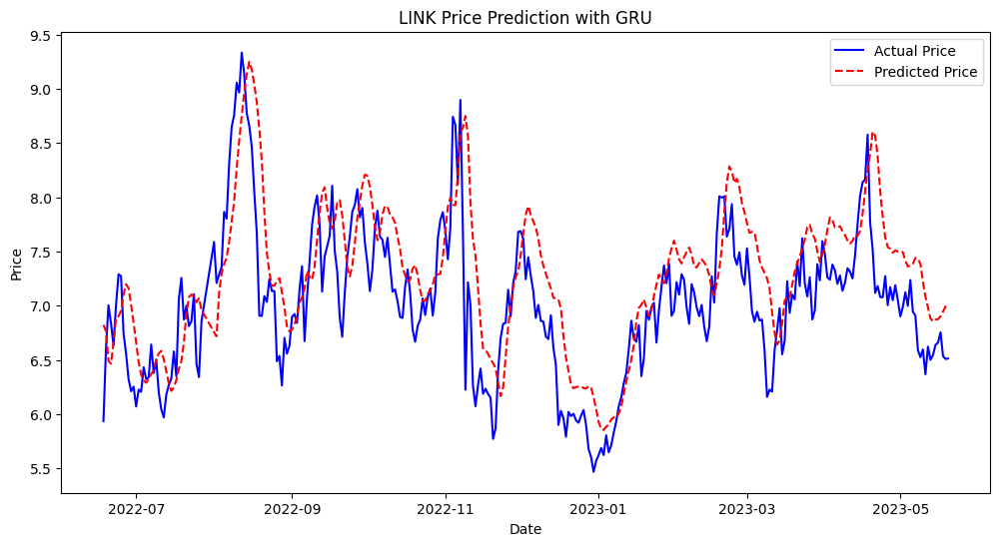

Metrics for GRU Model on LINK: {'MSE': 0.00010685922527378861, 'MAE': 0.008277713857878299, 'RMSE': 0.010337273589965036, 'R2': 0.37024014831352925}


In [34]:
# Build the GRU model
model_gru_link = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_link.shape[1], X_train_link.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_link.compile(optimizer='adam', loss='mse')
history_gru_link = model_gru_link.fit(X_train_link, y_train_link, epochs=100, batch_size=32, validation_data=(X_validation_link, y_validation_link), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_link = model_gru_link.predict(X_validation_link).reshape(-1,1)
mse_gru_link = mean_squared_error(y_validation_link, y_pred_gru_link)
mae_gru_link = mean_absolute_error(y_validation_link, y_pred_gru_link)
rmse_gru_link = np.sqrt(mse_gru_link)
r2_gru_link = r2_score(y_validation_link, y_pred_gru_link)

# Store metrics
metrics_gru_link = {
    "MSE": mse_gru_link,
    "MAE": mae_gru_link,
    "RMSE": rmse_gru_link,
    "R2": r2_gru_link
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_link = scaler_label.inverse_transform(y_validation_link.reshape(-1, 1))
y_pred_actual_gru_link = scaler_label.inverse_transform(y_pred_gru_link)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_link.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_link.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('LINK Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on LINK:", metrics_gru_link)

## Bi-LSTM

Epoch 1/100
53/53 [==============================] - 1s 10ms/step - loss: 0.0041 - val_loss: 1.6825e-04
Epoch 2/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 1.1627e-04
Epoch 3/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 1.5532e-04
Epoch 4/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 1.3567e-04
Epoch 5/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 1.1202e-04
Epoch 6/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 1.4603e-04
Epoch 7/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 1.4814e-04
Epoch 8/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 1.3696e-04
Epoch 9/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 1.9880e-04
Epoch 10/100
53/53 [==============================] - 0s 5ms/step - loss

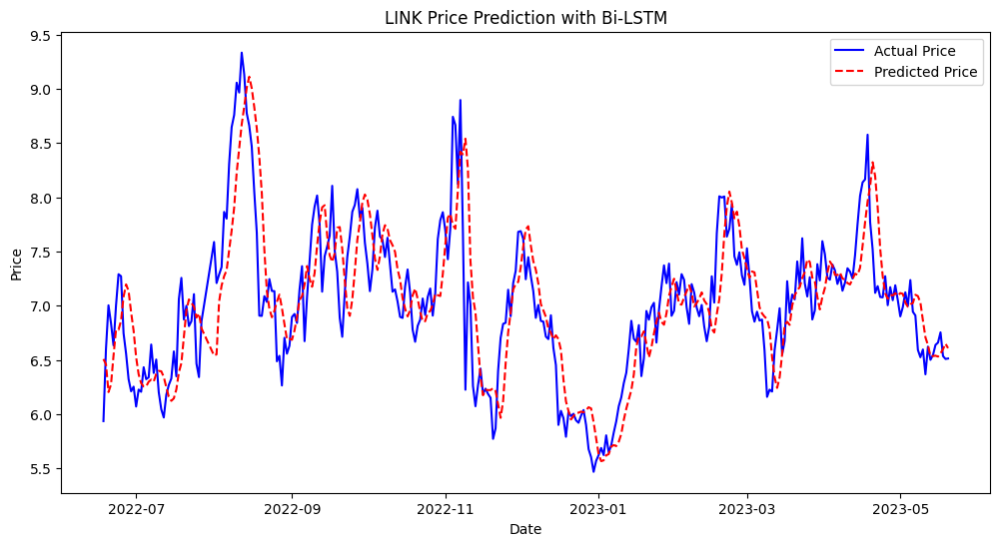

Metrics for Bi-LSTM Model on LINK: {'MSE': 6.744245518097604e-05, 'MAE': 0.006211089595611242, 'RMSE': 0.008212335549706675, 'R2': 0.6025373526401472}


In [35]:
# Build the Bi-LSTM model
model_bilstm_link = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_link.shape[1], X_train_link.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_link.compile(optimizer='adam', loss='mse')
history_bilstm_link = model_bilstm_link.fit(X_train_link, y_train_link, epochs=100, batch_size=32, validation_data=(X_validation_link, y_validation_link), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_link = model_bilstm_link.predict(X_validation_link).reshape(-1, 1)
mse_bilstm_link = mean_squared_error(y_validation_link, y_pred_bilstm_link)
mae_bilstm_link = mean_absolute_error(y_validation_link, y_pred_bilstm_link)
rmse_bilstm_link = np.sqrt(mse_bilstm_link)
r2_bilstm_link = r2_score(y_validation_link, y_pred_bilstm_link)

# Store metrics
metrics_bilstm_link = {
    "MSE": mse_bilstm_link,
    "MAE": mae_bilstm_link,
    "RMSE": rmse_bilstm_link,
    "R2": r2_bilstm_link
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_link = scaler_label.inverse_transform(y_validation_link.reshape(-1, 1))
y_pred_actual_bilstm_link = scaler_label.inverse_transform(y_pred_bilstm_link)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_link.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_link.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('LINK Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on LINK:", metrics_bilstm_link)

# 9. DOGE

## LSTM

Epoch 1/100
83/83 [==============================] - 1s 7ms/step - loss: 0.0013 - val_loss: 2.0948
Epoch 2/100
83/83 [==============================] - 0s 5ms/step - loss: 5.9073e-04 - val_loss: 2.1904
Epoch 3/100
83/83 [==============================] - 0s 5ms/step - loss: 5.5016e-04 - val_loss: 2.1338
Epoch 4/100
83/83 [==============================] - 0s 5ms/step - loss: 5.2169e-04 - val_loss: 1.8743
Epoch 5/100
83/83 [==============================] - 0s 5ms/step - loss: 5.7590e-04 - val_loss: 1.6918
Epoch 6/100
83/83 [==============================] - 0s 5ms/step - loss: 4.8325e-04 - val_loss: 1.3786
Epoch 7/100
83/83 [==============================] - 0s 5ms/step - loss: 4.7703e-04 - val_loss: 1.7945
Epoch 8/100
83/83 [==============================] - 0s 5ms/step - loss: 4.4301e-04 - val_loss: 1.6933
Epoch 9/100
83/83 [==============================] - 0s 5ms/step - loss: 4.4671e-04 - val_loss: 1.5633
Epoch 10/100
83/83 [==============================] - 0s 5ms/step - loss: 4.8

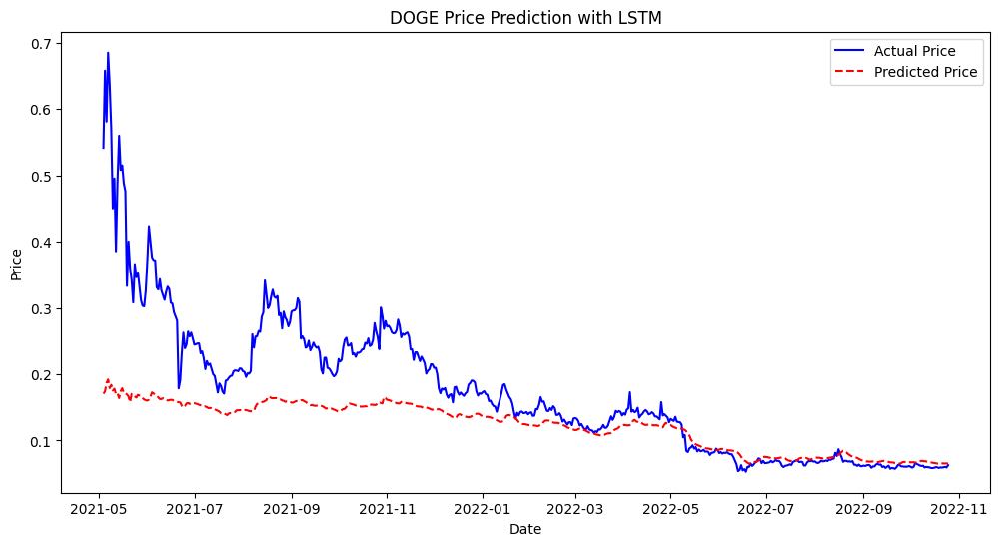

Metrics for LSTM Model on DOGE: {'MSE': 1.378571156317445, 'MAE': 0.7119190260700892, 'RMSE': 1.174125698687089, 'R2': 0.23386977890897587}


In [36]:
# Define features and target
doge = get_crypto_data('DOGE')
features = doge.drop(["Close"], axis=1)
label = doge["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_doge_features, validation_label, test_doge_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)

# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_doge, y_train_doge = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_doge, y_validation_doge = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_doge = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_doge.shape[1], X_train_doge.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_doge.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_doge = model_lstm_doge.fit(X_train_doge, y_train_doge, epochs=100, batch_size=32, validation_data=(X_validation_doge, y_validation_doge), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_doge = model_lstm_doge.evaluate(X_validation_doge, y_validation_doge)

# prediction
y_pred_lstm_doge = model_lstm_doge.predict(X_validation_doge).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_doge = mean_squared_error(y_validation_doge, y_pred_lstm_doge)
mae_lstm_doge = mean_absolute_error(y_validation_doge, y_pred_lstm_doge)
rmse_lstm_doge = np.sqrt(mse_lstm_doge)
r2_lstm_doge = r2_score(y_validation_doge, y_pred_lstm_doge)

# Store metrics for later comparison
metrics_lstm_doge = {
    "MSE": mse_lstm_doge,
    "MAE": mae_lstm_doge,
    "RMSE": rmse_lstm_doge,
    "R2": r2_lstm_doge
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_doge = scaler_label.inverse_transform(y_validation_doge.reshape(-1, 1))
y_pred_actual_lstm_doge = scaler_label.inverse_transform(y_pred_lstm_doge)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_doge.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_doge.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('DOGE Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on DOGE:", metrics_lstm_doge)

## GRU

Epoch 1/100
83/83 [==============================] - 1s 7ms/step - loss: 0.0020 - val_loss: 1.1873
Epoch 2/100
83/83 [==============================] - 0s 5ms/step - loss: 6.4827e-04 - val_loss: 0.9690
Epoch 3/100
83/83 [==============================] - 0s 5ms/step - loss: 6.5158e-04 - val_loss: 0.8647
Epoch 4/100
83/83 [==============================] - 0s 5ms/step - loss: 6.0231e-04 - val_loss: 0.8383
Epoch 5/100
83/83 [==============================] - 0s 5ms/step - loss: 4.6816e-04 - val_loss: 0.8840
Epoch 6/100
83/83 [==============================] - 0s 5ms/step - loss: 5.6478e-04 - val_loss: 0.8131
Epoch 7/100
83/83 [==============================] - 0s 5ms/step - loss: 5.1054e-04 - val_loss: 0.9129
Epoch 8/100
83/83 [==============================] - 0s 5ms/step - loss: 5.1079e-04 - val_loss: 0.5980
Epoch 9/100
83/83 [==============================] - 0s 5ms/step - loss: 5.4409e-04 - val_loss: 0.9708
Epoch 10/100
83/83 [==============================] - 0s 5ms/step - loss: 5.3

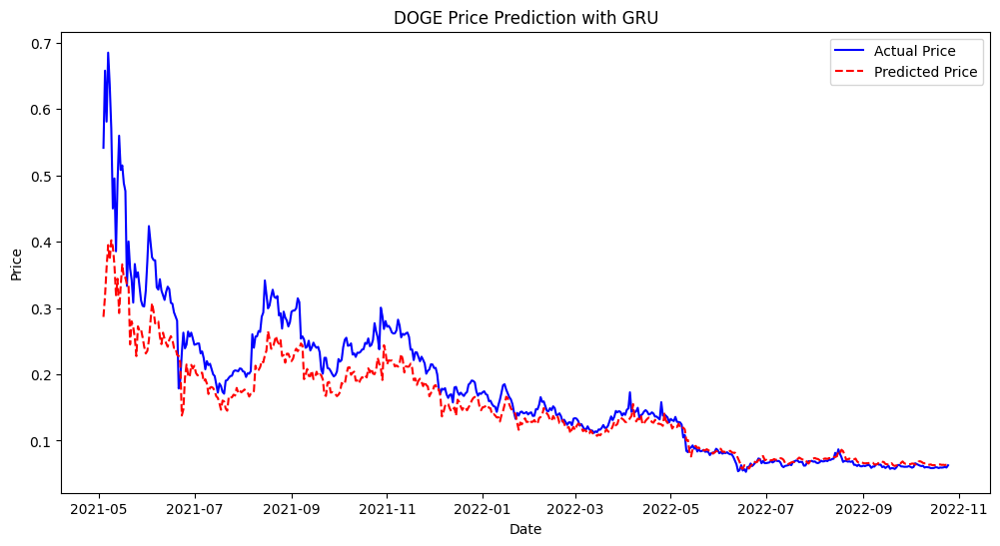

Metrics for GRU Model on DOGE: {'MSE': 0.37798369716494756, 'MAE': 0.3620840776486374, 'RMSE': 0.6148037875330207, 'R2': 0.7899384938160559}


In [37]:
# Build the GRU model
model_gru_doge = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_doge.shape[1], X_train_doge.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_doge.compile(optimizer='adam', loss='mse')
history_gru_doge = model_gru_doge.fit(X_train_doge, y_train_doge, epochs=100, batch_size=32, validation_data=(X_validation_doge, y_validation_doge), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_doge = model_gru_doge.predict(X_validation_doge).reshape(-1,1)
mse_gru_doge = mean_squared_error(y_validation_doge, y_pred_gru_doge)
mae_gru_doge = mean_absolute_error(y_validation_doge, y_pred_gru_doge)
rmse_gru_doge = np.sqrt(mse_gru_doge)
r2_gru_doge = r2_score(y_validation_doge, y_pred_gru_doge)

# Store metrics
metrics_gru_doge = {
    "MSE": mse_gru_doge,
    "MAE": mae_gru_doge,
    "RMSE": rmse_gru_doge,
    "R2": r2_gru_doge
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_doge = scaler_label.inverse_transform(y_validation_doge.reshape(-1, 1))
y_pred_actual_gru_doge = scaler_label.inverse_transform(y_pred_gru_doge)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_doge.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_doge.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('DOGE Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on DOGE:", metrics_gru_doge)

## Bi-LSTM

Epoch 1/100
83/83 [==============================] - 2s 8ms/step - loss: 0.0026 - val_loss: 2.8473
Epoch 2/100
83/83 [==============================] - 0s 5ms/step - loss: 7.5257e-04 - val_loss: 2.1591
Epoch 3/100
83/83 [==============================] - 0s 5ms/step - loss: 5.4156e-04 - val_loss: 1.5152
Epoch 4/100
83/83 [==============================] - 0s 5ms/step - loss: 5.8241e-04 - val_loss: 1.9679
Epoch 5/100
83/83 [==============================] - 0s 5ms/step - loss: 5.1236e-04 - val_loss: 1.8037
Epoch 6/100
83/83 [==============================] - 0s 5ms/step - loss: 4.9541e-04 - val_loss: 1.5094
Epoch 7/100
83/83 [==============================] - 0s 5ms/step - loss: 4.5914e-04 - val_loss: 1.3914
Epoch 8/100
83/83 [==============================] - 0s 5ms/step - loss: 4.7046e-04 - val_loss: 1.6461
Epoch 9/100
83/83 [==============================] - 0s 5ms/step - loss: 4.1178e-04 - val_loss: 1.8299
Epoch 10/100
83/83 [==============================] - 0s 6ms/step - loss: 4.7

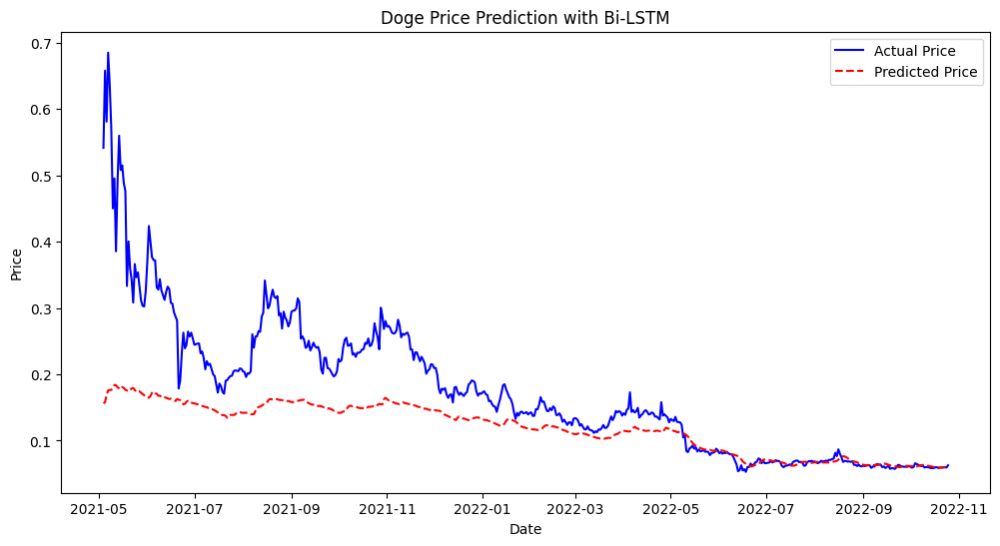

Metrics for Bi-LSTM Model on DOGE: {'MSE': 1.3913790544685003, 'MAE': 0.7218884401569012, 'RMSE': 1.179567316632883, 'R2': 0.2267518889130824}


In [38]:
# Build the Bi-LSTM model
model_bilstm_doge = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_doge.shape[1], X_train_doge.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_doge.compile(optimizer='adam', loss='mse')
history_bilstm_doge = model_bilstm_doge.fit(X_train_doge, y_train_doge, epochs=100, batch_size=32, validation_data=(X_validation_doge, y_validation_doge), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_doge = model_bilstm_doge.predict(X_validation_doge).reshape(-1, 1)
mse_bilstm_doge = mean_squared_error(y_validation_doge, y_pred_bilstm_doge)
mae_bilstm_doge = mean_absolute_error(y_validation_doge, y_pred_bilstm_doge)
rmse_bilstm_doge = np.sqrt(mse_bilstm_doge)
r2_bilstm_doge = r2_score(y_validation_doge, y_pred_bilstm_doge)

# Store metrics
metrics_bilstm_doge = {
    "MSE": mse_bilstm_doge,
    "MAE": mae_bilstm_doge,
    "RMSE": rmse_bilstm_doge,
    "R2": r2_bilstm_doge
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_doge = scaler_label.inverse_transform(y_validation_doge.reshape(-1, 1))
y_pred_actual_bilstm_doge = scaler_label.inverse_transform(y_pred_bilstm_doge)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_doge.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_doge.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('Doge Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on DOGE:", metrics_bilstm_doge)

# 10. SHIB

## LSTM

Epoch 1/100
30/30 [==============================] - 1s 11ms/step - loss: 0.0149 - val_loss: 1.4059e-04
Epoch 2/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0031 - val_loss: 5.2917e-05
Epoch 3/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0029 - val_loss: 1.2981e-04
Epoch 4/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0024 - val_loss: 5.8657e-05
Epoch 5/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0024 - val_loss: 4.4943e-05
Epoch 6/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 5.0291e-05
Epoch 7/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 4.2840e-05
Epoch 8/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 7.7022e-05
Epoch 9/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 4.2058e-05
Epoch 10/100
30/30 [==============================] - 0s 5ms/step - loss

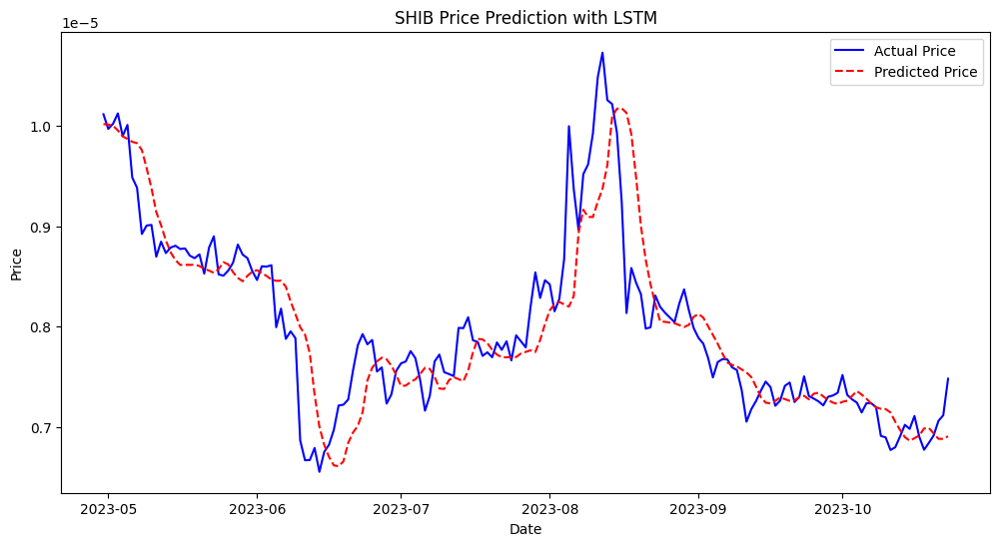

Metrics for LSTM Model on SHIB: {'MSE': 3.021907766797741e-05, 'MAE': 0.0036435061259418983, 'RMSE': 0.005497188160139456, 'R2': 0.7578903948694209}


In [39]:
# Define features and target
shib = get_crypto_data('SHIB')
features = shib.drop(["Close"], axis=1)
label = shib["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_shib_features, validation_label, test_shib_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)

# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_shib, y_train_shib = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_shib, y_validation_shib = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_shib = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_shib.shape[1], X_train_shib.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_shib.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_shib = model_lstm_shib.fit(X_train_shib, y_train_shib, epochs=100, batch_size=32, validation_data=(X_validation_shib, y_validation_shib), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_shib = model_lstm_shib.evaluate(X_validation_shib, y_validation_shib)

# prediction
y_pred_lstm_shib = model_lstm_shib.predict(X_validation_shib).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_shib = mean_squared_error(y_validation_shib, y_pred_lstm_shib)
mae_lstm_shib = mean_absolute_error(y_validation_shib, y_pred_lstm_shib)
rmse_lstm_shib = np.sqrt(mse_lstm_shib)
r2_lstm_shib = r2_score(y_validation_shib, y_pred_lstm_shib)

# Store metrics for later comparison
metrics_lstm_shib = {
    "MSE": mse_lstm_shib,
    "MAE": mae_lstm_shib,
    "RMSE": rmse_lstm_shib,
    "R2": r2_lstm_shib
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_shib = scaler_label.inverse_transform(y_validation_shib.reshape(-1, 1))
y_pred_actual_lstm_shib = scaler_label.inverse_transform(y_pred_lstm_shib)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_shib.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_shib.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('SHIB Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on SHIB:", metrics_lstm_shib)

## GRU

Epoch 1/100
30/30 [==============================] - 1s 10ms/step - loss: 0.0076 - val_loss: 3.4154e-05
Epoch 2/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0024 - val_loss: 3.1001e-05
Epoch 3/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 4.8836e-05
Epoch 4/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 3.1012e-05
Epoch 5/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 5.2973e-05
Epoch 6/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 1.8583e-04
Epoch 7/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 4.9986e-05
Epoch 8/100
30/30 [==============================] - 0s 6ms/step - loss: 0.0016 - val_loss: 8.3811e-05
Epoch 9/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 9.2250e-05
Epoch 10/100
30/30 [==============================] - 0s 5ms/step - loss

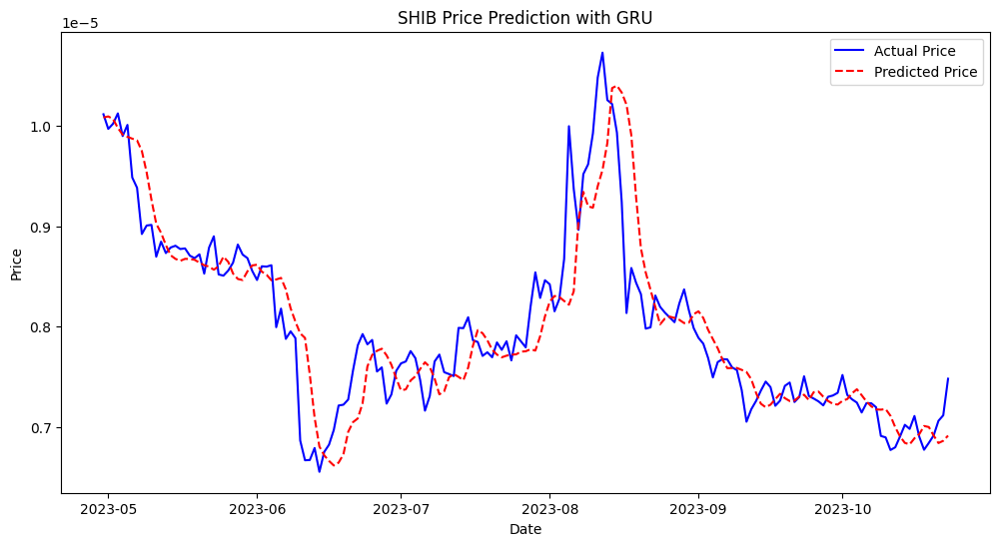

Metrics for GRU Model on SHIB: {'MSE': 2.7027588391409875e-05, 'MAE': 0.003447474127667262, 'RMSE': 0.005198806439117528, 'R2': 0.7834600107596851}


In [40]:
# Build the GRU model
model_gru_shib = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_shib.shape[1], X_train_shib.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_shib.compile(optimizer='adam', loss='mse')
history_gru_shib = model_gru_shib.fit(X_train_shib, y_train_shib, epochs=100, batch_size=32, validation_data=(X_validation_shib, y_validation_shib), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_shib = model_gru_shib.predict(X_validation_shib).reshape(-1,1)
mse_gru_shib = mean_squared_error(y_validation_shib, y_pred_gru_shib)
mae_gru_shib = mean_absolute_error(y_validation_shib, y_pred_gru_shib)
rmse_gru_shib = np.sqrt(mse_gru_shib)
r2_gru_shib = r2_score(y_validation_shib, y_pred_gru_shib)

# Store metrics
metrics_gru_shib = {
    "MSE": mse_gru_shib,
    "MAE": mae_gru_shib,
    "RMSE": rmse_gru_shib,
    "R2": r2_gru_shib
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_shib = scaler_label.inverse_transform(y_validation_shib.reshape(-1, 1))
y_pred_actual_gru_shib = scaler_label.inverse_transform(y_pred_gru_shib)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_shib.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_shib.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('SHIB Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on SHIB:", metrics_gru_shib)

## Bi-LSTM

Epoch 1/100
30/30 [==============================] - 1s 13ms/step - loss: 0.0055 - val_loss: 7.3892e-05
Epoch 2/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0027 - val_loss: 1.6573e-04
Epoch 3/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0024 - val_loss: 1.0083e-04
Epoch 4/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 4.1181e-05
Epoch 5/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 4.1784e-05
Epoch 6/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 8.2035e-05
Epoch 7/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 4.9863e-05
Epoch 8/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 1.9540e-04
Epoch 9/100
30/30 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 8.7887e-05
Epoch 10/100
30/30 [==============================] - 0s 5ms/step - loss

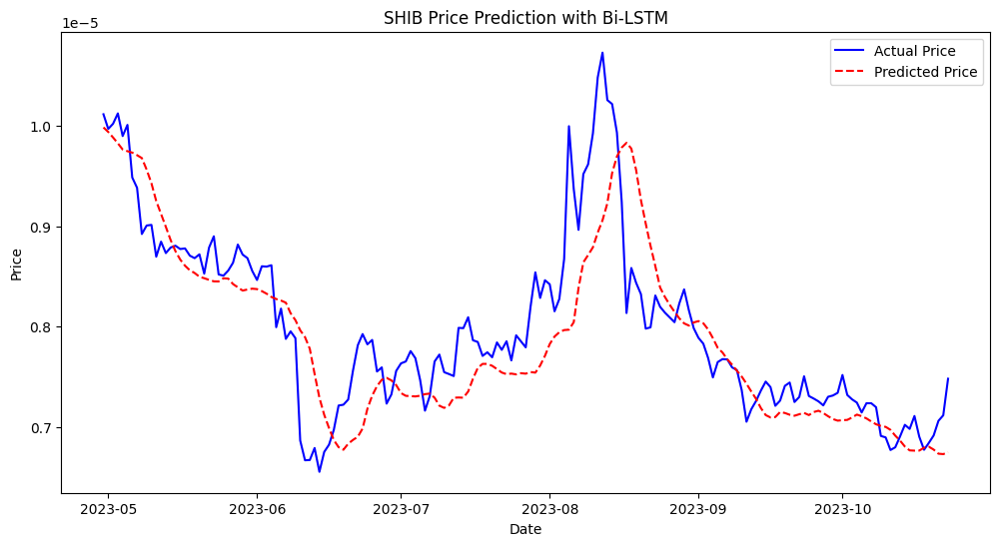

Metrics for Bi-LSTM Model on SHIB: {'MSE': 4.118122416769659e-05, 'MAE': 0.004638251763742584, 'RMSE': 0.006417259864435644, 'R2': 0.6700637249230046}


In [41]:
# Build the Bi-LSTM model
model_bilstm_shib = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_shib.shape[1], X_train_shib.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_shib.compile(optimizer='adam', loss='mse')
history_bilstm_shib = model_bilstm_shib.fit(X_train_shib, y_train_shib, epochs=100, batch_size=32, validation_data=(X_validation_shib, y_validation_shib), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_shib = model_bilstm_shib.predict(X_validation_shib).reshape(-1, 1)
mse_bilstm_shib = mean_squared_error(y_validation_shib, y_pred_bilstm_shib)
mae_bilstm_shib = mean_absolute_error(y_validation_shib, y_pred_bilstm_shib)
rmse_bilstm_shib = np.sqrt(mse_bilstm_shib)
r2_bilstm_shib = r2_score(y_validation_shib, y_pred_bilstm_shib)

# Store metrics
metrics_bilstm_shib = {
    "MSE": mse_bilstm_shib,
    "MAE": mae_bilstm_shib,
    "RMSE": rmse_bilstm_shib,
    "R2": r2_bilstm_shib
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_shib = scaler_label.inverse_transform(y_validation_shib.reshape(-1, 1))
y_pred_actual_bilstm_shib = scaler_label.inverse_transform(y_pred_bilstm_shib)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_shib.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_shib.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('SHIB Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on SHIB:", metrics_bilstm_shib)

# 11. MANA

## LSTM

Epoch 1/100
53/53 [==============================] - 1s 8ms/step - loss: 0.0112 - val_loss: 1.7284e-04
Epoch 2/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 1.4462e-04
Epoch 3/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 2.0508e-04
Epoch 4/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 1.3934e-04
Epoch 5/100
53/53 [==============================] - 0s 5ms/step - loss: 9.8699e-04 - val_loss: 1.2419e-04
Epoch 6/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 1.3321e-04
Epoch 7/100
53/53 [==============================] - 0s 5ms/step - loss: 8.7337e-04 - val_loss: 4.8537e-04
Epoch 8/100
53/53 [==============================] - 0s 5ms/step - loss: 9.2778e-04 - val_loss: 1.8525e-04
Epoch 9/100
53/53 [==============================] - 0s 5ms/step - loss: 9.1828e-04 - val_loss: 3.7777e-04
Epoch 10/100
53/53 [==============================] - 0s 

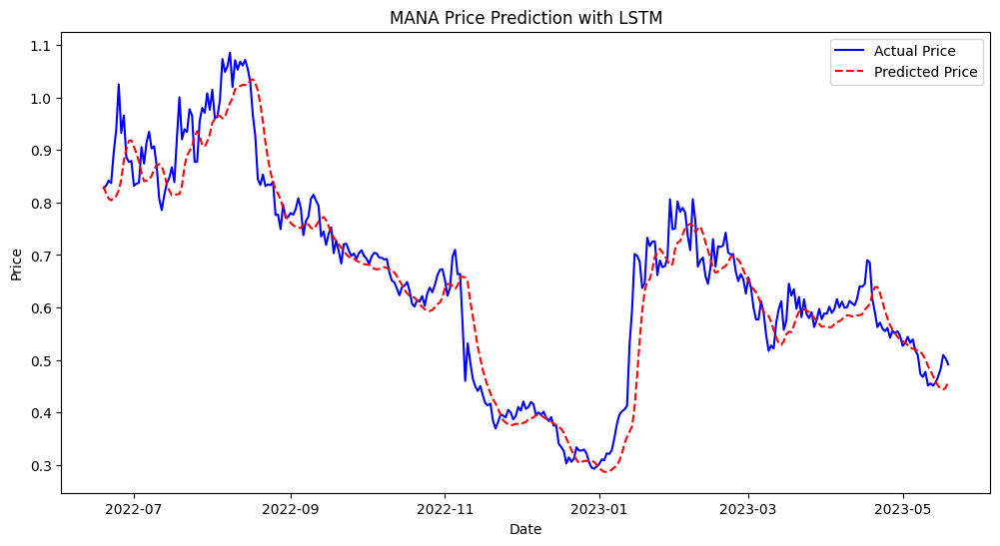

Metrics for LSTM Model on MANA: {'MSE': 0.00010599086912861017, 'MAE': 0.007410409683352061, 'RMSE': 0.0102951866971226, 'R2': 0.9125914935358932}


In [42]:
# Define features and target
mana = get_crypto_data('MANA')
features = mana.drop(["Close"], axis=1)
label = mana["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_mana_features, validation_label, test_mana_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)


# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_mana, y_train_mana = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_mana, y_validation_mana = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_mana = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_mana.shape[1], X_train_mana.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_mana.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_mana = model_lstm_mana.fit(X_train_mana, y_train_mana, epochs=100, batch_size=32, validation_data=(X_validation_mana, y_validation_mana), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_mana = model_lstm_mana.evaluate(X_validation_mana, y_validation_mana)

# prediction
y_pred_lstm_mana = model_lstm_mana.predict(X_validation_mana).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_mana = mean_squared_error(y_validation_mana, y_pred_lstm_mana)
mae_lstm_mana = mean_absolute_error(y_validation_mana, y_pred_lstm_mana)
rmse_lstm_mana = np.sqrt(mse_lstm_mana)
r2_lstm_mana = r2_score(y_validation_mana, y_pred_lstm_mana)

# Store metrics for later comparison
metrics_lstm_mana = {
    "MSE": mse_lstm_mana,
    "MAE": mae_lstm_mana,
    "RMSE": rmse_lstm_mana,
    "R2": r2_lstm_mana
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_mana = scaler_label.inverse_transform(y_validation_mana.reshape(-1, 1))
y_pred_actual_lstm_mana = scaler_label.inverse_transform(y_pred_lstm_mana)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_mana.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_mana.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('MANA Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on MANA:", metrics_lstm_mana)

## GRU

Epoch 1/100
53/53 [==============================] - 1s 8ms/step - loss: 0.0031 - val_loss: 1.7608e-04
Epoch 2/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 1.1472e-04
Epoch 3/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 9.8751e-05
Epoch 4/100
53/53 [==============================] - 0s 5ms/step - loss: 9.5922e-04 - val_loss: 8.7024e-05
Epoch 5/100
53/53 [==============================] - 0s 5ms/step - loss: 9.6763e-04 - val_loss: 1.1517e-04
Epoch 6/100
53/53 [==============================] - 0s 5ms/step - loss: 9.2912e-04 - val_loss: 1.1501e-04
Epoch 7/100
53/53 [==============================] - 0s 5ms/step - loss: 9.0574e-04 - val_loss: 1.1130e-04
Epoch 8/100
53/53 [==============================] - 0s 5ms/step - loss: 8.1362e-04 - val_loss: 8.4563e-05
Epoch 9/100
53/53 [==============================] - 0s 5ms/step - loss: 7.9151e-04 - val_loss: 1.0261e-04
Epoch 10/100
53/53 [=============================

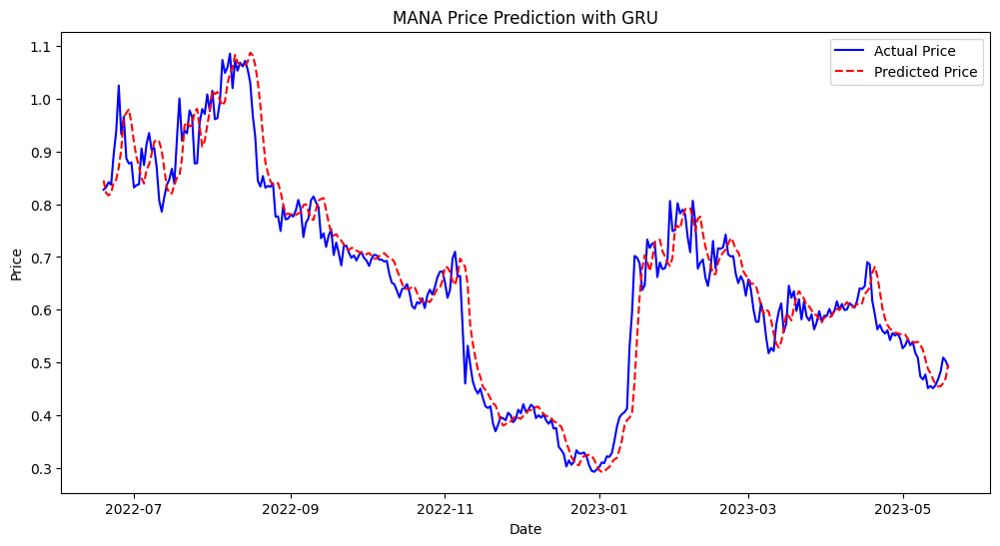

Metrics for GRU Model on MANA: {'MSE': 8.286239756887236e-05, 'MAE': 0.006307933139347457, 'RMSE': 0.009102878532028886, 'R2': 0.9316650719719866}


In [43]:
# Build the GRU model
model_gru_mana = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_mana.shape[1], X_train_mana.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_mana.compile(optimizer='adam', loss='mse')
history_gru_mana = model_gru_mana.fit(X_train_mana, y_train_mana, epochs=100, batch_size=32, validation_data=(X_validation_mana, y_validation_mana), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_mana = model_gru_mana.predict(X_validation_mana).reshape(-1,1)
mse_gru_mana = mean_squared_error(y_validation_mana, y_pred_gru_mana)
mae_gru_mana = mean_absolute_error(y_validation_mana, y_pred_gru_mana)
rmse_gru_mana = np.sqrt(mse_gru_mana)
r2_gru_mana = r2_score(y_validation_mana, y_pred_gru_mana)

# Store metrics
metrics_gru_mana = {
    "MSE": mse_gru_mana,
    "MAE": mae_gru_mana,
    "RMSE": rmse_gru_mana,
    "R2": r2_gru_mana
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_mana = scaler_label.inverse_transform(y_validation_mana.reshape(-1, 1))
y_pred_actual_gru_mana = scaler_label.inverse_transform(y_pred_gru_mana)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_mana.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_mana.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('MANA Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on MANA:", metrics_gru_mana)

## Bi-LSTM

Epoch 1/100
53/53 [==============================] - 2s 10ms/step - loss: 0.0031 - val_loss: 1.6475e-04
Epoch 2/100
53/53 [==============================] - 0s 8ms/step - loss: 0.0014 - val_loss: 1.2604e-04
Epoch 3/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 2.9593e-04
Epoch 4/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 3.3352e-04
Epoch 5/100
53/53 [==============================] - 0s 5ms/step - loss: 9.0548e-04 - val_loss: 3.6412e-04
Epoch 6/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 2.2374e-04
Epoch 7/100
53/53 [==============================] - 0s 5ms/step - loss: 8.7528e-04 - val_loss: 1.0352e-04
Epoch 8/100
53/53 [==============================] - 0s 6ms/step - loss: 8.0477e-04 - val_loss: 1.2900e-04
Epoch 9/100
53/53 [==============================] - 0s 5ms/step - loss: 8.3052e-04 - val_loss: 1.2121e-04
Epoch 10/100
53/53 [==============================] - 0s

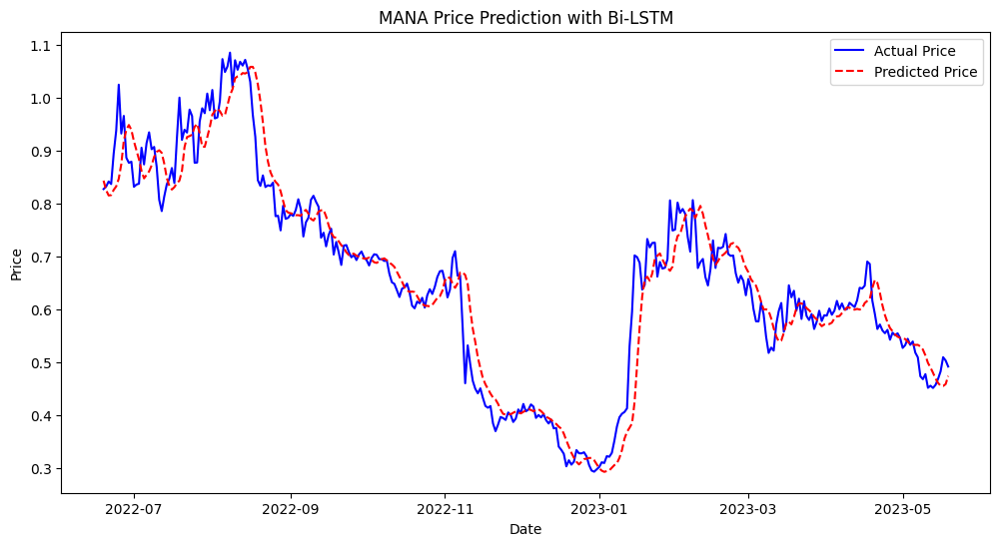

Metrics for Bi-LSTM Model on MANA: {'MSE': 9.610566140912272e-05, 'MAE': 0.006836346623589585, 'RMSE': 0.009803349499488566, 'R2': 0.9207436225820227}


In [44]:
# Build the Bi-LSTM model
model_bilstm_mana = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_mana.shape[1], X_train_mana.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_mana.compile(optimizer='adam', loss='mse')
history_bilstm_mana = model_bilstm_mana.fit(X_train_mana, y_train_mana, epochs=100, batch_size=32, validation_data=(X_validation_mana, y_validation_mana), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_mana = model_bilstm_mana.predict(X_validation_mana).reshape(-1, 1)
mse_bilstm_mana = mean_squared_error(y_validation_mana, y_pred_bilstm_mana)
mae_bilstm_mana = mean_absolute_error(y_validation_mana, y_pred_bilstm_mana)
rmse_bilstm_mana = np.sqrt(mse_bilstm_mana)
r2_bilstm_mana = r2_score(y_validation_mana, y_pred_bilstm_mana)

# Store metrics
metrics_bilstm_mana = {
    "MSE": mse_bilstm_mana,
    "MAE": mae_bilstm_mana,
    "RMSE": rmse_bilstm_mana,
    "R2": r2_bilstm_mana
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_mana = scaler_label.inverse_transform(y_validation_mana.reshape(-1, 1))
y_pred_actual_bilstm_mana = scaler_label.inverse_transform(y_pred_bilstm_mana)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_mana.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_mana.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('MANA Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on MANA:", metrics_bilstm_mana)

# 12. VET

## LSTM

Epoch 1/100
46/46 [==============================] - 1s 9ms/step - loss: 0.0088 - val_loss: 5.6221e-05
Epoch 2/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0022 - val_loss: 4.7854e-05
Epoch 3/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 4.9222e-05
Epoch 4/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 6.0654e-05
Epoch 5/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 4.8211e-05
Epoch 6/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 1.1177e-04
Epoch 7/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 1.1855e-04
Epoch 8/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 2.1155e-04
Epoch 9/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 4.2766e-05
Epoch 10/100
46/46 [==============================] - 0s 5ms/step - loss:

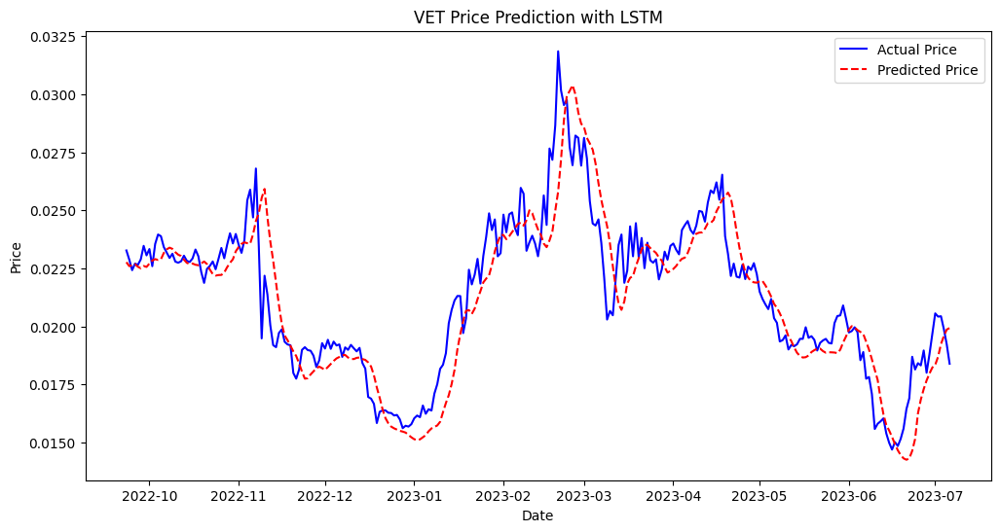

Metrics for LSTM Model on VET: {'MSE': 3.4087020667059305e-05, 'MAE': 0.004327598588572453, 'RMSE': 0.005838409086991019, 'R2': 0.7965678146801285}


In [45]:
# Define features and target
vet = get_crypto_data('VET')
features = vet.drop(["Close"], axis=1)
label = vet["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_vet_features, validation_label, test_vet_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)


# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_vet, y_train_vet = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_vet, y_validation_vet = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_vet = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_vet.shape[1], X_train_vet.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_vet.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_vet = model_lstm_vet.fit(X_train_vet, y_train_vet, epochs=100, batch_size=32, validation_data=(X_validation_vet, y_validation_vet), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_vet = model_lstm_vet.evaluate(X_validation_vet, y_validation_vet)

# prediction
y_pred_lstm_vet = model_lstm_vet.predict(X_validation_vet).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_vet = mean_squared_error(y_validation_vet, y_pred_lstm_vet)
mae_lstm_vet = mean_absolute_error(y_validation_vet, y_pred_lstm_vet)
rmse_lstm_vet = np.sqrt(mse_lstm_vet)
r2_lstm_vet = r2_score(y_validation_vet, y_pred_lstm_vet)

# Store metrics for later comparison
metrics_lstm_vet = {
    "MSE": mse_lstm_vet,
    "MAE": mae_lstm_vet,
    "RMSE": rmse_lstm_vet,
    "R2": r2_lstm_vet
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_vet = scaler_label.inverse_transform(y_validation_vet.reshape(-1, 1))
y_pred_actual_lstm_vet = scaler_label.inverse_transform(y_pred_lstm_vet)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_vet.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_vet.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('VET Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on VET:", metrics_lstm_vet)

## GRU

Epoch 1/100
46/46 [==============================] - 1s 9ms/step - loss: 0.0030 - val_loss: 7.9620e-05
Epoch 2/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 3.0308e-05
Epoch 3/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 2.1302e-04
Epoch 4/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 2.3216e-04
Epoch 5/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 8.8515e-05
Epoch 6/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 2.6897e-05
Epoch 7/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 1.1474e-04
Epoch 8/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 1.3462e-04
Epoch 9/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 1.4696e-04
Epoch 10/100
46/46 [==============================] - 0s 5ms/step - loss:

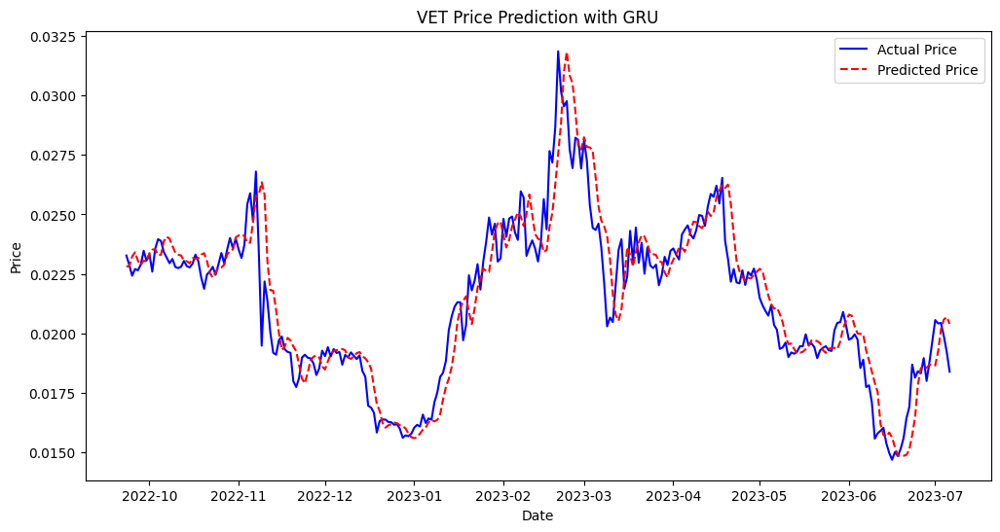

Metrics for GRU Model on VET: {'MSE': 2.431084077058068e-05, 'MAE': 0.00349600822852643, 'RMSE': 0.0049306024754162325, 'R2': 0.8549122989296056}


In [46]:
# Build the GRU model
model_gru_vet = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_vet.shape[1], X_train_vet.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_vet.compile(optimizer='adam', loss='mse')
history_gru_vet = model_gru_vet.fit(X_train_vet, y_train_vet, epochs=100, batch_size=32, validation_data=(X_validation_vet, y_validation_vet), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_vet = model_gru_vet.predict(X_validation_vet).reshape(-1,1)
mse_gru_vet = mean_squared_error(y_validation_vet, y_pred_gru_vet)
mae_gru_vet = mean_absolute_error(y_validation_vet, y_pred_gru_vet)
rmse_gru_vet = np.sqrt(mse_gru_vet)
r2_gru_vet = r2_score(y_validation_vet, y_pred_gru_vet)

# Store metrics
metrics_gru_vet = {
    "MSE": mse_gru_vet,
    "MAE": mae_gru_vet,
    "RMSE": rmse_gru_vet,
    "R2": r2_gru_vet
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_vet = scaler_label.inverse_transform(y_validation_vet.reshape(-1, 1))
y_pred_actual_gru_vet = scaler_label.inverse_transform(y_pred_gru_vet)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_vet.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_vet.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('VET Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on VET:", metrics_gru_vet)

## Bi-LSTM

Epoch 1/100
46/46 [==============================] - 2s 10ms/step - loss: 0.0099 - val_loss: 7.5918e-05
Epoch 2/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0024 - val_loss: 5.6073e-05
Epoch 3/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 8.4108e-05
Epoch 4/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 4.8284e-05
Epoch 5/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 5.7983e-05
Epoch 6/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 3.8436e-04
Epoch 7/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 1.3939e-04
Epoch 8/100
46/46 [==============================] - 0s 7ms/step - loss: 0.0014 - val_loss: 7.9442e-05
Epoch 9/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 4.0411e-05
Epoch 10/100
46/46 [==============================] - 0s 5ms/step - loss

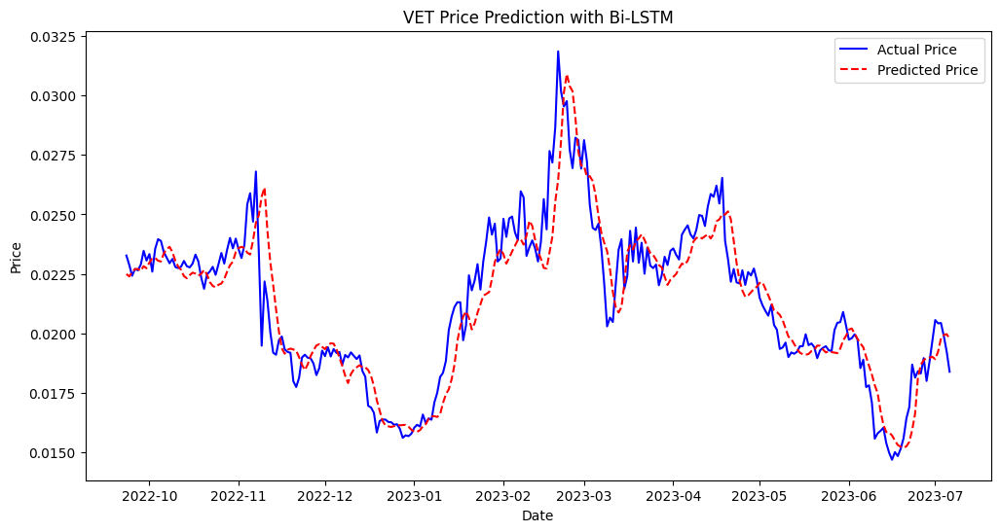

Metrics for Bi-LSTM Model on VET: {'MSE': 2.607148113939857e-05, 'MAE': 0.003714541521109793, 'RMSE': 0.005106024004976726, 'R2': 0.8444047535125567}


In [47]:
# Build the Bi-LSTM model
model_bilstm_vet = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_vet.shape[1], X_train_vet.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_vet.compile(optimizer='adam', loss='mse')
history_bilstm_vet = model_bilstm_vet.fit(X_train_vet, y_train_vet, epochs=100, batch_size=32, validation_data=(X_validation_vet, y_validation_vet), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_vet = model_bilstm_vet.predict(X_validation_vet).reshape(-1, 1)
mse_bilstm_vet = mean_squared_error(y_validation_vet, y_pred_bilstm_vet)
mae_bilstm_vet = mean_absolute_error(y_validation_vet, y_pred_bilstm_vet)
rmse_bilstm_vet = np.sqrt(mse_bilstm_vet)
r2_bilstm_vet = r2_score(y_validation_vet, y_pred_bilstm_vet)

# Store metrics
metrics_bilstm_vet = {
    "MSE": mse_bilstm_vet,
    "MAE": mae_bilstm_vet,
    "RMSE": rmse_bilstm_vet,
    "R2": r2_bilstm_vet
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_vet = scaler_label.inverse_transform(y_validation_vet.reshape(-1, 1))
y_pred_actual_bilstm_vet = scaler_label.inverse_transform(y_pred_bilstm_vet)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_vet.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_vet.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('VET Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on VET:", metrics_bilstm_vet)

# 13. XMR

## LSTM

Epoch 1/100
79/79 [==============================] - 1s 7ms/step - loss: 0.0036 - val_loss: 0.0015
Epoch 2/100
79/79 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 0.0021
Epoch 3/100
79/79 [==============================] - 1s 7ms/step - loss: 0.0014 - val_loss: 0.0013
Epoch 4/100
79/79 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 0.0018
Epoch 5/100
79/79 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 0.0023
Epoch 6/100
79/79 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 0.0014
Epoch 7/100
79/79 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 0.0012
Epoch 8/100
79/79 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 0.0017
Epoch 9/100
79/79 [==============================] - 0s 5ms/step - loss: 9.1839e-04 - val_loss: 0.0027
Epoch 10/100
79/79 [==============================] - 0s 5ms/step - loss: 9.3435e-04 - val_loss: 0.0011
E

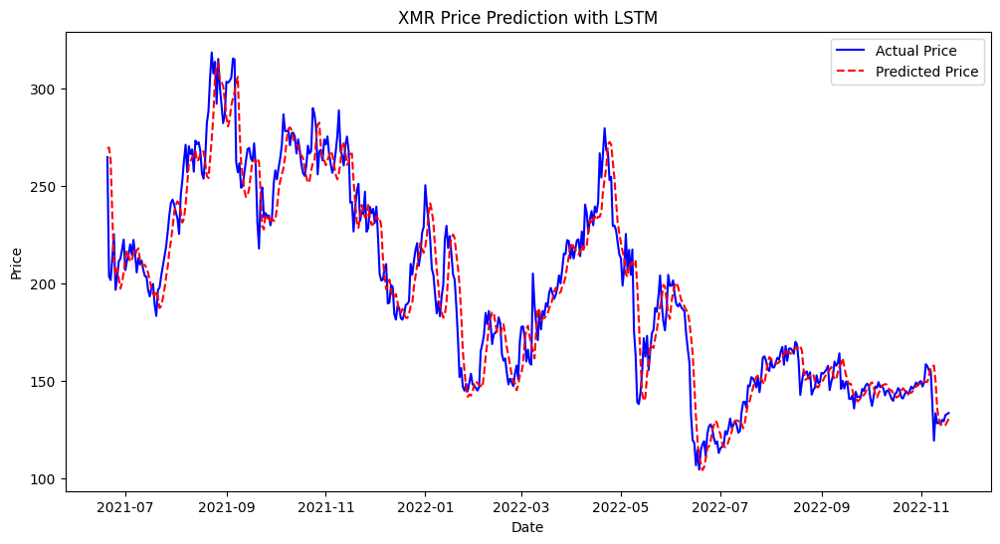

Metrics for LSTM Model on XMR: {'MSE': 0.0009145754343972284, 'MAE': 0.021516898006814666, 'RMSE': 0.030241948257300297, 'R2': 0.9152952942211169}


In [48]:
# Define features and target
xmr = get_crypto_data('XMR')
features = xmr.drop(["Close"], axis=1)
label = xmr["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_xmr_features, validation_label, test_xmr_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)


# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_xmr, y_train_xmr = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_xmr, y_validation_xmr = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_xmr = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_xmr.shape[1], X_train_xmr.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_xmr.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_xmr = model_lstm_xmr.fit(X_train_xmr, y_train_xmr, epochs=100, batch_size=32, validation_data=(X_validation_xmr, y_validation_xmr), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_xmr = model_lstm_xmr.evaluate(X_validation_xmr, y_validation_xmr)

# prediction
y_pred_lstm_xmr = model_lstm_xmr.predict(X_validation_xmr).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_xmr = mean_squared_error(y_validation_xmr, y_pred_lstm_xmr)
mae_lstm_xmr = mean_absolute_error(y_validation_xmr, y_pred_lstm_xmr)
rmse_lstm_xmr = np.sqrt(mse_lstm_xmr)
r2_lstm_xmr = r2_score(y_validation_xmr, y_pred_lstm_xmr)

# Store metrics for later comparison
metrics_lstm_xmr = {
    "MSE": mse_lstm_xmr,
    "MAE": mae_lstm_xmr,
    "RMSE": rmse_lstm_xmr,
    "R2": r2_lstm_xmr
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_xmr = scaler_label.inverse_transform(y_validation_xmr.reshape(-1, 1))
y_pred_actual_lstm_xmr = scaler_label.inverse_transform(y_pred_lstm_xmr)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_xmr.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_xmr.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('XMR Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on XMR:", metrics_lstm_xmr)

## GRU

Epoch 1/100
79/79 [==============================] - 1s 7ms/step - loss: 0.0027 - val_loss: 0.0010
Epoch 2/100
79/79 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 9.7030e-04
Epoch 3/100
79/79 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 9.4842e-04
Epoch 4/100
79/79 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 0.0014
Epoch 5/100
79/79 [==============================] - 0s 5ms/step - loss: 8.6434e-04 - val_loss: 0.0013
Epoch 6/100
79/79 [==============================] - 0s 5ms/step - loss: 9.1751e-04 - val_loss: 0.0023
Epoch 7/100
79/79 [==============================] - 0s 5ms/step - loss: 8.3323e-04 - val_loss: 0.0016
Epoch 8/100
79/79 [==============================] - 0s 5ms/step - loss: 8.2489e-04 - val_loss: 9.9358e-04
Epoch 9/100
79/79 [==============================] - 0s 5ms/step - loss: 8.8533e-04 - val_loss: 8.2839e-04
Epoch 10/100
79/79 [==============================] - 0s 5ms/step - loss:

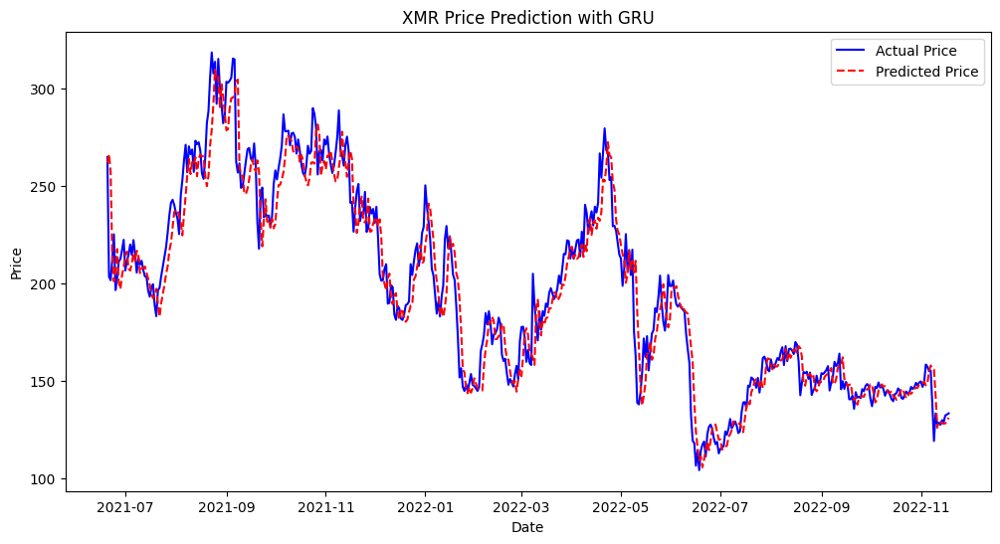

Metrics for GRU Model on XMR: {'MSE': 0.0007932975304275185, 'MAE': 0.02017526565195301, 'RMSE': 0.028165537992864944, 'R2': 0.9265276199395575}


In [49]:
# Build the GRU model
model_gru_xmr = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_xmr.shape[1], X_train_xmr.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_xmr.compile(optimizer='adam', loss='mse')
history_gru_xmr = model_gru_xmr.fit(X_train_xmr, y_train_xmr, epochs=100, batch_size=32, validation_data=(X_validation_xmr, y_validation_xmr), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_xmr = model_gru_xmr.predict(X_validation_xmr).reshape(-1,1)
mse_gru_xmr = mean_squared_error(y_validation_xmr, y_pred_gru_xmr)
mae_gru_xmr = mean_absolute_error(y_validation_xmr, y_pred_gru_xmr)
rmse_gru_xmr = np.sqrt(mse_gru_xmr)
r2_gru_xmr = r2_score(y_validation_xmr, y_pred_gru_xmr)

# Store metrics
metrics_gru_xmr = {
    "MSE": mse_gru_xmr,
    "MAE": mae_gru_xmr,
    "RMSE": rmse_gru_xmr,
    "R2": r2_gru_xmr
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_xmr = scaler_label.inverse_transform(y_validation_xmr.reshape(-1, 1))
y_pred_actual_gru_xmr = scaler_label.inverse_transform(y_pred_gru_xmr)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_xmr.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_xmr.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('XMR Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on XMR:", metrics_gru_xmr)

## Bi-LSTM

Epoch 1/100
79/79 [==============================] - 2s 8ms/step - loss: 0.0054 - val_loss: 0.0019
Epoch 2/100
79/79 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 0.0021
Epoch 3/100
79/79 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 4/100
79/79 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 0.0013
Epoch 5/100
79/79 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 0.0014
Epoch 6/100
79/79 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 0.0012
Epoch 7/100
79/79 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 0.0016
Epoch 8/100
79/79 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 0.0012
Epoch 9/100
79/79 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 10/100
79/79 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 11/

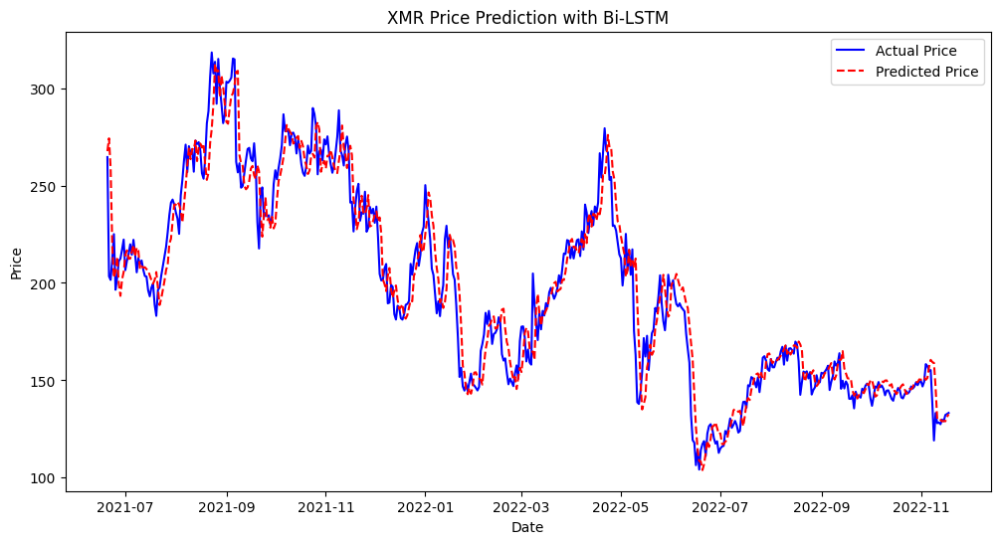

Metrics for Bi-LSTM Model on XMR: {'MSE': 0.0008253996198923937, 'MAE': 0.020374880386367904, 'RMSE': 0.028729768879898664, 'R2': 0.9235544392255994}


In [50]:
# Build the Bi-LSTM model
model_bilstm_xmr = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_xmr.shape[1], X_train_xmr.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_xmr.compile(optimizer='adam', loss='mse')
history_bilstm_xmr = model_bilstm_xmr.fit(X_train_xmr, y_train_xmr, epochs=100, batch_size=32, validation_data=(X_validation_xmr, y_validation_xmr), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_xmr = model_bilstm_xmr.predict(X_validation_xmr).reshape(-1, 1)
mse_bilstm_xmr = mean_squared_error(y_validation_xmr, y_pred_bilstm_xmr)
mae_bilstm_xmr = mean_absolute_error(y_validation_xmr, y_pred_bilstm_xmr)
rmse_bilstm_xmr = np.sqrt(mse_bilstm_xmr)
r2_bilstm_xmr = r2_score(y_validation_xmr, y_pred_bilstm_xmr)

# Store metrics
metrics_bilstm_xmr = {
    "MSE": mse_bilstm_xmr,
    "MAE": mae_bilstm_xmr,
    "RMSE": rmse_bilstm_xmr,
    "R2": r2_bilstm_xmr
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_bilstm_xmr = scaler_label.inverse_transform(y_validation_xmr.reshape(-1, 1))
y_pred_actual_bilstm_xmr = scaler_label.inverse_transform(y_pred_bilstm_xmr)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_xmr.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_xmr.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('XMR Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on XMR:", metrics_bilstm_xmr)

# 14. BCH

## LSTM

Epoch 1/100
54/54 [==============================] - 1s 8ms/step - loss: 0.0016 - val_loss: 5.4339e-05
Epoch 2/100
54/54 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 4.9092e-06
Epoch 3/100
54/54 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 3.0626e-05
Epoch 4/100
54/54 [==============================] - 0s 5ms/step - loss: 9.8570e-04 - val_loss: 1.9666e-05
Epoch 5/100
54/54 [==============================] - 0s 5ms/step - loss: 9.5132e-04 - val_loss: 1.4625e-05
Epoch 6/100
54/54 [==============================] - 0s 5ms/step - loss: 9.0527e-04 - val_loss: 5.5086e-06
Epoch 7/100
54/54 [==============================] - 0s 5ms/step - loss: 8.3530e-04 - val_loss: 9.8842e-06
Epoch 8/100
54/54 [==============================] - 0s 5ms/step - loss: 9.0649e-04 - val_loss: 8.3047e-06
Epoch 9/100
54/54 [==============================] - 0s 5ms/step - loss: 7.6745e-04 - val_loss: 1.5836e-05
Epoch 10/100
54/54 [=============================

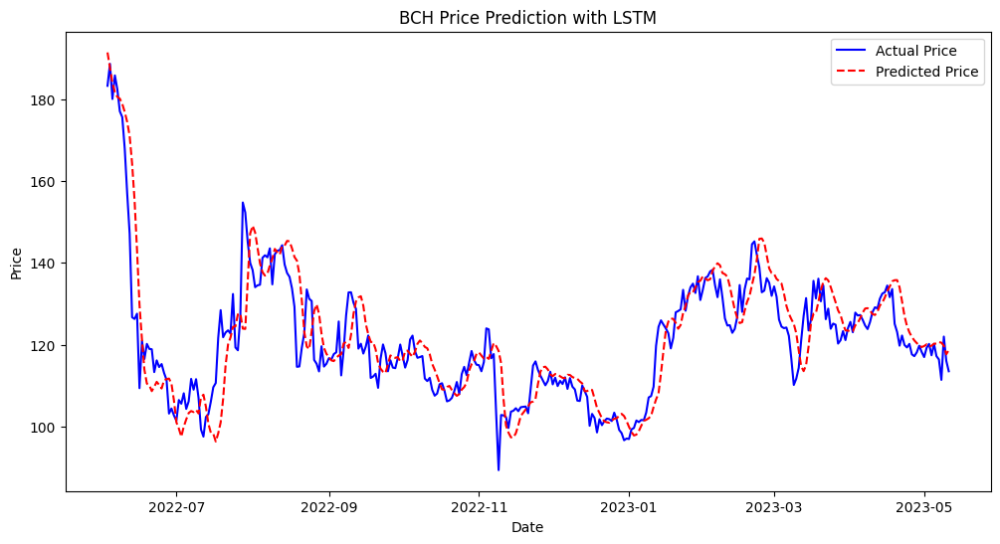

Metrics for LSTM Model on BCH: {'MSE': 4.197606433875861e-06, 'MAE': 0.0014488322039150762, 'RMSE': 0.002048806099628723, 'R2': 0.727633494101499}


In [51]:
# Define features and target
bch = get_crypto_data('BCH')
features = bch.drop(["Close"], axis=1)
label = bch["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_bch_features, validation_label, test_bch_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)


# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_bch, y_train_bch = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_bch, y_validation_bch = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_bch = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_bch.shape[1], X_train_bch.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_bch.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_bch = model_lstm_bch.fit(X_train_bch, y_train_bch, epochs=100, batch_size=32, validation_data=(X_validation_bch, y_validation_bch), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_bch = model_lstm_bch.evaluate(X_validation_bch, y_validation_bch)

# prediction
y_pred_lstm_bch = model_lstm_bch.predict(X_validation_bch).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_bch = mean_squared_error(y_validation_bch, y_pred_lstm_bch)
mae_lstm_bch = mean_absolute_error(y_validation_bch, y_pred_lstm_bch)
rmse_lstm_bch = np.sqrt(mse_lstm_bch)
r2_lstm_bch = r2_score(y_validation_bch, y_pred_lstm_bch)

# Store metrics for later comparison
metrics_lstm_bch = {
    "MSE": mse_lstm_bch,
    "MAE": mae_lstm_bch,
    "RMSE": rmse_lstm_bch,
    "R2": r2_lstm_bch
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_bch = scaler_label.inverse_transform(y_validation_bch.reshape(-1, 1))
y_pred_actual_lstm_bch = scaler_label.inverse_transform(y_pred_lstm_bch)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_bch.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_bch.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('BCH Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on BCH:", metrics_lstm_bch)

## GRU

Epoch 1/100
54/54 [==============================] - 1s 8ms/step - loss: 0.0089 - val_loss: 1.8901e-05
Epoch 2/100
54/54 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 1.8292e-04
Epoch 3/100
54/54 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 1.4595e-05
Epoch 4/100
54/54 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 1.3173e-05
Epoch 5/100
54/54 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 7.6658e-06
Epoch 6/100
54/54 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 5.8503e-06
Epoch 7/100
54/54 [==============================] - 0s 5ms/step - loss: 8.7771e-04 - val_loss: 2.2961e-05
Epoch 8/100
54/54 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 1.2614e-04
Epoch 9/100
54/54 [==============================] - 0s 5ms/step - loss: 9.5152e-04 - val_loss: 6.7022e-05
Epoch 10/100
54/54 [==============================] - 0s 5ms/step

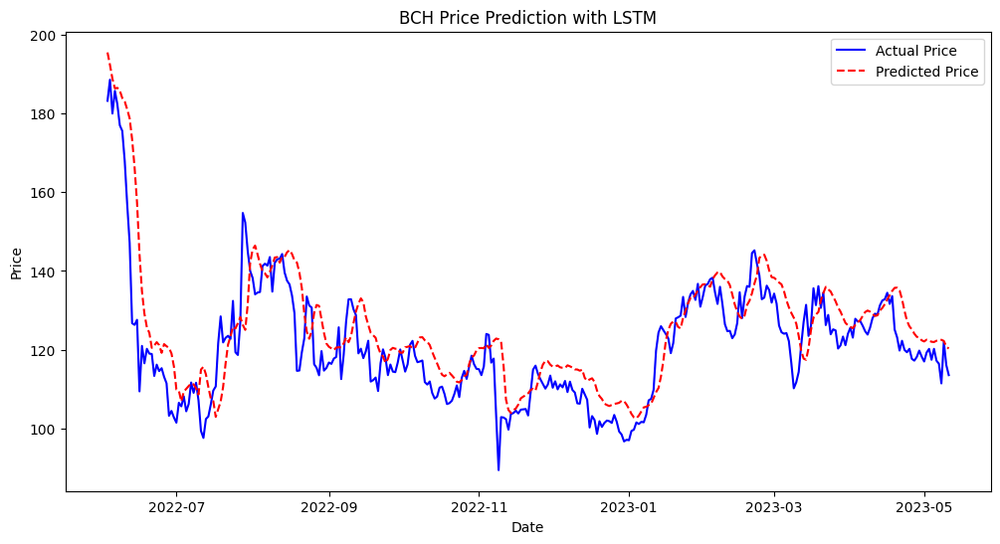

Metrics for LSTM Model on BCH: {'MSE': 5.8502892616423386e-06, 'MAE': 0.0017699732984206048, 'RMSE': 0.0024187371212354473, 'R2': 0.6203972740679843}


In [52]:
# Build the LSTM model
model_gru_bch = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_bch.shape[1], X_train_bch.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_gru_bch.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_gru_bch = model_gru_bch.fit(X_train_bch, y_train_bch, epochs=100, batch_size=32, validation_data=(X_validation_bch, y_validation_bch), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_gru_bch = model_gru_bch.evaluate(X_validation_bch, y_validation_bch)

# Prediction
y_pred_gru_bch = model_gru_bch.predict(X_validation_bch).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_gru_bch = mean_squared_error(y_validation_bch, y_pred_gru_bch)
mae_gru_bch = mean_absolute_error(y_validation_bch, y_pred_gru_bch)
rmse_gru_bch = np.sqrt(mse_gru_bch)
r2_gru_bch = r2_score(y_validation_bch, y_pred_gru_bch)

# Store metrics for later comparison
metrics_gru_bch = {
    "MSE": mse_gru_bch,
    "MAE": mae_gru_bch,
    "RMSE": rmse_gru_bch,
    "R2": r2_gru_bch
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_gru_bch = scaler_label.inverse_transform(y_validation_bch.reshape(-1, 1))
y_pred_actual_gru_bch = scaler_label.inverse_transform(y_pred_gru_bch)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_bch.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_bch.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('BCH Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on BCH:", metrics_gru_bch)

## Bi-LSTM

Epoch 1/100
54/54 [==============================] - 1s 10ms/step - loss: 0.0057 - val_loss: 8.5248e-05
Epoch 2/100
54/54 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 3.0512e-05
Epoch 3/100
54/54 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 7.1785e-05
Epoch 4/100
54/54 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 1.4043e-05
Epoch 5/100
54/54 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 7.6414e-06
Epoch 6/100
54/54 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 1.3310e-05
Epoch 7/100
54/54 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 1.9913e-05
Epoch 8/100
54/54 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 1.5681e-05
Epoch 9/100
54/54 [==============================] - 0s 5ms/step - loss: 9.4462e-04 - val_loss: 1.5268e-05
Epoch 10/100
54/54 [==============================] - 0s 5ms/step - 

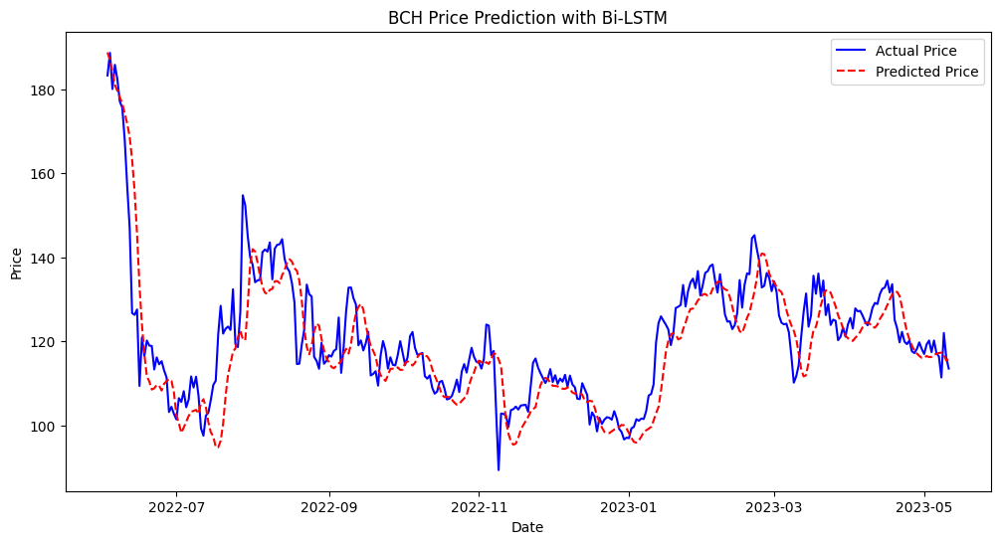

Metrics for Bi-LSTM Model on BCH: {'MSE': 4.621600330937325e-06, 'MAE': 0.0015488642985491121, 'RMSE': 0.002149790764455305, 'R2': 0.7001221639937144}


In [53]:
# Build the Bi-LSTM model
model_bilstm_bch = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_bch.shape[1], X_train_bch.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_bch.compile(optimizer='adam', loss='mse')
history_bilstm_bch = model_bilstm_bch.fit(X_train_bch, y_train_bch, epochs=100, batch_size=32, validation_data=(X_validation_bch, y_validation_bch), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_bch = model_bilstm_bch.predict(X_validation_bch).reshape(-1, 1)
mse_bilstm_bch = mean_squared_error(y_validation_bch, y_pred_bilstm_bch)
mae_bilstm_bch = mean_absolute_error(y_validation_bch, y_pred_bilstm_bch)
rmse_bilstm_bch = np.sqrt(mse_bilstm_bch)
r2_bilstm_bch = r2_score(y_validation_bch, y_pred_bilstm_bch)

# Store metrics
metrics_bilstm_bch = {
    "MSE": mse_bilstm_bch,
    "MAE": mae_bilstm_bch,
    "RMSE": rmse_bilstm_bch,
    "R2": r2_bilstm_bch
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_bch = scaler_label.inverse_transform(y_validation_bch.reshape(-1, 1))
y_pred_actual_bilstm_bch = scaler_label.inverse_transform(y_pred_bilstm_bch)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_bch.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_bch.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('BCH Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on BCH:", metrics_bilstm_bch)

# 15. AVAX

## LSTM

Epoch 1/100
29/29 [==============================] - 1s 11ms/step - loss: 0.0203 - val_loss: 9.7998e-04
Epoch 2/100
29/29 [==============================] - 0s 5ms/step - loss: 0.0043 - val_loss: 1.4675e-04
Epoch 3/100
29/29 [==============================] - 0s 5ms/step - loss: 0.0035 - val_loss: 6.9333e-05
Epoch 4/100
29/29 [==============================] - 0s 5ms/step - loss: 0.0032 - val_loss: 7.1890e-05
Epoch 5/100
29/29 [==============================] - 0s 5ms/step - loss: 0.0032 - val_loss: 6.4483e-05
Epoch 6/100
29/29 [==============================] - 0s 6ms/step - loss: 0.0029 - val_loss: 5.8149e-05
Epoch 7/100
29/29 [==============================] - 0s 5ms/step - loss: 0.0030 - val_loss: 3.5463e-05
Epoch 8/100
29/29 [==============================] - 0s 5ms/step - loss: 0.0030 - val_loss: 1.2517e-04
Epoch 9/100
29/29 [==============================] - 0s 5ms/step - loss: 0.0027 - val_loss: 2.4754e-05
Epoch 10/100
29/29 [==============================] - 0s 5ms/step - loss

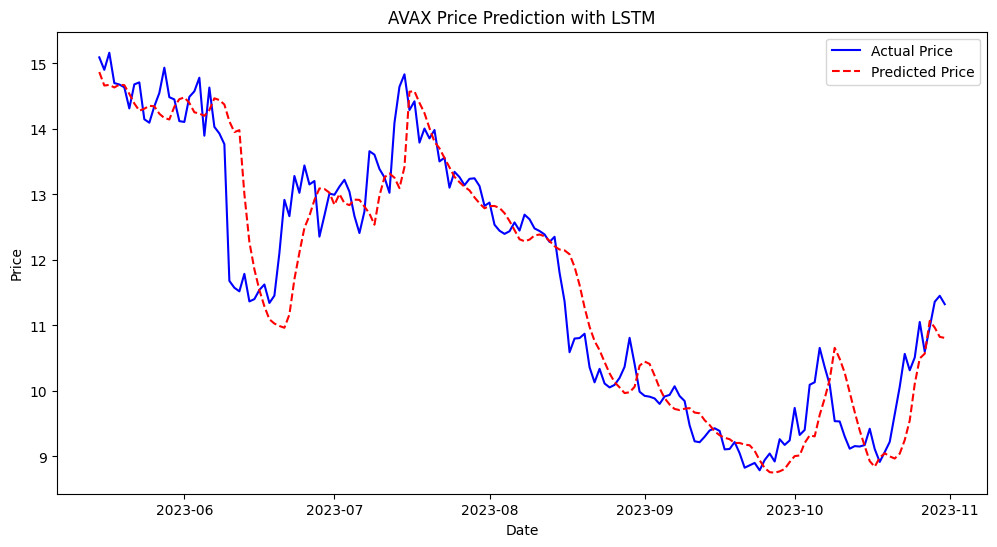

Metrics for LSTM Model on AVAX: {'MSE': 2.3202783536718244e-05, 'MAE': 0.0033720248612124277, 'RMSE': 0.004816926773028447, 'R2': 0.8939265517447214}


In [54]:
# Define features and target
avax = get_crypto_data('AVAX')
features = avax.drop(["Close"], axis=1)
label = avax["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_avax_features, validation_label, test_avax_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)


# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_avax, y_train_avax = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_avax, y_validation_avax = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_avax = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_avax.shape[1], X_train_avax.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_avax.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_avax = model_lstm_avax.fit(X_train_avax, y_train_avax, epochs=100, batch_size=32, validation_data=(X_validation_avax, y_validation_avax), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_avax = model_lstm_avax.evaluate(X_validation_avax, y_validation_avax)

# Prediction
y_pred_lstm_avax = model_lstm_avax.predict(X_validation_avax).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_avax = mean_squared_error(y_validation_avax, y_pred_lstm_avax)
mae_lstm_avax = mean_absolute_error(y_validation_avax, y_pred_lstm_avax)
rmse_lstm_avax = np.sqrt(mse_lstm_avax)
r2_lstm_avax = r2_score(y_validation_avax, y_pred_lstm_avax)

# Store metrics for later comparison
metrics_lstm_avax = {
    "MSE": mse_lstm_avax,
    "MAE": mae_lstm_avax,
    "RMSE": rmse_lstm_avax,
    "R2": r2_lstm_avax
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_avax = scaler_label.inverse_transform(y_validation_avax.reshape(-1, 1))
y_pred_actual_lstm_avax = scaler_label.inverse_transform(y_pred_lstm_avax)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_avax.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_avax.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('AVAX Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on AVAX:", metrics_lstm_avax)

## GRU

Epoch 1/100
29/29 [==============================] - 1s 11ms/step - loss: 0.0315 - val_loss: 0.0013
Epoch 2/100
29/29 [==============================] - 0s 5ms/step - loss: 0.0044 - val_loss: 5.7638e-05
Epoch 3/100
29/29 [==============================] - 0s 5ms/step - loss: 0.0034 - val_loss: 3.7704e-05
Epoch 4/100
29/29 [==============================] - 0s 5ms/step - loss: 0.0031 - val_loss: 3.1798e-05
Epoch 5/100
29/29 [==============================] - 0s 5ms/step - loss: 0.0031 - val_loss: 5.2872e-05
Epoch 6/100
29/29 [==============================] - 0s 5ms/step - loss: 0.0030 - val_loss: 2.4147e-05
Epoch 7/100
29/29 [==============================] - 0s 5ms/step - loss: 0.0029 - val_loss: 1.1640e-04
Epoch 8/100
29/29 [==============================] - 0s 5ms/step - loss: 0.0026 - val_loss: 7.7225e-05
Epoch 9/100
29/29 [==============================] - 0s 6ms/step - loss: 0.0026 - val_loss: 6.6340e-05
Epoch 10/100
29/29 [==============================] - 0s 5ms/step - loss: 0.

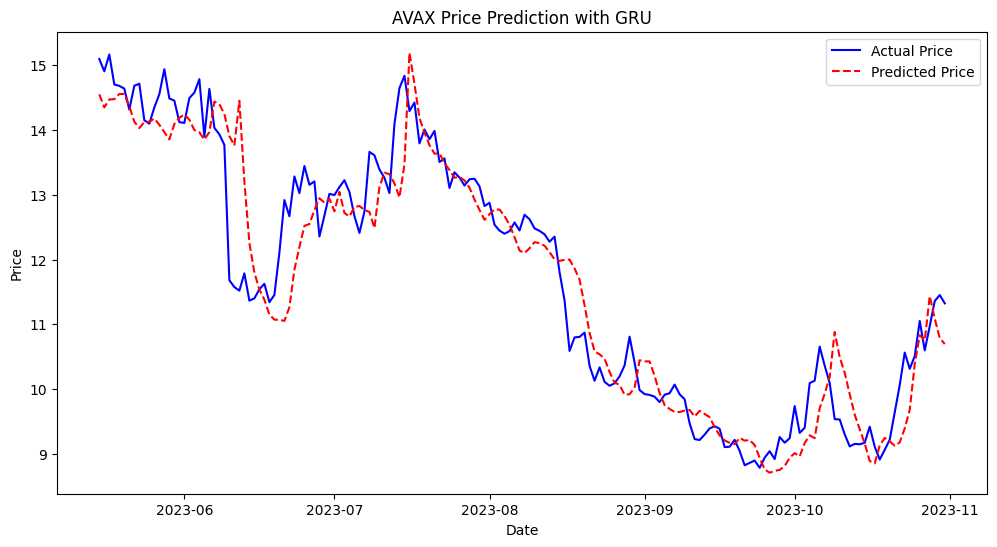

Metrics for GRU Model on AVAX: {'MSE': 2.4147359311533066e-05, 'MAE': 0.003531282353994979, 'RMSE': 0.004913996266943338, 'R2': 0.8896083452927044}


In [55]:
# Build the GRU model
model_gru_avax = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_avax.shape[1], X_train_avax.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_avax.compile(optimizer='adam', loss='mse')
history_gru_avax = model_gru_avax.fit(X_train_avax, y_train_avax, epochs=100, batch_size=32, validation_data=(X_validation_avax, y_validation_avax), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_avax = model_gru_avax.predict(X_validation_avax).reshape(-1,1)
mse_gru_avax = mean_squared_error(y_validation_avax, y_pred_gru_avax)
mae_gru_avax = mean_absolute_error(y_validation_avax, y_pred_gru_avax)
rmse_gru_avax = np.sqrt(mse_gru_avax)
r2_gru_avax = r2_score(y_validation_avax, y_pred_gru_avax)

# Store metrics
metrics_gru_avax = {
    "MSE": mse_gru_avax,
    "MAE": mae_gru_avax,
    "RMSE": rmse_gru_avax,
    "R2": r2_gru_avax
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_avax = scaler_label.inverse_transform(y_validation_avax.reshape(-1, 1))
y_pred_actual_gru_avax = scaler_label.inverse_transform(y_pred_gru_avax)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_avax.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_avax.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('AVAX Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on AVAX:", metrics_gru_avax)

## Bi-LSTM

Epoch 1/100
29/29 [==============================] - 1s 15ms/step - loss: 0.0217 - val_loss: 9.0119e-04
Epoch 2/100
29/29 [==============================] - 0s 6ms/step - loss: 0.0054 - val_loss: 2.3418e-04
Epoch 3/100
29/29 [==============================] - 0s 5ms/step - loss: 0.0043 - val_loss: 1.1565e-04
Epoch 4/100
29/29 [==============================] - 0s 5ms/step - loss: 0.0039 - val_loss: 6.6548e-05
Epoch 5/100
29/29 [==============================] - 0s 5ms/step - loss: 0.0035 - val_loss: 1.2959e-04
Epoch 6/100
29/29 [==============================] - 0s 6ms/step - loss: 0.0031 - val_loss: 3.0161e-05
Epoch 7/100
29/29 [==============================] - 0s 5ms/step - loss: 0.0029 - val_loss: 2.7909e-05
Epoch 8/100
29/29 [==============================] - 0s 6ms/step - loss: 0.0027 - val_loss: 1.2267e-04
Epoch 9/100
29/29 [==============================] - 0s 5ms/step - loss: 0.0026 - val_loss: 4.3318e-05
Epoch 10/100
29/29 [==============================] - 0s 5ms/step - loss

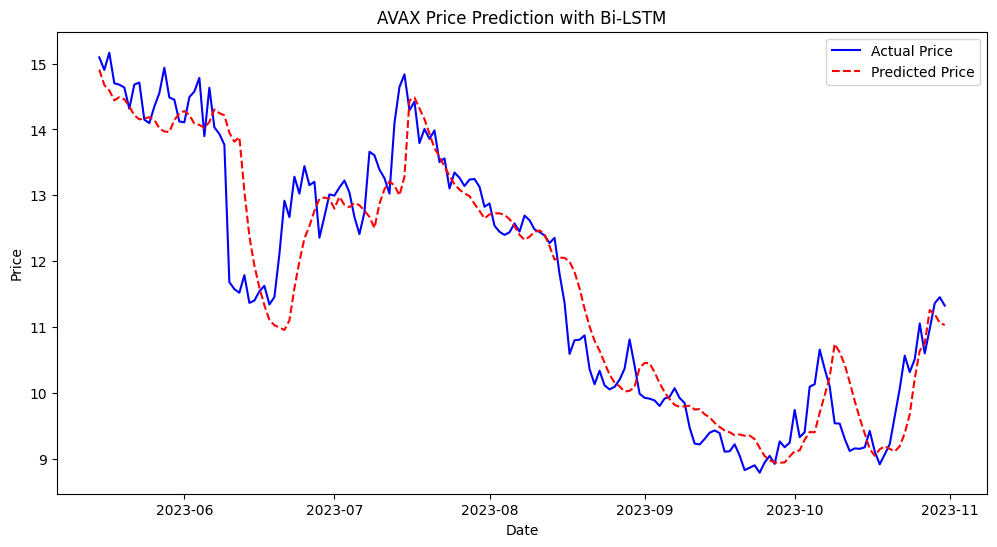

Metrics for Bi-LSTM Model on AVAX: {'MSE': 2.343991056676253e-05, 'MAE': 0.003444757407508953, 'RMSE': 0.004841478138622804, 'R2': 0.8928425058710214}


In [56]:
# Build the Bi-LSTM model
model_bilstm_avax = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_avax.shape[1], X_train_avax.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_avax.compile(optimizer='adam', loss='mse')
history_bilstm_avax = model_bilstm_avax.fit(X_train_avax, y_train_avax, epochs=100, batch_size=32, validation_data=(X_validation_avax, y_validation_avax), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_avax = model_bilstm_avax.predict(X_validation_avax).reshape(-1, 1)
mse_bilstm_avax = mean_squared_error(y_validation_avax, y_pred_bilstm_avax)
mae_bilstm_avax = mean_absolute_error(y_validation_avax, y_pred_bilstm_avax)
rmse_bilstm_avax = np.sqrt(mse_bilstm_avax)
r2_bilstm_avax = r2_score(y_validation_avax, y_pred_bilstm_avax)

# Store metrics
metrics_bilstm_avax = {
    "MSE": mse_bilstm_avax,
    "MAE": mae_bilstm_avax,
    "RMSE": rmse_bilstm_avax,
    "R2": r2_bilstm_avax
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_avax = scaler_label.inverse_transform(y_validation_avax.reshape(-1, 1))
y_pred_actual_bilstm_avax = scaler_label.inverse_transform(y_pred_bilstm_avax)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_avax.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_avax.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('AVAX Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on AVAX:", metrics_bilstm_avax)

# 16. TRX

## LSTM

Epoch 1/100
53/53 [==============================] - 1s 8ms/step - loss: 0.0054 - val_loss: 3.3521e-04
Epoch 2/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0027 - val_loss: 1.1452e-04
Epoch 3/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0023 - val_loss: 1.0533e-04
Epoch 4/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0023 - val_loss: 1.2540e-04
Epoch 5/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 1.5747e-04
Epoch 6/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 2.4858e-04
Epoch 7/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 2.0097e-04
Epoch 8/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 9.2469e-05
Epoch 9/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 9.9167e-05
Epoch 10/100
53/53 [==============================] - 0s 5ms/step - loss:

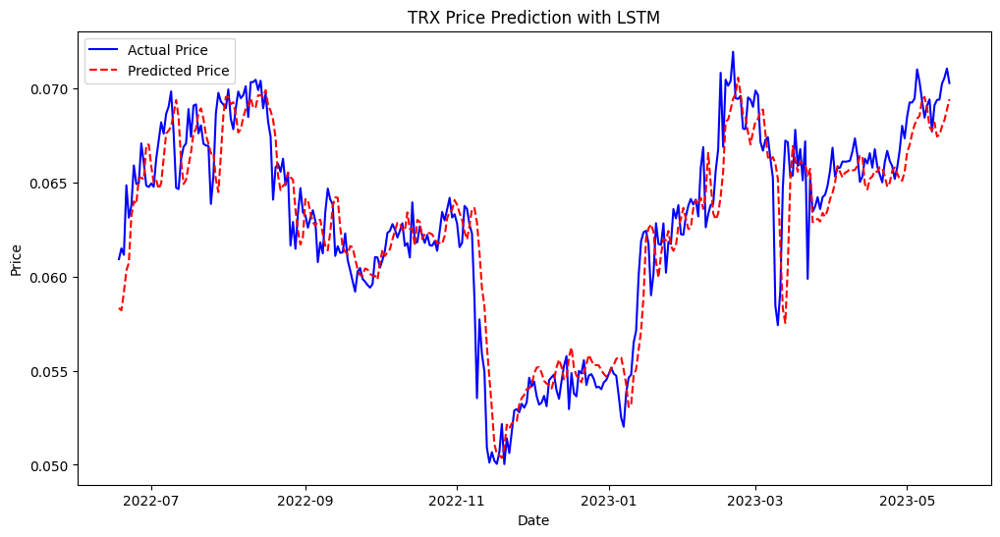

Metrics for LSTM Model on TRX: {'MSE': 8.394030290281589e-05, 'MAE': 0.006586377576938861, 'RMSE': 0.009161894067430374, 'R2': 0.8614272813235807}


In [57]:
# Define features and target
trx = get_crypto_data('TRX')
features = trx.drop(["Close"], axis=1)
label = trx["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_trx_features, validation_label, test_trx_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)

# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_trx, y_train_trx = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_trx, y_validation_trx = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_trx = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_trx.shape[1], X_train_trx.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_trx.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_trx = model_lstm_trx.fit(X_train_trx, y_train_trx, epochs=100, batch_size=32, validation_data=(X_validation_trx, y_validation_trx), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_trx = model_lstm_trx.evaluate(X_validation_trx, y_validation_trx)

# Prediction
y_pred_lstm_trx = model_lstm_trx.predict(X_validation_trx).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_trx = mean_squared_error(y_validation_trx, y_pred_lstm_trx)
mae_lstm_trx = mean_absolute_error(y_validation_trx, y_pred_lstm_trx)
rmse_lstm_trx = np.sqrt(mse_lstm_trx)
r2_lstm_trx = r2_score(y_validation_trx, y_pred_lstm_trx)

# Store metrics for later comparison
metrics_lstm_trx = {
    "MSE": mse_lstm_trx,
    "MAE": mae_lstm_trx,
    "RMSE": rmse_lstm_trx,
    "R2": r2_lstm_trx
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_trx = scaler_label.inverse_transform(y_validation_trx.reshape(-1, 1))
y_pred_actual_lstm_trx = scaler_label.inverse_transform(y_pred_lstm_trx)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_trx.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_trx.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('TRX Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on TRX:", metrics_lstm_trx)

## GRU

Epoch 1/100
53/53 [==============================] - 1s 8ms/step - loss: 0.0045 - val_loss: 2.4856e-04
Epoch 2/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0024 - val_loss: 1.5326e-04
Epoch 3/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 2.6748e-04
Epoch 4/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 1.4863e-04
Epoch 5/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 9.0414e-05
Epoch 6/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 3.1058e-04
Epoch 7/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 8.8338e-05
Epoch 8/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 1.1856e-04
Epoch 9/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 1.4523e-04
Epoch 10/100
53/53 [==============================] - 0s 5ms/step - loss:

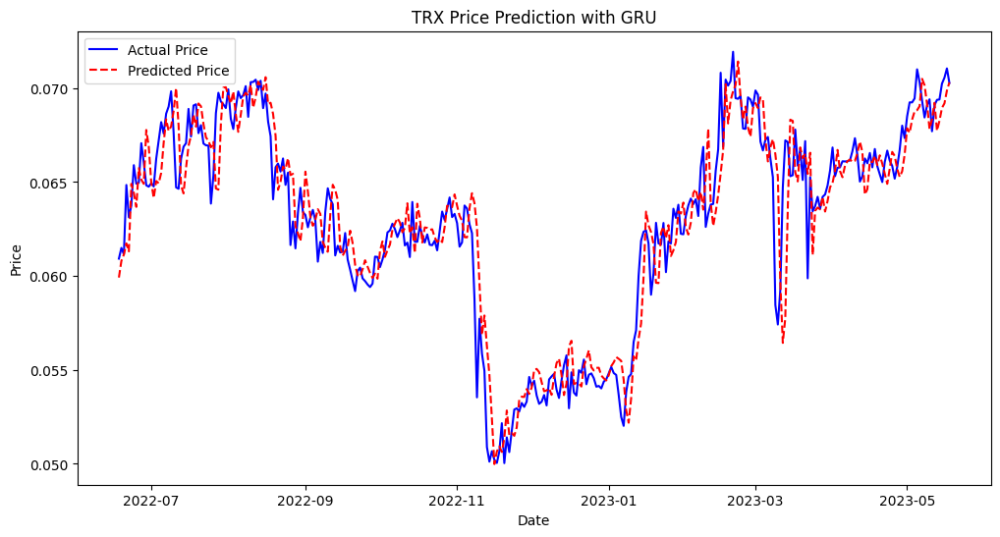

Metrics for GRU Model on TRX: {'MSE': 7.866166847993654e-05, 'MAE': 0.006248290723387967, 'RMSE': 0.008869141360917444, 'R2': 0.8701415067621547}


In [58]:
# Build the GRU model
model_gru_trx = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_trx.shape[1], X_train_trx.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_trx.compile(optimizer='adam', loss='mse')
history_gru_trx = model_gru_trx.fit(X_train_trx, y_train_trx, epochs=100, batch_size=32, validation_data=(X_validation_trx, y_validation_trx), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_trx = model_gru_trx.predict(X_validation_trx).reshape(-1,1)
mse_gru_trx = mean_squared_error(y_validation_trx, y_pred_gru_trx)
mae_gru_trx = mean_absolute_error(y_validation_trx, y_pred_gru_trx)
rmse_gru_trx = np.sqrt(mse_gru_trx)
r2_gru_trx = r2_score(y_validation_trx, y_pred_gru_trx)

# Store metrics
metrics_gru_trx = {
    "MSE": mse_gru_trx,
    "MAE": mae_gru_trx,
    "RMSE": rmse_gru_trx,
    "R2": r2_gru_trx
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_trx = scaler_label.inverse_transform(y_validation_trx.reshape(-1, 1))
y_pred_actual_gru_trx = scaler_label.inverse_transform(y_pred_gru_trx)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_trx.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_trx.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('TRX Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on TRX:", metrics_gru_trx)

## Bi-LSTM

Epoch 1/100
53/53 [==============================] - 1s 10ms/step - loss: 0.0061 - val_loss: 5.3020e-04
Epoch 2/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0029 - val_loss: 1.5092e-04
Epoch 3/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0026 - val_loss: 4.5603e-04
Epoch 4/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0023 - val_loss: 1.8576e-04
Epoch 5/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 4.3050e-04
Epoch 6/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 1.3591e-04
Epoch 7/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 1.3788e-04
Epoch 8/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 1.0949e-04
Epoch 9/100
53/53 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 1.7312e-04
Epoch 10/100
53/53 [==============================] - 0s 5ms/step - loss

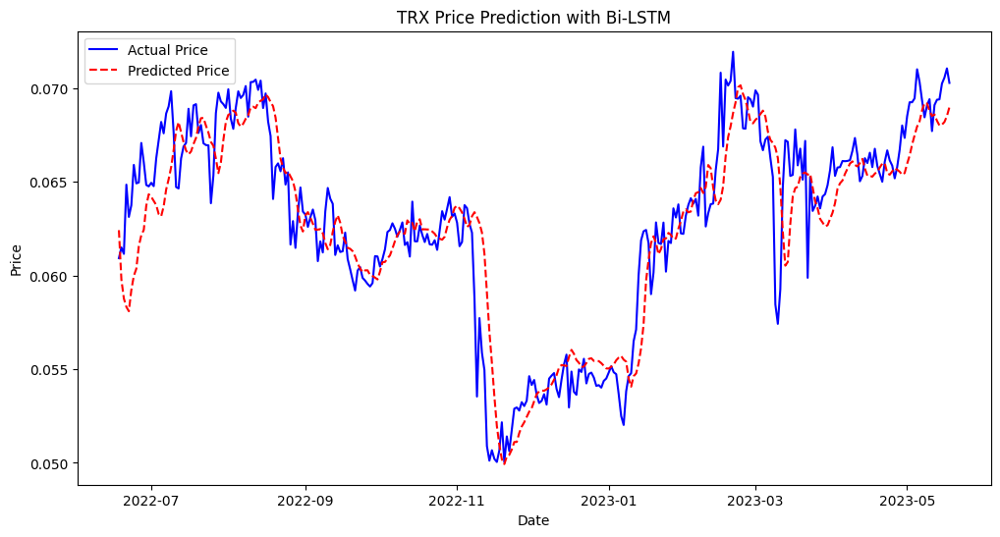

Metrics for Bi-LSTM Model on TRX: {'MSE': 0.00010948796108808851, 'MAE': 0.007448776758240624, 'RMSE': 0.01046364951095403, 'R2': 0.8192519694874074}


In [59]:
# Build the Bi-LSTM model
model_bilstm_trx = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_trx.shape[1], X_train_trx.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_trx.compile(optimizer='adam', loss='mse')
history_bilstm_trx = model_bilstm_trx.fit(X_train_trx, y_train_trx, epochs=100, batch_size=32, validation_data=(X_validation_trx, y_validation_trx), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_trx = model_bilstm_trx.predict(X_validation_trx).reshape(-1, 1)
mse_bilstm_trx = mean_squared_error(y_validation_trx, y_pred_bilstm_trx)
mae_bilstm_trx = mean_absolute_error(y_validation_trx, y_pred_bilstm_trx)
rmse_bilstm_trx = np.sqrt(mse_bilstm_trx)
r2_bilstm_trx = r2_score(y_validation_trx, y_pred_bilstm_trx)

# Store metrics
metrics_bilstm_trx = {
    "MSE": mse_bilstm_trx,
    "MAE": mae_bilstm_trx,
    "RMSE": rmse_bilstm_trx,
    "R2": r2_bilstm_trx
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_trx = scaler_label.inverse_transform(y_validation_trx.reshape(-1, 1))
y_pred_actual_bilstm_trx = scaler_label.inverse_transform(y_pred_bilstm_trx)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_trx.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_trx.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('TRX Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on TRX:", metrics_bilstm_trx)

# 17. MATIC

## LSTM

Epoch 1/100
40/40 [==============================] - 1s 9ms/step - loss: 0.0097 - val_loss: 0.0033
Epoch 2/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0028 - val_loss: 7.3335e-04
Epoch 3/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0024 - val_loss: 6.3056e-04
Epoch 4/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0023 - val_loss: 5.8344e-04
Epoch 5/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 5.4828e-04
Epoch 6/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 6.5977e-04
Epoch 7/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 5.1155e-04
Epoch 8/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 4.9616e-04
Epoch 9/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 4.8521e-04
Epoch 10/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0

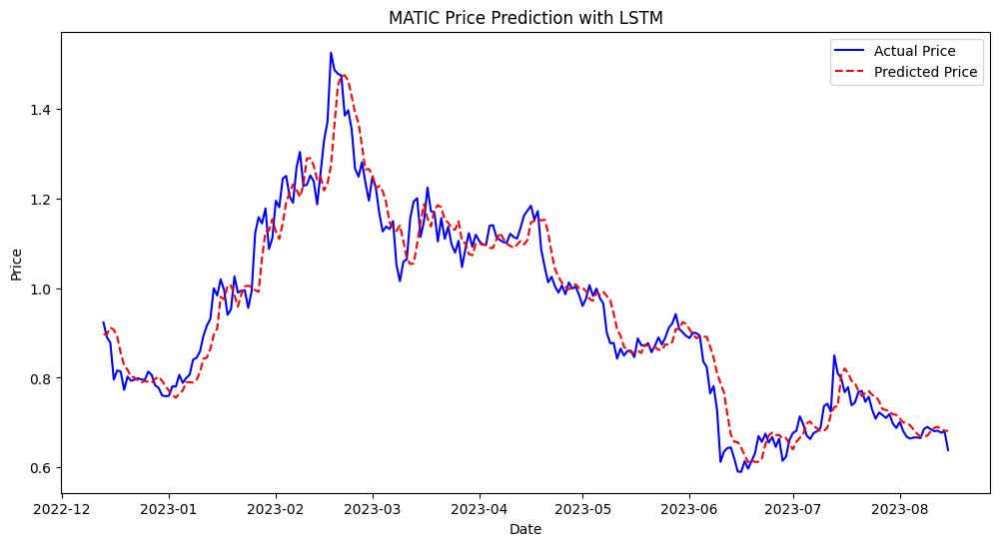

Metrics for LSTM Model on MATIC: {'MSE': 0.0003475664793580245, 'MAE': 0.01361363550114958, 'RMSE': 0.01864313491229478, 'R2': 0.9374010925495808}


In [60]:
# Define features and target
matic = get_crypto_data('MATIC')
features = matic.drop(["Close"], axis=1)
label = matic["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_matic_features, validation_label, test_matic_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)


# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_matic, y_train_matic = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_matic, y_validation_matic = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_matic = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_matic.shape[1], X_train_matic.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_matic.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_matic = model_lstm_matic.fit(X_train_matic, y_train_matic, epochs=100, batch_size=32, validation_data=(X_validation_matic, y_validation_matic), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_matic = model_lstm_matic.evaluate(X_validation_matic, y_validation_matic)

# Prediction
y_pred_lstm_matic = model_lstm_matic.predict(X_validation_matic).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_matic = mean_squared_error(y_validation_matic, y_pred_lstm_matic)
mae_lstm_matic = mean_absolute_error(y_validation_matic, y_pred_lstm_matic)
rmse_lstm_matic = np.sqrt(mse_lstm_matic)
r2_lstm_matic = r2_score(y_validation_matic, y_pred_lstm_matic)

# Store metrics for later comparison
metrics_lstm_matic = {
    "MSE": mse_lstm_matic,
    "MAE": mae_lstm_matic,
    "RMSE": rmse_lstm_matic,
    "R2": r2_lstm_matic
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_matic = scaler_label.inverse_transform(y_validation_matic.reshape(-1, 1))
y_pred_actual_lstm_matic = scaler_label.inverse_transform(y_pred_lstm_matic)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_matic.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_matic.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('MATIC Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on MATIC:", metrics_lstm_matic)

## GRU

Epoch 1/100
40/40 [==============================] - 1s 9ms/step - loss: 0.0079 - val_loss: 0.0015
Epoch 2/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0027 - val_loss: 5.2968e-04
Epoch 3/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0029 - val_loss: 0.0022
Epoch 4/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0026 - val_loss: 8.2782e-04
Epoch 5/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0023 - val_loss: 6.3027e-04
Epoch 6/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0023 - val_loss: 5.4767e-04
Epoch 7/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 4.4328e-04
Epoch 8/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 3.9091e-04
Epoch 9/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 3.7351e-04
Epoch 10/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0017 

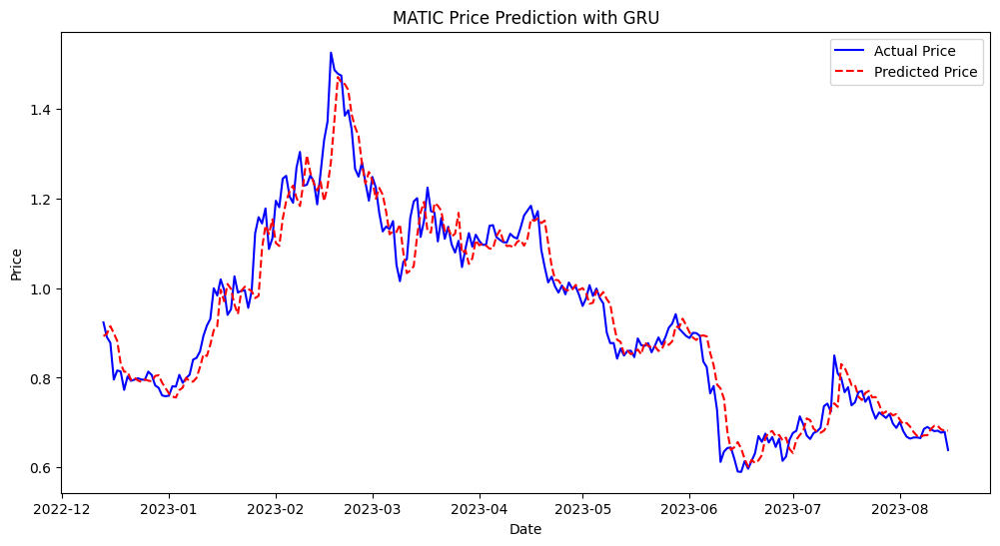

Metrics for GRU Model on MATIC: {'MSE': 0.00031494150842032364, 'MAE': 0.012519383147697787, 'RMSE': 0.01774659145921615, 'R2': 0.94327705486929}


In [61]:
# Build the GRU model
model_gru_matic = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_matic.shape[1], X_train_matic.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_matic.compile(optimizer='adam', loss='mse')
history_gru_matic = model_gru_matic.fit(X_train_matic, y_train_matic, epochs=100, batch_size=32, validation_data=(X_validation_matic, y_validation_matic), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_matic = model_gru_matic.predict(X_validation_matic).reshape(-1,1)
mse_gru_matic = mean_squared_error(y_validation_matic, y_pred_gru_matic)
mae_gru_matic = mean_absolute_error(y_validation_matic, y_pred_gru_matic)
rmse_gru_matic = np.sqrt(mse_gru_matic)
r2_gru_matic = r2_score(y_validation_matic, y_pred_gru_matic)

# Store metrics
metrics_gru_matic = {
    "MSE": mse_gru_matic,
    "MAE": mae_gru_matic,
    "RMSE": rmse_gru_matic,
    "R2": r2_gru_matic
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_matic = scaler_label.inverse_transform(y_validation_matic.reshape(-1, 1))
y_pred_actual_gru_matic = scaler_label.inverse_transform(y_pred_gru_matic)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_matic.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_matic.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('MATIC Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on MATIC:", metrics_gru_matic)

## Bi-LSTM

Epoch 1/100
40/40 [==============================] - 1s 12ms/step - loss: 0.0147 - val_loss: 0.0035
Epoch 2/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0039 - val_loss: 0.0016
Epoch 3/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0031 - val_loss: 0.0014
Epoch 4/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0027 - val_loss: 0.0016
Epoch 5/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0025 - val_loss: 9.2701e-04
Epoch 6/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0026 - val_loss: 0.0017
Epoch 7/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0024 - val_loss: 7.3801e-04
Epoch 8/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0022 - val_loss: 8.1212e-04
Epoch 9/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 0.0010
Epoch 10/100
40/40 [==============================] - 0s 5ms/step - loss: 0.0022 - val_loss: 6.8

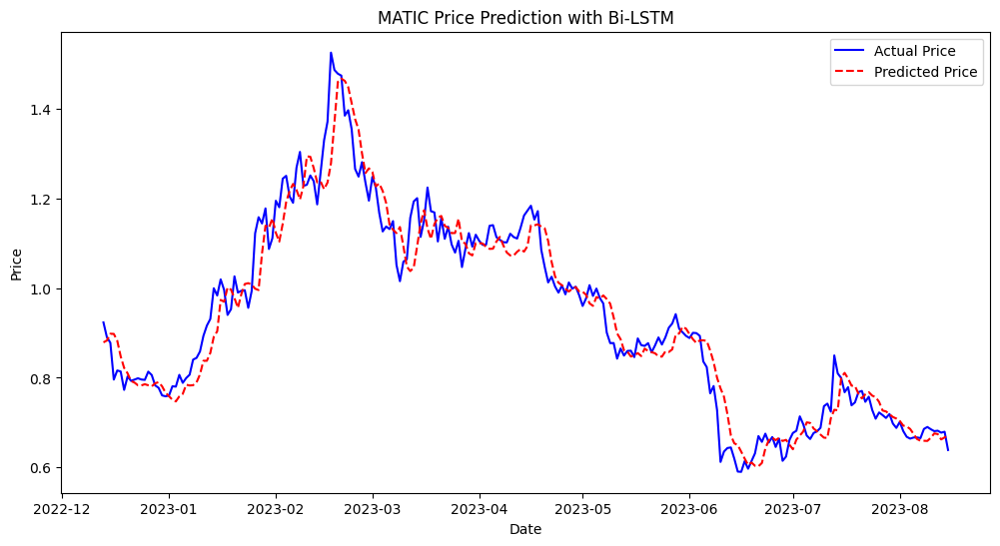

Metrics for Bi-LSTM Model on MATIC: {'MSE': 0.0003370520086819046, 'MAE': 0.013500144671415823, 'RMSE': 0.018358976242751245, 'R2': 0.9392948148036955}


In [62]:
# Build the Bi-LSTM model
model_bilstm_matic = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_matic.shape[1], X_train_matic.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_matic.compile(optimizer='adam', loss='mse')
history_bilstm_matic = model_bilstm_matic.fit(X_train_matic, y_train_matic, epochs=100, batch_size=32, validation_data=(X_validation_matic, y_validation_matic), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_matic = model_bilstm_matic.predict(X_validation_matic).reshape(-1, 1)
mse_bilstm_matic = mean_squared_error(y_validation_matic, y_pred_bilstm_matic)
mae_bilstm_matic = mean_absolute_error(y_validation_matic, y_pred_bilstm_matic)
rmse_bilstm_matic = np.sqrt(mse_bilstm_matic)
r2_bilstm_matic = r2_score(y_validation_matic, y_pred_bilstm_matic)

# Store metrics
metrics_bilstm_matic = {
    "MSE": mse_bilstm_matic,
    "MAE": mae_bilstm_matic,
    "RMSE": rmse_bilstm_matic,
    "R2": r2_bilstm_matic
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_matic = scaler_label.inverse_transform(y_validation_matic.reshape(-1, 1))
y_pred_actual_bilstm_matic = scaler_label.inverse_transform(y_pred_bilstm_matic)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_matic.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_matic.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('MATIC Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on MATIC:", metrics_bilstm_matic)

# 18. CRO

## LSTM

Epoch 1/100
43/43 [==============================] - 1s 12ms/step - loss: 0.0024 - val_loss: 1.9944e-04
Epoch 2/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 8.6986e-05
Epoch 3/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 1.0496e-04
Epoch 4/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 4.7837e-05
Epoch 5/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 7.9242e-05
Epoch 6/100
43/43 [==============================] - 0s 5ms/step - loss: 9.7684e-04 - val_loss: 2.3390e-04
Epoch 7/100
43/43 [==============================] - 0s 5ms/step - loss: 8.9810e-04 - val_loss: 9.5058e-05
Epoch 8/100
43/43 [==============================] - 0s 5ms/step - loss: 8.7274e-04 - val_loss: 6.2354e-05
Epoch 9/100
43/43 [==============================] - 0s 5ms/step - loss: 7.8840e-04 - val_loss: 4.8161e-05
Epoch 10/100
43/43 [==============================] - 0s

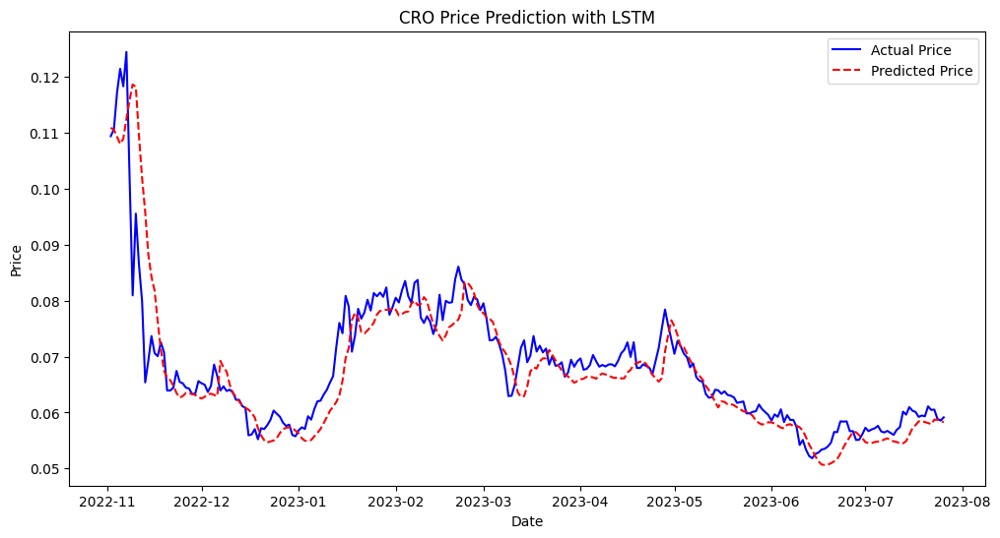

Metrics for LSTM Model on CRO: {'MSE': 3.8770477932641444e-05, 'MAE': 0.0038450118479752336, 'RMSE': 0.006226594408875645, 'R2': 0.7667833371710941}


In [63]:
# Define features and target
cro = get_crypto_data('CRO')
features = cro.drop(["Close"], axis=1)
label = cro["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_cro_features, validation_label, test_cro_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)


# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_cro, y_train_cro = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_cro, y_validation_cro = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_cro = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_cro.shape[1], X_train_cro.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_cro.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_cro = model_lstm_cro.fit(X_train_cro, y_train_cro, epochs=100, batch_size=32, validation_data=(X_validation_cro, y_validation_cro), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_cro = model_lstm_cro.evaluate(X_validation_cro, y_validation_cro)

# Prediction
y_pred_lstm_cro = model_lstm_cro.predict(X_validation_cro).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_cro = mean_squared_error(y_validation_cro, y_pred_lstm_cro)
mae_lstm_cro = mean_absolute_error(y_validation_cro, y_pred_lstm_cro)
rmse_lstm_cro = np.sqrt(mse_lstm_cro)
r2_lstm_cro = r2_score(y_validation_cro, y_pred_lstm_cro)

# Store metrics for later comparison
metrics_lstm_cro = {
    "MSE": mse_lstm_cro,
    "MAE": mae_lstm_cro,
    "RMSE": rmse_lstm_cro,
    "R2": r2_lstm_cro
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_cro = scaler_label.inverse_transform(y_validation_cro.reshape(-1, 1))
y_pred_actual_lstm_cro = scaler_label.inverse_transform(y_pred_lstm_cro)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_cro.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_cro.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('CRO Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on CRO:", metrics_lstm_cro)

## GRU

Epoch 1/100
43/43 [==============================] - 1s 9ms/step - loss: 0.0095 - val_loss: 6.1560e-05
Epoch 2/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 7.5610e-05
Epoch 3/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 2.8908e-04
Epoch 4/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 5.3431e-05
Epoch 5/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 6.4429e-05
Epoch 6/100
43/43 [==============================] - 0s 5ms/step - loss: 9.6659e-04 - val_loss: 6.0774e-05
Epoch 7/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 2.6659e-04
Epoch 8/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 4.4247e-05
Epoch 9/100
43/43 [==============================] - 0s 5ms/step - loss: 8.0639e-04 - val_loss: 8.8160e-05
Epoch 10/100
43/43 [==============================] - 0s 5ms/step

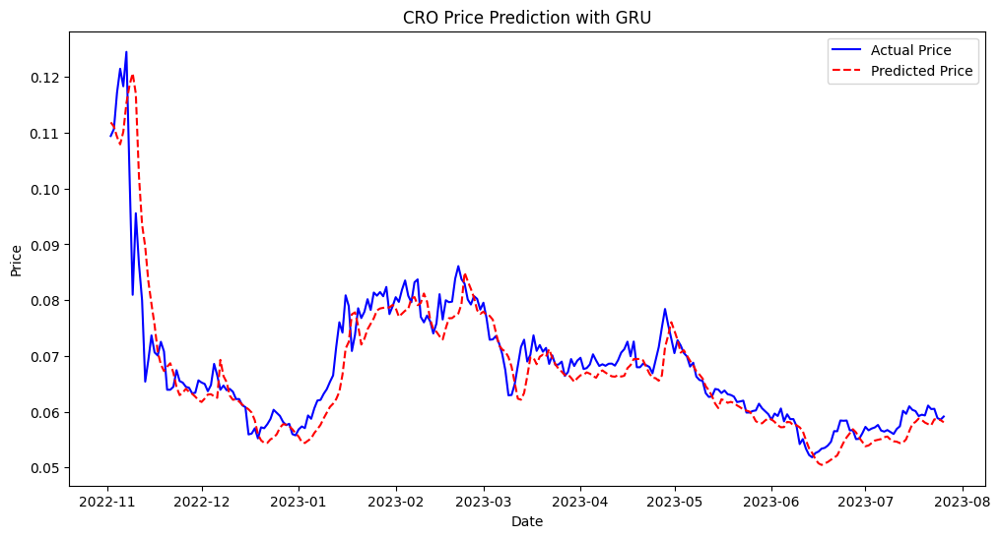

Metrics for GRU Model on CRO: {'MSE': 3.189868221218292e-05, 'MAE': 0.003553681418038208, 'RMSE': 0.005647891837861533, 'R2': 0.8081193575408101}


In [64]:
# Build the GRU model
model_gru_cro = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_cro.shape[1], X_train_cro.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_cro.compile(optimizer='adam', loss='mse')
history_gru_cro = model_gru_cro.fit(X_train_cro, y_train_cro, epochs=100, batch_size=32, validation_data=(X_validation_cro, y_validation_cro), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_cro = model_gru_cro.predict(X_validation_cro).reshape(-1,1)
mse_gru_cro = mean_squared_error(y_validation_cro, y_pred_gru_cro)
mae_gru_cro = mean_absolute_error(y_validation_cro, y_pred_gru_cro)
rmse_gru_cro = np.sqrt(mse_gru_cro)
r2_gru_cro = r2_score(y_validation_cro, y_pred_gru_cro)

# Store metrics
metrics_gru_cro = {
    "MSE": mse_gru_cro,
    "MAE": mae_gru_cro,
    "RMSE": rmse_gru_cro,
    "R2": r2_gru_cro
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_cro = scaler_label.inverse_transform(y_validation_cro.reshape(-1, 1))
y_pred_actual_gru_cro = scaler_label.inverse_transform(y_pred_gru_cro)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_cro.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_cro.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('CRO Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on CRO:", metrics_gru_cro)

## Bi-LSTM

Epoch 1/100
43/43 [==============================] - 2s 32ms/step - loss: 0.0070 - val_loss: 1.3708e-04
Epoch 2/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 1.8518e-04
Epoch 3/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 2.2120e-04
Epoch 4/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 1.0906e-04
Epoch 5/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 9.1310e-05
Epoch 6/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 1.9318e-04
Epoch 7/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 2.2216e-04
Epoch 8/100
43/43 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 9.7134e-05
Epoch 9/100
43/43 [==============================] - 0s 5ms/step - loss: 9.9349e-04 - val_loss: 3.3161e-04
Epoch 10/100
43/43 [==============================] - 0s 5ms/step - 

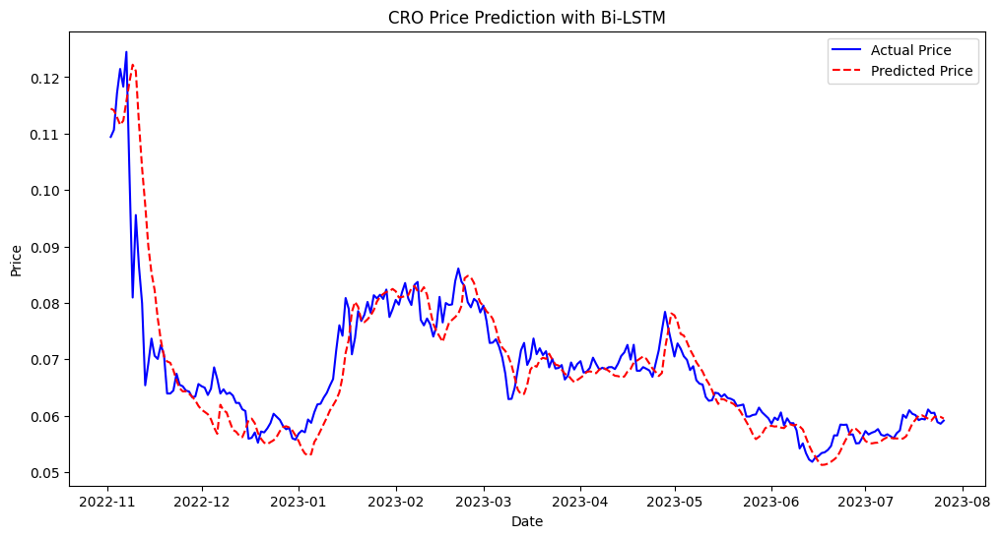

Metrics for Bi-LSTM Model on CRO: {'MSE': 4.2477250555291934e-05, 'MAE': 0.003920015689703302, 'RMSE': 0.006517457368889492, 'R2': 0.7444859297875168}


In [65]:
# Build the Bi-LSTM model
model_bilstm_cro = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_cro.shape[1], X_train_cro.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_cro.compile(optimizer='adam', loss='mse')
history_bilstm_cro = model_bilstm_cro.fit(X_train_cro, y_train_cro, epochs=100, batch_size=32, validation_data=(X_validation_cro, y_validation_cro), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_cro = model_bilstm_cro.predict(X_validation_cro).reshape(-1, 1)
mse_bilstm_cro = mean_squared_error(y_validation_cro, y_pred_bilstm_cro)
mae_bilstm_cro = mean_absolute_error(y_validation_cro, y_pred_bilstm_cro)
rmse_bilstm_cro = np.sqrt(mse_bilstm_cro)
r2_bilstm_cro = r2_score(y_validation_cro, y_pred_bilstm_cro)

# Store metrics
metrics_bilstm_cro = {
    "MSE": mse_bilstm_cro,
    "MAE": mae_bilstm_cro,
    "RMSE": rmse_bilstm_cro,
    "R2": r2_bilstm_cro
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_cro = scaler_label.inverse_transform(y_validation_cro.reshape(-1, 1))
y_pred_actual_bilstm_cro = scaler_label.inverse_transform(y_pred_bilstm_cro)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_cro.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_cro.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('CRO Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on CRO:", metrics_bilstm_cro)

# 19. RNDR

## LSTM

Epoch 1/200
31/31 [==============================] - 1s 10ms/step - loss: 0.0109 - val_loss: 0.0024
Epoch 2/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0036 - val_loss: 0.0035
Epoch 3/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0029 - val_loss: 0.0019
Epoch 4/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0025 - val_loss: 0.0011
Epoch 5/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 0.0013
Epoch 6/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 0.0012
Epoch 7/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 0.0021
Epoch 8/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 9.3495e-04
Epoch 9/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 7.5317e-04
Epoch 10/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 0.0010


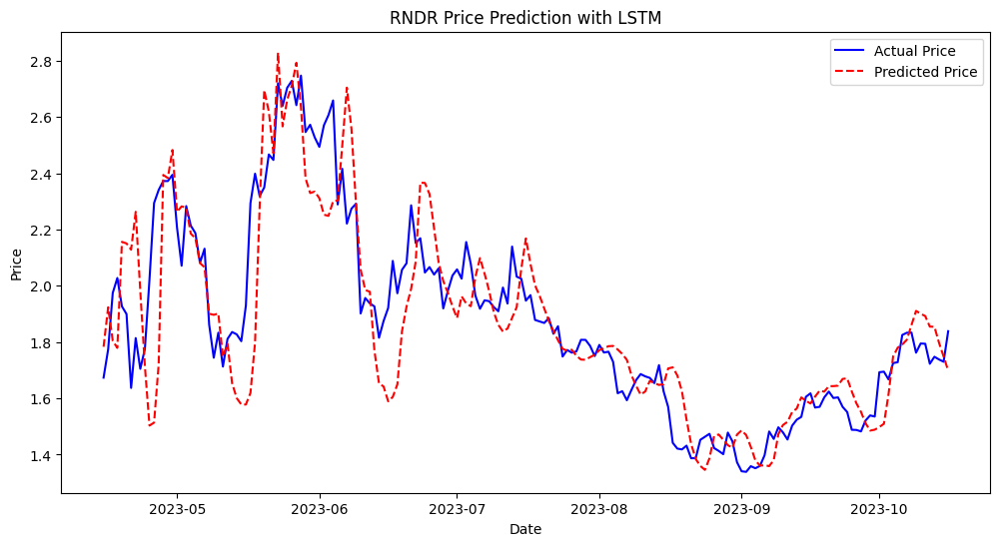

Metrics for LSTM Model on RNDR: {'MSE': 0.0005669307593466888, 'MAE': 0.016266265390332383, 'RMSE': 0.023810307838133652, 'R2': 0.7078048146760108}


In [66]:
# Define features and target
rndr = get_crypto_data('RNDR')
features = rndr.drop(["Close"], axis=1)
label = rndr["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_rndr_features, validation_label, test_rndr_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)


# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_rndr, y_train_rndr = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_rndr, y_validation_rndr = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_rndr = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_rndr.shape[1], X_train_rndr.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_rndr.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_rndr = model_lstm_rndr.fit(X_train_rndr, y_train_rndr, epochs=200, batch_size=32, validation_data=(X_validation_rndr, y_validation_rndr), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_rndr = model_lstm_rndr.evaluate(X_validation_rndr, y_validation_rndr)

# Prediction
y_pred_lstm_rndr = model_lstm_rndr.predict(X_validation_rndr).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_rndr = mean_squared_error(y_validation_rndr, y_pred_lstm_rndr)
mae_lstm_rndr = mean_absolute_error(y_validation_rndr, y_pred_lstm_rndr)
rmse_lstm_rndr = np.sqrt(mse_lstm_rndr)
r2_lstm_rndr = r2_score(y_validation_rndr, y_pred_lstm_rndr)

# Store metrics for later comparison
metrics_lstm_rndr = {
    "MSE": mse_lstm_rndr,
    "MAE": mae_lstm_rndr,
    "RMSE": rmse_lstm_rndr,
    "R2": r2_lstm_rndr
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_rndr = scaler_label.inverse_transform(y_validation_rndr.reshape(-1, 1))
y_pred_actual_lstm_rndr = scaler_label.inverse_transform(y_pred_lstm_rndr)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_rndr.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_rndr.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('RNDR Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on RNDR:", metrics_lstm_rndr)

## GRU

Epoch 1/200
31/31 [==============================] - 1s 10ms/step - loss: 0.0038 - val_loss: 0.0049
Epoch 2/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 0.0024
Epoch 3/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 0.0028
Epoch 4/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0022 - val_loss: 7.9873e-04
Epoch 5/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 0.0013
Epoch 6/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 5.1083e-04
Epoch 7/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 5.1585e-04
Epoch 8/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 5.4144e-04
Epoch 9/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 3.8390e-04
Epoch 10/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0012 - val_l

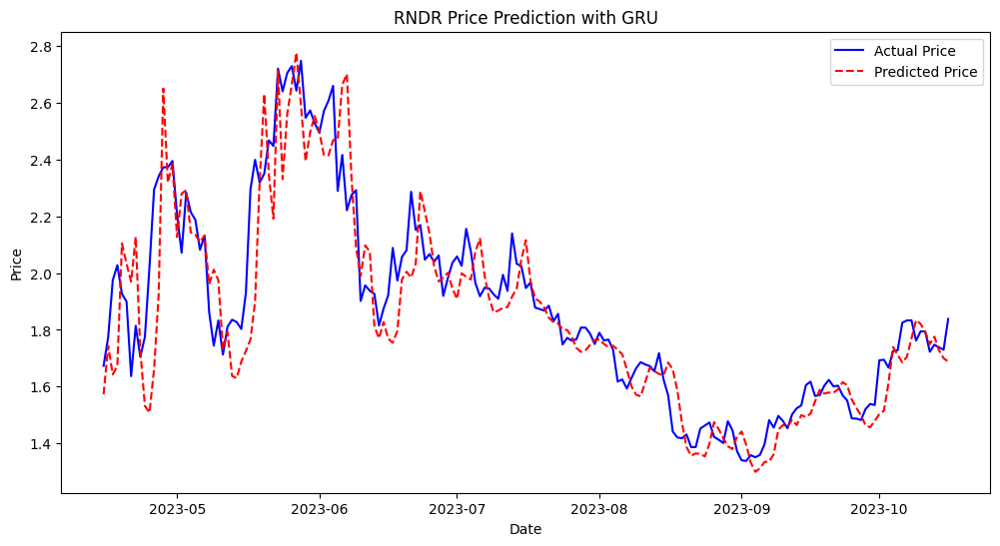

Metrics for GRU Model on RNDR: {'MSE': 0.0003838975333806812, 'MAE': 0.013532694748239362, 'RMSE': 0.01959330327894409, 'R2': 0.8021398397207188}


In [67]:
# Build the GRU model
model_gru_rndr = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_rndr.shape[1], X_train_rndr.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_rndr.compile(optimizer='adam', loss='mse')
history_gru_rndr = model_gru_rndr.fit(X_train_rndr, y_train_rndr, epochs=200, batch_size=32, validation_data=(X_validation_rndr, y_validation_rndr), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_rndr = model_gru_rndr.predict(X_validation_rndr).reshape(-1,1)
mse_gru_rndr = mean_squared_error(y_validation_rndr, y_pred_gru_rndr)
mae_gru_rndr = mean_absolute_error(y_validation_rndr, y_pred_gru_rndr)
rmse_gru_rndr = np.sqrt(mse_gru_rndr)
r2_gru_rndr = r2_score(y_validation_rndr, y_pred_gru_rndr)

# Store metrics
metrics_gru_rndr = {
    "MSE": mse_gru_rndr,
    "MAE": mae_gru_rndr,
    "RMSE": rmse_gru_rndr,
    "R2": r2_gru_rndr
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_rndr = scaler_label.inverse_transform(y_validation_rndr.reshape(-1, 1))
y_pred_actual_gru_rndr = scaler_label.inverse_transform(y_pred_gru_rndr)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_rndr.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_rndr.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('RNDR Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on RNDR:", metrics_gru_rndr)

## Bi-LSTM

Epoch 1/200
31/31 [==============================] - 1s 14ms/step - loss: 0.0105 - val_loss: 0.0058
Epoch 2/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0032 - val_loss: 0.0015
Epoch 3/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0028 - val_loss: 6.0112e-04
Epoch 4/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0022 - val_loss: 7.3630e-04
Epoch 5/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 0.0012
Epoch 6/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 6.8334e-04
Epoch 7/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 0.0013
Epoch 8/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 8.7157e-04
Epoch 9/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 7.2288e-04
Epoch 10/200
31/31 [==============================] - 0s 5ms/step - loss: 0.0015 - val_l

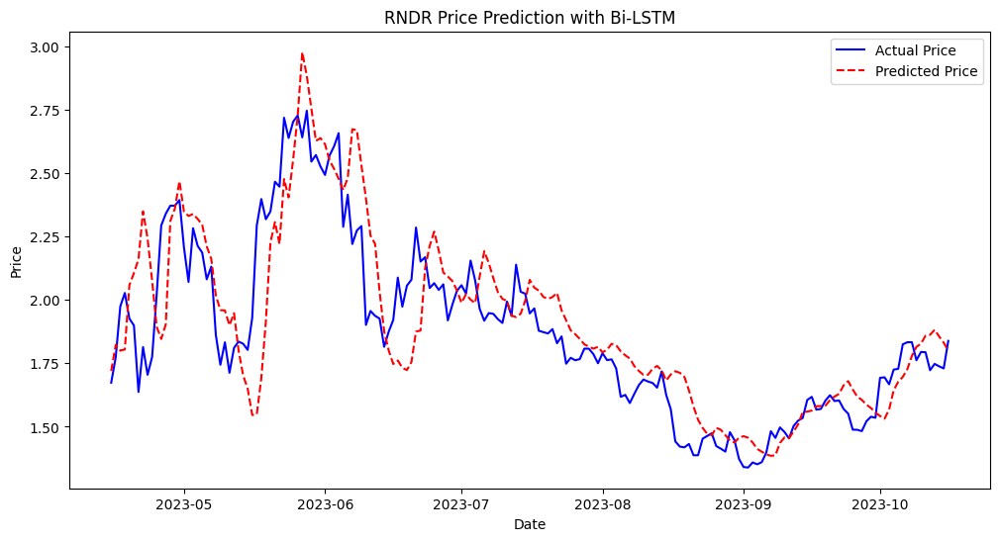

Metrics for Bi-LSTM Model on RNDR: {'MSE': 0.0006011179757489623, 'MAE': 0.01788356650339009, 'RMSE': 0.02451770739178038, 'R2': 0.690184779305404}


In [68]:
# Build the Bi-LSTM model
model_bilstm_rndr = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_rndr.shape[1], X_train_rndr.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_rndr.compile(optimizer='adam', loss='mse')
history_bilstm_rndr = model_bilstm_rndr.fit(X_train_rndr, y_train_rndr, epochs=200, batch_size=32, validation_data=(X_validation_rndr, y_validation_rndr), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_rndr = model_bilstm_rndr.predict(X_validation_rndr).reshape(-1, 1)
mse_bilstm_rndr = mean_squared_error(y_validation_rndr, y_pred_bilstm_rndr)
mae_bilstm_rndr = mean_absolute_error(y_validation_rndr, y_pred_bilstm_rndr)
rmse_bilstm_rndr = np.sqrt(mse_bilstm_rndr)
r2_bilstm_rndr = r2_score(y_validation_rndr, y_pred_bilstm_rndr)

# Store metrics
metrics_bilstm_rndr = {
    "MSE": mse_bilstm_rndr,
    "MAE": mae_bilstm_rndr,
    "RMSE": rmse_bilstm_rndr,
    "R2": r2_bilstm_rndr
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_rndr = scaler_label.inverse_transform(y_validation_rndr.reshape(-1, 1))
y_pred_actual_bilstm_rndr = scaler_label.inverse_transform(y_pred_bilstm_rndr)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_rndr.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_rndr.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('RNDR Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on RNDR:", metrics_bilstm_rndr)

# 20. XTZ

## LSTM

Epoch 1/100
47/47 [==============================] - 1s 8ms/step - loss: 0.0042 - val_loss: 3.3069e-04
Epoch 2/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0029 - val_loss: 2.6830e-04
Epoch 3/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0024 - val_loss: 4.5635e-04
Epoch 4/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0025 - val_loss: 2.0912e-04
Epoch 5/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0023 - val_loss: 2.9195e-04
Epoch 6/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0024 - val_loss: 4.7839e-04
Epoch 7/100
47/47 [==============================] - 0s 6ms/step - loss: 0.0020 - val_loss: 3.1707e-04
Epoch 8/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0022 - val_loss: 2.8457e-04
Epoch 9/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 4.8293e-04
Epoch 10/100
47/47 [==============================] - 0s 5ms/step - loss:

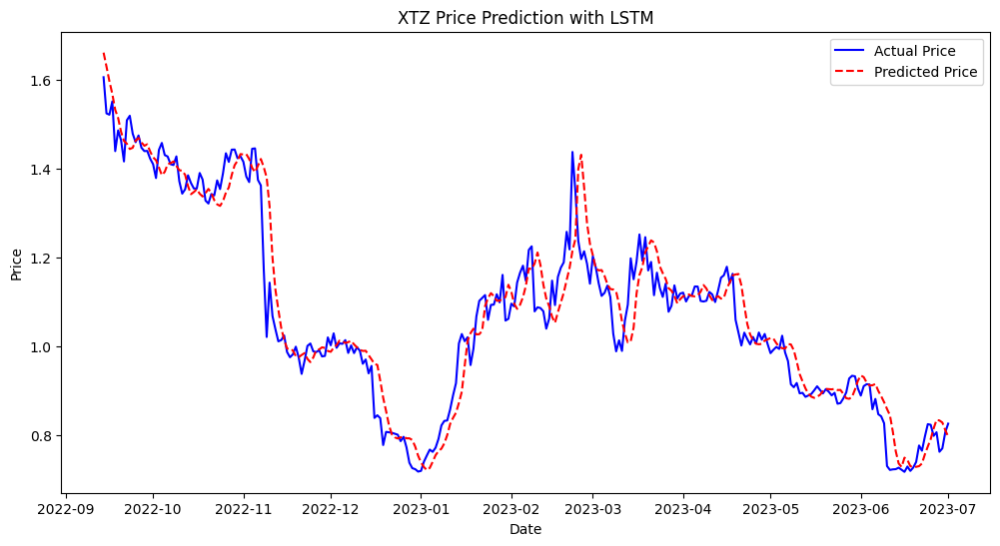

Metrics for LSTM Model on XTZ: {'MSE': 5.479520467965126e-05, 'MAE': 0.0051799067228621805, 'RMSE': 0.007402378312383883, 'R2': 0.9178718428016732}


In [69]:
# Define features and target
xtz = get_crypto_data('XTZ')
features = xtz.drop(["Close"], axis=1)
label = xtz["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_xtz_features, validation_label, test_xtz_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)


# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_xtz, y_train_xtz = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_xtz, y_validation_xtz = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_xtz = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_xtz.shape[1], X_train_xtz.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_xtz.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_xtz = model_lstm_xtz.fit(X_train_xtz, y_train_xtz, epochs=100, batch_size=32, validation_data=(X_validation_xtz, y_validation_xtz), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_xtz = model_lstm_xtz.evaluate(X_validation_xtz, y_validation_xtz)

# Prediction
y_pred_lstm_xtz = model_lstm_xtz.predict(X_validation_xtz).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_xtz = mean_squared_error(y_validation_xtz, y_pred_lstm_xtz)
mae_lstm_xtz = mean_absolute_error(y_validation_xtz, y_pred_lstm_xtz)
rmse_lstm_xtz = np.sqrt(mse_lstm_xtz)
r2_lstm_xtz = r2_score(y_validation_xtz, y_pred_lstm_xtz)

# Store metrics for later comparison
metrics_lstm_xtz = {
    "MSE": mse_lstm_xtz,
    "MAE": mae_lstm_xtz,
    "RMSE": rmse_lstm_xtz,
    "R2": r2_lstm_xtz
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_xtz = scaler_label.inverse_transform(y_validation_xtz.reshape(-1, 1))
y_pred_actual_lstm_xtz = scaler_label.inverse_transform(y_pred_lstm_xtz)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_xtz.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_xtz.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('XTZ Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on XTZ:", metrics_lstm_xtz)

## GRU

Epoch 1/100
47/47 [==============================] - 1s 9ms/step - loss: 0.0102 - val_loss: 4.1051e-04
Epoch 2/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0028 - val_loss: 8.6458e-05
Epoch 3/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0025 - val_loss: 7.0705e-05
Epoch 4/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0025 - val_loss: 1.6648e-04
Epoch 5/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0023 - val_loss: 1.1869e-04
Epoch 6/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0022 - val_loss: 6.6440e-05
Epoch 7/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 1.4508e-04
Epoch 8/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 3.3000e-04
Epoch 9/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 3.0033e-04
Epoch 10/100
47/47 [==============================] - 0s 5ms/step - loss:

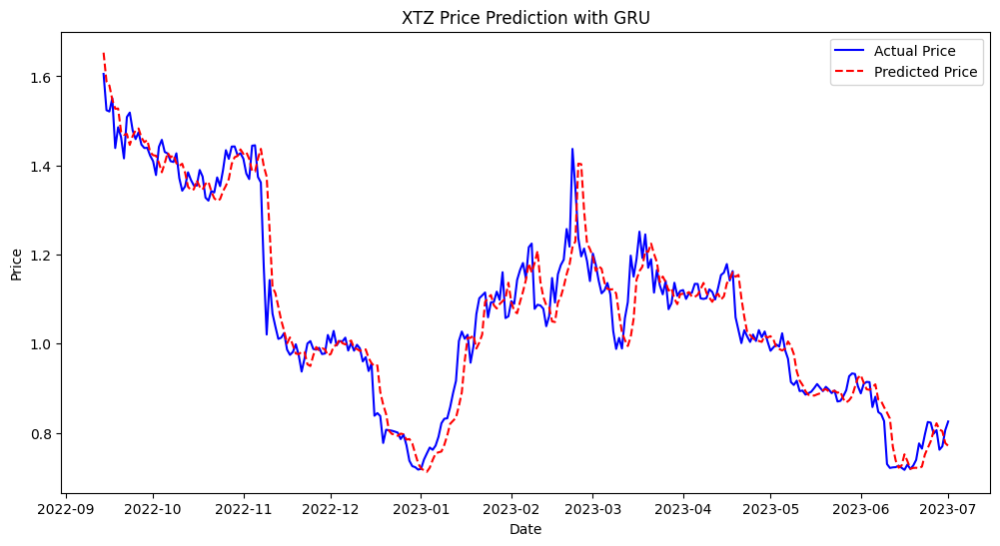

Metrics for GRU Model on XTZ: {'MSE': 4.667222733275657e-05, 'MAE': 0.004713224815814606, 'RMSE': 0.006831707497599452, 'R2': 0.930046724971827}


In [70]:
# Build the GRU model
model_gru_xtz = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_xtz.shape[1], X_train_xtz.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_xtz.compile(optimizer='adam', loss='mse')
history_gru_xtz = model_gru_xtz.fit(X_train_xtz, y_train_xtz, epochs=100, batch_size=32, validation_data=(X_validation_xtz, y_validation_xtz), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_xtz = model_gru_xtz.predict(X_validation_xtz).reshape(-1,1)
mse_gru_xtz = mean_squared_error(y_validation_xtz, y_pred_gru_xtz)
mae_gru_xtz = mean_absolute_error(y_validation_xtz, y_pred_gru_xtz)
rmse_gru_xtz = np.sqrt(mse_gru_xtz)
r2_gru_xtz = r2_score(y_validation_xtz, y_pred_gru_xtz)

# Store metrics
metrics_gru_xtz = {
    "MSE": mse_gru_xtz,
    "MAE": mae_gru_xtz,
    "RMSE": rmse_gru_xtz,
    "R2": r2_gru_xtz
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_xtz = scaler_label.inverse_transform(y_validation_xtz.reshape(-1, 1))
y_pred_actual_gru_xtz = scaler_label.inverse_transform(y_pred_gru_xtz)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_xtz.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_xtz.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('XTZ Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on XTZ:", metrics_gru_xtz)

## Bi-LSTM

Epoch 1/100
47/47 [==============================] - 1s 11ms/step - loss: 0.0101 - val_loss: 1.8073e-04
Epoch 2/100
47/47 [==============================] - 0s 6ms/step - loss: 0.0040 - val_loss: 1.3971e-04
Epoch 3/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0034 - val_loss: 3.2965e-04
Epoch 4/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0027 - val_loss: 5.0852e-04
Epoch 5/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0024 - val_loss: 8.3803e-05
Epoch 6/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0027 - val_loss: 1.0413e-04
Epoch 7/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0023 - val_loss: 2.6770e-04
Epoch 8/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 4.1256e-04
Epoch 9/100
47/47 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 2.7997e-04
Epoch 10/100
47/47 [==============================] - 0s 5ms/step - loss

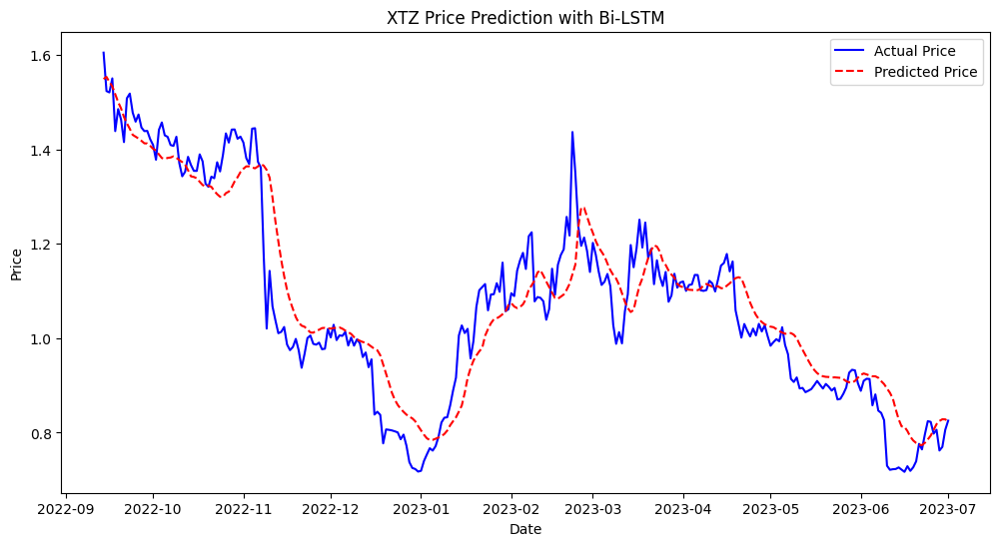

Metrics for Bi-LSTM Model on XTZ: {'MSE': 8.380318956381847e-05, 'MAE': 0.006917975555846133, 'RMSE': 0.009154408203910206, 'R2': 0.8743940903869936}


In [71]:
# Build the Bi-LSTM model
model_bilstm_xtz = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_xtz.shape[1], X_train_xtz.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_xtz.compile(optimizer='adam', loss='mse')
history_bilstm_xtz = model_bilstm_xtz.fit(X_train_xtz, y_train_xtz, epochs=100, batch_size=32, validation_data=(X_validation_xtz, y_validation_xtz), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_xtz = model_bilstm_xtz.predict(X_validation_xtz).reshape(-1, 1)
mse_bilstm_xtz = mean_squared_error(y_validation_xtz, y_pred_bilstm_xtz)
mae_bilstm_xtz = mean_absolute_error(y_validation_xtz, y_pred_bilstm_xtz)
rmse_bilstm_xtz = np.sqrt(mse_bilstm_xtz)
r2_bilstm_xtz = r2_score(y_validation_xtz, y_pred_bilstm_xtz)

# Store metrics
metrics_bilstm_xtz = {
    "MSE": mse_bilstm_xtz,
    "MAE": mae_bilstm_xtz,
    "RMSE": rmse_bilstm_xtz,
    "R2": r2_bilstm_xtz
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_xtz = scaler_label.inverse_transform(y_validation_xtz.reshape(-1, 1))
y_pred_actual_bilstm_xtz = scaler_label.inverse_transform(y_pred_bilstm_xtz)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_xtz.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_xtz.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('XTZ Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on XTZ:", metrics_bilstm_xtz)

# 21. BAT

## LSTM

Epoch 1/100
55/55 [==============================] - 1s 9ms/step - loss: 0.0151 - val_loss: 3.8112e-04
Epoch 2/100
55/55 [==============================] - 0s 5ms/step - loss: 0.0026 - val_loss: 2.3163e-04
Epoch 3/100
55/55 [==============================] - 0s 5ms/step - loss: 0.0024 - val_loss: 2.2944e-04
Epoch 4/100
55/55 [==============================] - 0s 5ms/step - loss: 0.0022 - val_loss: 2.1177e-04
Epoch 5/100
55/55 [==============================] - 0s 5ms/step - loss: 0.0024 - val_loss: 2.3754e-04
Epoch 6/100
55/55 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 1.9774e-04
Epoch 7/100
55/55 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 2.0293e-04
Epoch 8/100
55/55 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 1.9561e-04
Epoch 9/100
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 2.7204e-04
Epoch 10/100
55/55 [==============================] - 0s 5ms/step - loss:

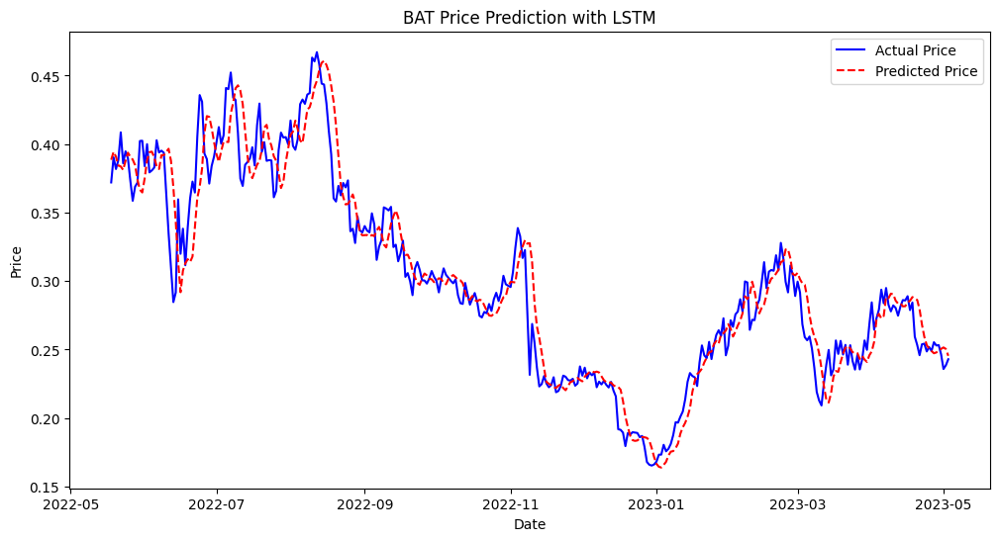

Metrics for LSTM Model on BAT: {'MSE': 0.00015622949583498526, 'MAE': 0.008887266595385064, 'RMSE': 0.012499179806490715, 'R2': 0.912673595226952}


In [72]:
# Define features and target
bat = get_crypto_data('BAT')
features = bat.drop(["Close"], axis=1)
label = bat["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_bat_features, validation_label, test_bat_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)


# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_bat, y_train_bat = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_bat, y_validation_bat = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_bat = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_bat.shape[1], X_train_bat.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_bat.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_bat = model_lstm_bat.fit(X_train_bat, y_train_bat, epochs=100, batch_size=32, validation_data=(X_validation_bat, y_validation_bat), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_bat = model_lstm_bat.evaluate(X_validation_bat, y_validation_bat)

# prediction
y_pred_lstm_bat = model_lstm_bat.predict(X_validation_bat).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_bat = mean_squared_error(y_validation_bat, y_pred_lstm_bat)
mae_lstm_bat = mean_absolute_error(y_validation_bat, y_pred_lstm_bat)
rmse_lstm_bat = np.sqrt(mse_lstm_bat)
r2_lstm_bat = r2_score(y_validation_bat, y_pred_lstm_bat)

# Store metrics for later comparison
metrics_lstm_bat = {
    "MSE": mse_lstm_bat,
    "MAE": mae_lstm_bat,
    "RMSE": rmse_lstm_bat,
    "R2": r2_lstm_bat
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_bat = scaler_label.inverse_transform(y_validation_bat.reshape(-1, 1))
y_pred_actual_lstm_bat = scaler_label.inverse_transform(y_pred_lstm_bat)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_bat.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_bat.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('BAT Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on BAT:", metrics_lstm_bat)

## GRU

Epoch 1/100
55/55 [==============================] - 1s 8ms/step - loss: 0.0138 - val_loss: 3.4840e-04
Epoch 2/100
55/55 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 1.7634e-04
Epoch 3/100
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 4.0960e-04
Epoch 4/100
55/55 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 2.1718e-04
Epoch 5/100
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 1.7739e-04
Epoch 6/100
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 1.8618e-04
Epoch 7/100
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 1.9494e-04
Epoch 8/100
55/55 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 1.6567e-04
Epoch 9/100
55/55 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 1.6771e-04
Epoch 10/100
55/55 [==============================] - 0s 5ms/step - loss:

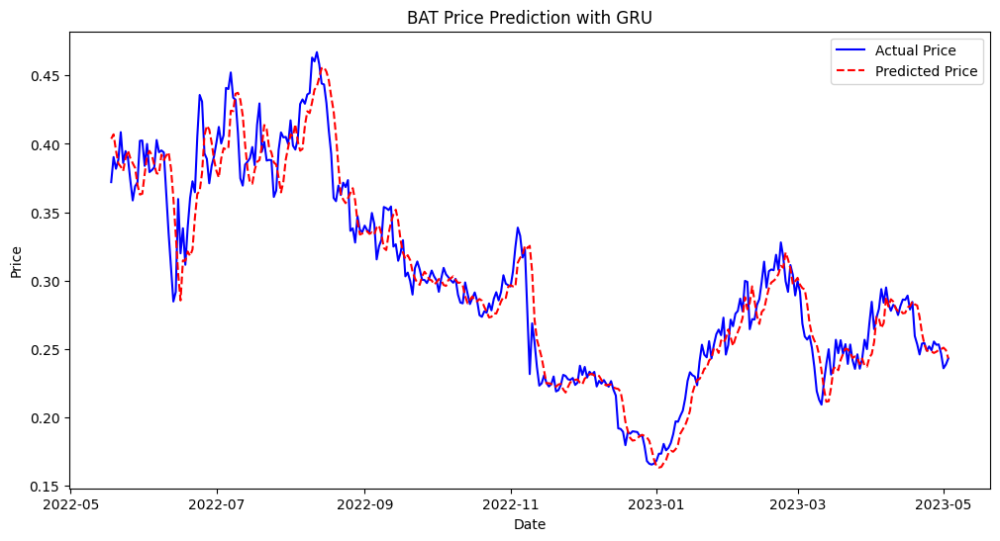

Metrics for GRU Model on BAT: {'MSE': 0.00014606293549537398, 'MAE': 0.00872405197937754, 'RMSE': 0.012085649982329208, 'R2': 0.9183563195974144}


In [73]:
# Build the GRU model
model_gru_bat = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_bat.shape[1], X_train_bat.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_bat.compile(optimizer='adam', loss='mse')
history_gru_bat = model_gru_bat.fit(X_train_bat, y_train_bat, epochs=100, batch_size=32, validation_data=(X_validation_bat, y_validation_bat), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_bat = model_gru_bat.predict(X_validation_bat).reshape(-1,1)
mse_gru_bat = mean_squared_error(y_validation_bat, y_pred_gru_bat)
mae_gru_bat = mean_absolute_error(y_validation_bat, y_pred_gru_bat)
rmse_gru_bat = np.sqrt(mse_gru_bat)
r2_gru_bat = r2_score(y_validation_bat, y_pred_gru_bat)

# Store metrics
metrics_gru_bat = {
    "MSE": mse_gru_bat,
    "MAE": mae_gru_bat,
    "RMSE": rmse_gru_bat,
    "R2": r2_gru_bat
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_bat = scaler_label.inverse_transform(y_validation_bat.reshape(-1, 1))
y_pred_actual_gru_bat = scaler_label.inverse_transform(y_pred_gru_bat)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_bat.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_bat.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('BAT Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on BAT:", metrics_gru_bat)

## Bi-LSTM

Epoch 1/100
55/55 [==============================] - 2s 14ms/step - loss: 0.0060 - val_loss: 6.1893e-04
Epoch 2/100
55/55 [==============================] - 0s 6ms/step - loss: 0.0027 - val_loss: 4.7352e-04
Epoch 3/100
55/55 [==============================] - 0s 6ms/step - loss: 0.0025 - val_loss: 2.6322e-04
Epoch 4/100
55/55 [==============================] - 0s 6ms/step - loss: 0.0019 - val_loss: 4.2286e-04
Epoch 5/100
55/55 [==============================] - 0s 6ms/step - loss: 0.0020 - val_loss: 1.9672e-04
Epoch 6/100
55/55 [==============================] - 0s 6ms/step - loss: 0.0018 - val_loss: 2.8124e-04
Epoch 7/100
55/55 [==============================] - 0s 6ms/step - loss: 0.0017 - val_loss: 1.9518e-04
Epoch 8/100
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - val_loss: 2.6848e-04
Epoch 9/100
55/55 [==============================] - 0s 6ms/step - loss: 0.0015 - val_loss: 6.2632e-04
Epoch 10/100
55/55 [==============================] - 0s 6ms/step - loss

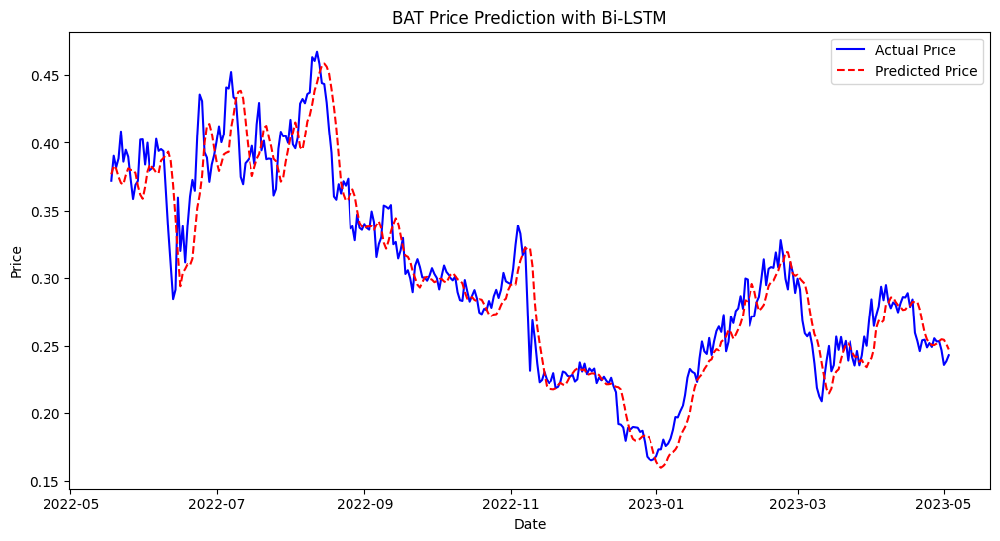

Metrics for Bi-LSTM Model on BAT: {'MSE': 0.00016680752992094105, 'MAE': 0.009427421325207398, 'RMSE': 0.012915398945481361, 'R2': 0.9067608725278469}


In [74]:
# Build the Bi-LSTM model
model_bilstm_bat = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_bat.shape[1], X_train_bat.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_bat.compile(optimizer='adam', loss='mse')
history_bilstm_bat = model_bilstm_bat.fit(X_train_bat, y_train_bat, epochs=100, batch_size=32, validation_data=(X_validation_bat, y_validation_bat), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_bat = model_bilstm_bat.predict(X_validation_bat).reshape(-1, 1)
mse_bilstm_bat = mean_squared_error(y_validation_bat, y_pred_bilstm_bat)
mae_bilstm_bat = mean_absolute_error(y_validation_bat, y_pred_bilstm_bat)
rmse_bilstm_bat = np.sqrt(mse_bilstm_bat)
r2_bilstm_bat = r2_score(y_validation_bat, y_pred_bilstm_bat)

# Store metrics
metrics_bilstm_bat = {
    "MSE": mse_bilstm_bat,
    "MAE": mae_bilstm_bat,
    "RMSE": rmse_bilstm_bat,
    "R2": r2_bilstm_bat
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_bat = scaler_label.inverse_transform(y_validation_bat.reshape(-1, 1))
y_pred_actual_bilstm_bat = scaler_label.inverse_transform(y_pred_bilstm_bat)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_bat.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_bat.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('BAT Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on BAT:", metrics_bilstm_bat)

# 22. SC

## LSTM

Epoch 1/100
69/69 [==============================] - 1s 8ms/step - loss: 0.0019 - val_loss: 2.7212e-04
Epoch 2/100
69/69 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 1.0496e-04
Epoch 3/100
69/69 [==============================] - 0s 5ms/step - loss: 9.9219e-04 - val_loss: 9.8982e-05
Epoch 4/100
69/69 [==============================] - 0s 5ms/step - loss: 9.7717e-04 - val_loss: 1.8117e-04
Epoch 5/100
69/69 [==============================] - 0s 5ms/step - loss: 9.1068e-04 - val_loss: 1.2362e-04
Epoch 6/100
69/69 [==============================] - 0s 5ms/step - loss: 9.0993e-04 - val_loss: 1.3773e-04
Epoch 7/100
69/69 [==============================] - 0s 5ms/step - loss: 8.3427e-04 - val_loss: 1.0357e-04
Epoch 8/100
69/69 [==============================] - 0s 5ms/step - loss: 7.7806e-04 - val_loss: 1.4000e-04
Epoch 9/100
69/69 [==============================] - 0s 5ms/step - loss: 8.6918e-04 - val_loss: 1.6820e-04
Epoch 10/100
69/69 [=========================

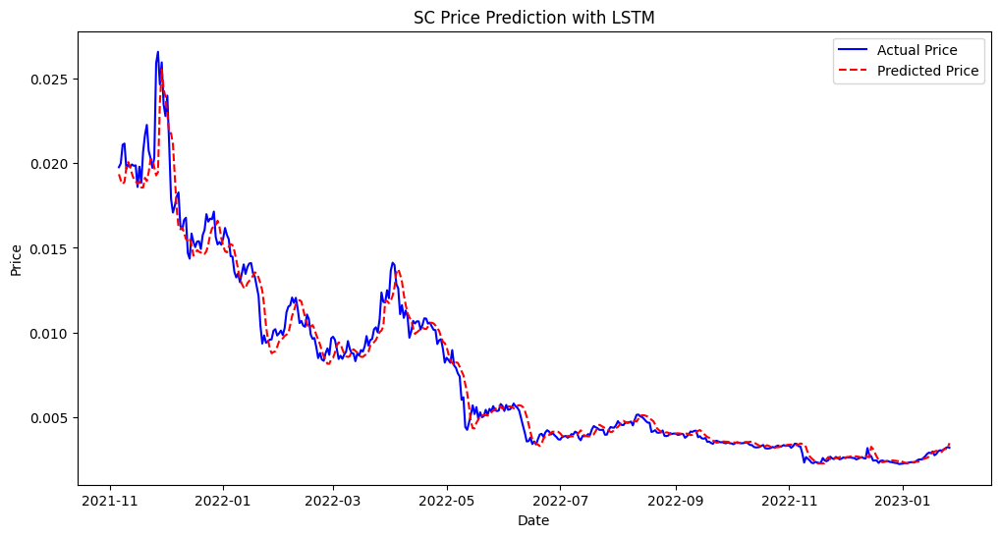

Metrics for LSTM Model on SC: {'MSE': 8.644981915943611e-05, 'MAE': 0.005262371061451733, 'RMSE': 0.009297839488797175, 'R2': 0.97469828730774}


In [75]:
# Define features and target
sc = get_crypto_data('SC')
features = sc.drop(["Close"], axis=1)
label = sc["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_sc_features, validation_label, test_sc_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)


# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features)
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_sc, y_train_sc = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_sc, y_validation_sc = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_sc = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_sc.shape[1], X_train_sc.shape[2])),
    Dropout(0.1),  # Dropout for regularization
    Dense(1)  # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_sc.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_sc = model_lstm_sc.fit(X_train_sc, y_train_sc, epochs=100, batch_size=32, validation_data=(X_validation_sc, y_validation_sc),
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_sc = model_lstm_sc.evaluate(X_validation_sc, y_validation_sc)

# prediction
y_pred_lstm_sc = model_lstm_sc.predict(X_validation_sc).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_sc = mean_squared_error(y_validation_sc, y_pred_lstm_sc)
mae_lstm_sc = mean_absolute_error(y_validation_sc, y_pred_lstm_sc)
rmse_lstm_sc = np.sqrt(mse_lstm_sc)
r2_lstm_sc = r2_score(y_validation_sc, y_pred_lstm_sc)

# Store metrics for later comparison
metrics_lstm_sc = {
    "MSE": mse_lstm_sc,
    "MAE": mae_lstm_sc,
    "RMSE": rmse_lstm_sc,
    "R2": r2_lstm_sc
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_sc = scaler_label.inverse_transform(y_validation_sc.reshape(-1, 1))
y_pred_actual_lstm_sc = scaler_label.inverse_transform(y_pred_lstm_sc)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_sc.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_sc.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('SC Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on SC:", metrics_lstm_sc)

## GRU

Epoch 1/100
69/69 [==============================] - 1s 8ms/step - loss: 0.0019 - val_loss: 1.6309e-04
Epoch 2/100
69/69 [==============================] - 0s 5ms/step - loss: 9.5868e-04 - val_loss: 1.6984e-04
Epoch 3/100
69/69 [==============================] - 0s 5ms/step - loss: 9.5816e-04 - val_loss: 8.5789e-05
Epoch 4/100
69/69 [==============================] - 0s 5ms/step - loss: 8.2842e-04 - val_loss: 2.2030e-04
Epoch 5/100
69/69 [==============================] - 0s 5ms/step - loss: 8.2947e-04 - val_loss: 1.9263e-04
Epoch 6/100
69/69 [==============================] - 0s 5ms/step - loss: 8.3748e-04 - val_loss: 1.4400e-04
Epoch 7/100
69/69 [==============================] - 0s 5ms/step - loss: 8.5436e-04 - val_loss: 1.0212e-04
Epoch 8/100
69/69 [==============================] - 0s 5ms/step - loss: 8.6710e-04 - val_loss: 1.8974e-04
Epoch 9/100
69/69 [==============================] - 0s 5ms/step - loss: 7.2580e-04 - val_loss: 1.0116e-04
Epoch 10/100
69/69 [=====================

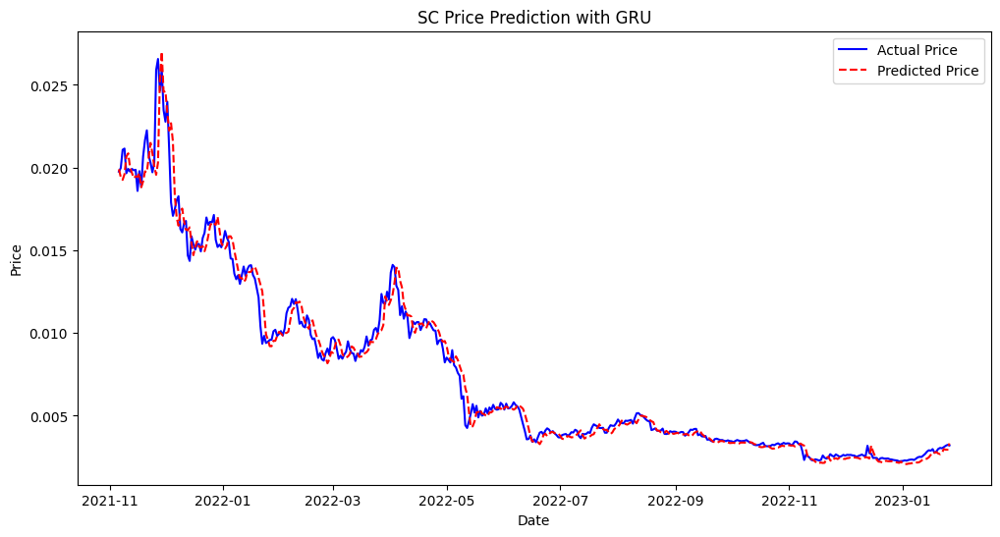

Metrics for GRU Model on SC: {'MSE': 7.682188292369562e-05, 'MAE': 0.0050055750259389445, 'RMSE': 0.008764809348964507, 'R2': 0.9775161448674745}


In [76]:
# Build the GRU model
model_gru_sc = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_sc.shape[1], X_train_sc.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_sc.compile(optimizer='adam', loss='mse')
history_gru_sc = model_gru_sc.fit(X_train_sc, y_train_sc, epochs=100, batch_size=32, validation_data=(X_validation_sc, y_validation_sc), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_sc = model_gru_sc.predict(X_validation_sc).reshape(-1,1)
mse_gru_sc = mean_squared_error(y_validation_sc, y_pred_gru_sc)
mae_gru_sc = mean_absolute_error(y_validation_sc, y_pred_gru_sc)
rmse_gru_sc = np.sqrt(mse_gru_sc)
r2_gru_sc = r2_score(y_validation_sc, y_pred_gru_sc)

# Store metrics
metrics_gru_sc = {
    "MSE": mse_gru_sc,
    "MAE": mae_gru_sc,
    "RMSE": rmse_gru_sc,
    "R2": r2_gru_sc
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_sc = scaler_label.inverse_transform(y_validation_sc.reshape(-1, 1))
y_pred_actual_gru_sc = scaler_label.inverse_transform(y_pred_gru_sc)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_sc.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_sc.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('SC Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on SC:", metrics_gru_sc)

## Bi-LSTM

Epoch 1/100
69/69 [==============================] - 3s 9ms/step - loss: 0.0030 - val_loss: 1.6972e-04
Epoch 2/100
69/69 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 2.3374e-04
Epoch 3/100
69/69 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 1.9977e-04
Epoch 4/100
69/69 [==============================] - 0s 6ms/step - loss: 0.0011 - val_loss: 1.6265e-04
Epoch 5/100
69/69 [==============================] - 0s 5ms/step - loss: 9.6806e-04 - val_loss: 4.3736e-04
Epoch 6/100
69/69 [==============================] - 0s 5ms/step - loss: 9.5808e-04 - val_loss: 2.3119e-04
Epoch 7/100
69/69 [==============================] - 0s 6ms/step - loss: 8.3729e-04 - val_loss: 1.5568e-04
Epoch 8/100
69/69 [==============================] - 0s 5ms/step - loss: 9.1146e-04 - val_loss: 3.5353e-04
Epoch 9/100
69/69 [==============================] - 0s 5ms/step - loss: 8.9151e-04 - val_loss: 2.2670e-04
Epoch 10/100
69/69 [==============================] -

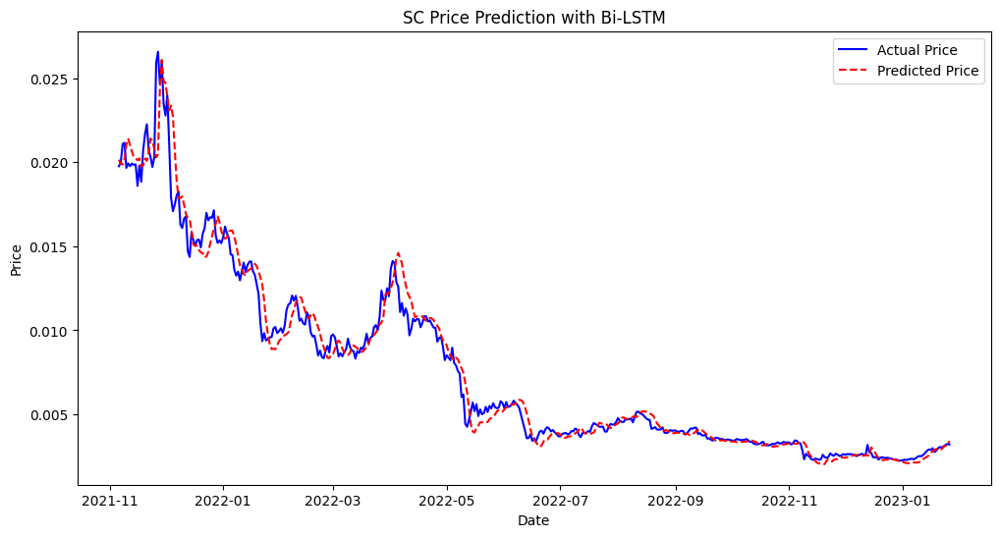

Metrics for Bi-LSTM Model on SC: {'MSE': 0.00010179116066590495, 'MAE': 0.005994492056128022, 'RMSE': 0.010089160553083936, 'R2': 0.9702082580759304}


In [77]:
# Build the Bi-LSTM model
model_bilstm_sc = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_sc.shape[1], X_train_sc.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_sc.compile(optimizer='adam', loss='mse')
history_bilstm_sc = model_bilstm_sc.fit(X_train_sc, y_train_sc, epochs=100, batch_size=32, validation_data=(X_validation_sc, y_validation_sc), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_sc = model_bilstm_sc.predict(X_validation_sc).reshape(-1, 1)
mse_bilstm_sc = mean_squared_error(y_validation_sc, y_pred_bilstm_sc)
mae_bilstm_sc = mean_absolute_error(y_validation_sc, y_pred_bilstm_sc)
rmse_bilstm_sc = np.sqrt(mse_bilstm_sc)
r2_bilstm_sc = r2_score(y_validation_sc, y_pred_bilstm_sc)

# Store metrics
metrics_bilstm_sc = {
    "MSE": mse_bilstm_sc,
    "MAE": mae_bilstm_sc,
    "RMSE": rmse_bilstm_sc,
    "R2": r2_bilstm_sc
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_sc = scaler_label.inverse_transform(y_validation_sc.reshape(-1, 1))
y_pred_actual_bilstm_sc = scaler_label.inverse_transform(y_pred_bilstm_sc)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_sc.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_sc.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('SC Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on SC:", metrics_bilstm_sc)

# 23. FTM

## LSTM

Epoch 1/100
44/44 [==============================] - 1s 9ms/step - loss: 0.0180 - val_loss: 2.3510e-04
Epoch 2/100
44/44 [==============================] - 0s 5ms/step - loss: 0.0023 - val_loss: 1.6486e-04
Epoch 3/100
44/44 [==============================] - 0s 5ms/step - loss: 0.0025 - val_loss: 1.8124e-04
Epoch 4/100
44/44 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 1.4876e-04
Epoch 5/100
44/44 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 1.6286e-04
Epoch 6/100
44/44 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 1.7009e-04
Epoch 7/100
44/44 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 2.1509e-04
Epoch 8/100
44/44 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 2.0409e-04
Epoch 9/100
44/44 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 1.8183e-04
Epoch 10/100
44/44 [==============================] - 0s 5ms/step - loss:

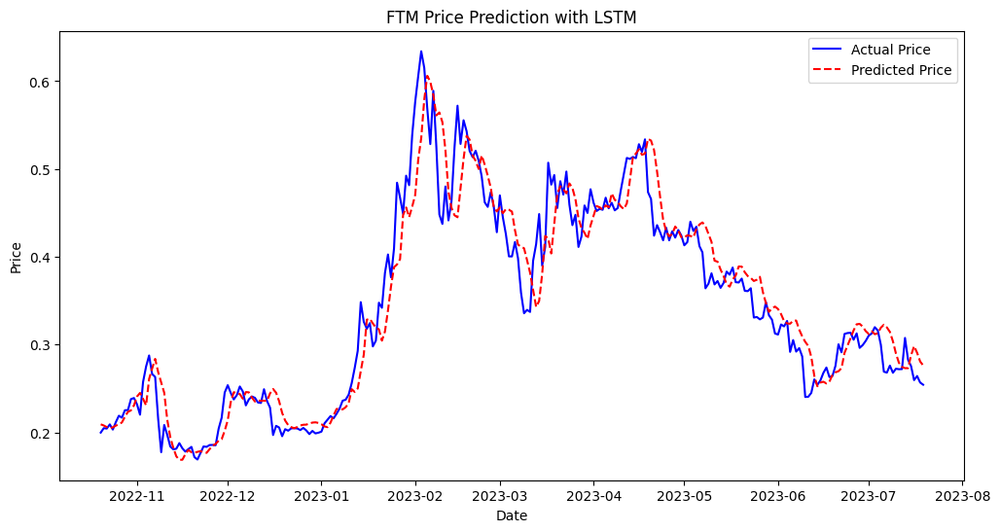

Metrics for LSTM Model on FTM: {'MSE': 0.00010791252093899177, 'MAE': 0.007198187854897121, 'RMSE': 0.010388095154502185, 'R2': 0.909372466238332}


In [78]:
# Define features and target
ftm = get_crypto_data('FTM')
features = ftm.drop(["Close"], axis=1)
label = ftm["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_ftm_features, validation_label, test_ftm_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)

# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_ftm, y_train_ftm = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_ftm, y_validation_ftm = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_ftm = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_ftm.shape[1], X_train_ftm.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_ftm.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_ftm = model_lstm_ftm.fit(X_train_ftm, y_train_ftm, epochs=100, batch_size=32, validation_data=(X_validation_ftm, y_validation_ftm), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_ftm = model_lstm_ftm.evaluate(X_validation_ftm, y_validation_ftm)

# Prediction
y_pred_lstm_ftm = model_lstm_ftm.predict(X_validation_ftm).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_ftm = mean_squared_error(y_validation_ftm, y_pred_lstm_ftm)
mae_lstm_ftm = mean_absolute_error(y_validation_ftm, y_pred_lstm_ftm)
rmse_lstm_ftm = np.sqrt(mse_lstm_ftm)
r2_lstm_ftm = r2_score(y_validation_ftm, y_pred_lstm_ftm)

# Store metrics for later comparison
metrics_lstm_ftm = {
    "MSE": mse_lstm_ftm,
    "MAE": mae_lstm_ftm,
    "RMSE": rmse_lstm_ftm,
    "R2": r2_lstm_ftm
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_ftm = scaler_label.inverse_transform(y_validation_ftm.reshape(-1, 1))
y_pred_actual_lstm_ftm = scaler_label.inverse_transform(y_pred_lstm_ftm)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_ftm.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_ftm.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('FTM Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on FTM:", metrics_lstm_ftm)

## GRU

Epoch 1/100
44/44 [==============================] - 1s 10ms/step - loss: 0.0245 - val_loss: 8.9154e-04
Epoch 2/100
44/44 [==============================] - 0s 5ms/step - loss: 0.0029 - val_loss: 1.4377e-04
Epoch 3/100
44/44 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 3.0208e-04
Epoch 4/100
44/44 [==============================] - 0s 6ms/step - loss: 0.0019 - val_loss: 1.4280e-04
Epoch 5/100
44/44 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 1.9864e-04
Epoch 6/100
44/44 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 1.2388e-04
Epoch 7/100
44/44 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 1.7945e-04
Epoch 8/100
44/44 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 1.2098e-04
Epoch 9/100
44/44 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 1.2411e-04
Epoch 10/100
44/44 [==============================] - 0s 6ms/step - loss

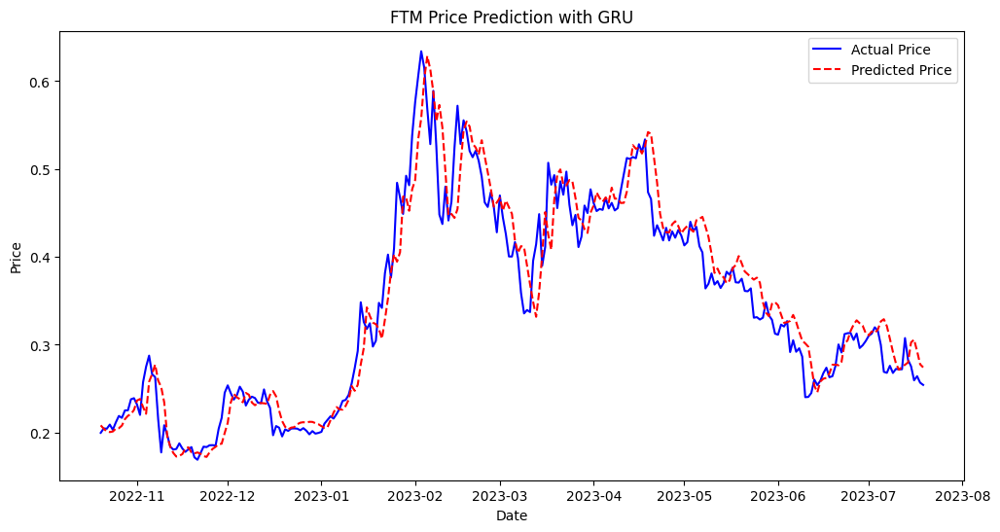

Metrics for GRU Model on FTM: {'MSE': 9.742234555482582e-05, 'MAE': 0.006888595689356268, 'RMSE': 0.009870275860117883, 'R2': 0.9181823681433371}


In [79]:
# Build the GRU model
model_gru_ftm = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_ftm.shape[1], X_train_ftm.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_ftm.compile(optimizer='adam', loss='mse')
history_gru_ftm = model_gru_ftm.fit(X_train_ftm, y_train_ftm, epochs=100, batch_size=32, validation_data=(X_validation_ftm, y_validation_ftm), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_ftm = model_gru_ftm.predict(X_validation_ftm).reshape(-1,1)
mse_gru_ftm = mean_squared_error(y_validation_ftm, y_pred_gru_ftm)
mae_gru_ftm = mean_absolute_error(y_validation_ftm, y_pred_gru_ftm)
rmse_gru_ftm = np.sqrt(mse_gru_ftm)
r2_gru_ftm = r2_score(y_validation_ftm, y_pred_gru_ftm)

# Store metrics
metrics_gru_ftm = {
    "MSE": mse_gru_ftm,
    "MAE": mae_gru_ftm,
    "RMSE": rmse_gru_ftm,
    "R2": r2_gru_ftm
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_ftm = scaler_label.inverse_transform(y_validation_ftm.reshape(-1, 1))
y_pred_actual_gru_ftm = scaler_label.inverse_transform(y_pred_gru_ftm)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_ftm.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_ftm.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('FTM Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on FTM:", metrics_gru_ftm)

## Bi-LSTM

Epoch 1/100
44/44 [==============================] - 1s 11ms/step - loss: 0.0058 - val_loss: 2.2786e-04
Epoch 2/100
44/44 [==============================] - 0s 6ms/step - loss: 0.0029 - val_loss: 1.6723e-04
Epoch 3/100
44/44 [==============================] - 0s 6ms/step - loss: 0.0024 - val_loss: 1.6096e-04
Epoch 4/100
44/44 [==============================] - 0s 6ms/step - loss: 0.0020 - val_loss: 1.4543e-04
Epoch 5/100
44/44 [==============================] - 0s 6ms/step - loss: 0.0017 - val_loss: 2.3376e-04
Epoch 6/100
44/44 [==============================] - 0s 6ms/step - loss: 0.0018 - val_loss: 1.4697e-04
Epoch 7/100
44/44 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 2.6478e-04
Epoch 8/100
44/44 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 2.8205e-04
Epoch 9/100
44/44 [==============================] - 0s 6ms/step - loss: 0.0018 - val_loss: 1.5400e-04
Epoch 10/100
44/44 [==============================] - 0s 6ms/step - loss

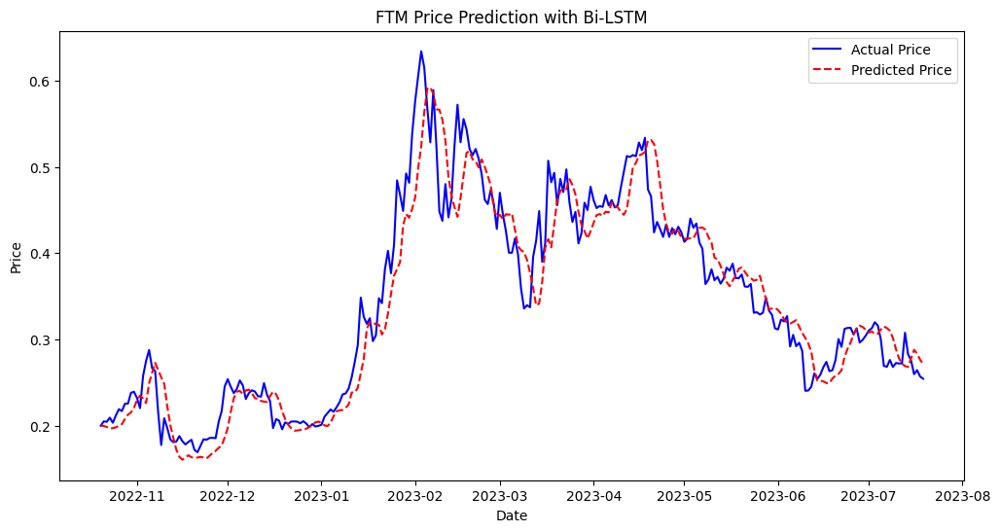

Metrics for Bi-LSTM Model on FTM: {'MSE': 0.00011992959158428812, 'MAE': 0.00782523306453251, 'RMSE': 0.01095123698877383, 'R2': 0.89928024092336}


In [80]:
# Build the Bi-LSTM model
model_bilstm_ftm = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_ftm.shape[1], X_train_ftm.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_ftm.compile(optimizer='adam', loss='mse')
history_bilstm_ftm = model_bilstm_ftm.fit(X_train_ftm, y_train_ftm, epochs=100, batch_size=32, validation_data=(X_validation_ftm, y_validation_ftm), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_ftm = model_bilstm_ftm.predict(X_validation_ftm).reshape(-1, 1)
mse_bilstm_ftm = mean_squared_error(y_validation_ftm, y_pred_bilstm_ftm)
mae_bilstm_ftm = mean_absolute_error(y_validation_ftm, y_pred_bilstm_ftm)
rmse_bilstm_ftm = np.sqrt(mse_bilstm_ftm)
r2_bilstm_ftm = r2_score(y_validation_ftm, y_pred_bilstm_ftm)

# Store metrics
metrics_bilstm_ftm = {
    "MSE": mse_bilstm_ftm,
    "MAE": mae_bilstm_ftm,
    "RMSE": rmse_bilstm_ftm,
    "R2": r2_bilstm_ftm
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_ftm = scaler_label.inverse_transform(y_validation_ftm.reshape(-1, 1))
y_pred_actual_bilstm_ftm = scaler_label.inverse_transform(y_pred_bilstm_ftm)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_ftm.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_ftm.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('FTM Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on FTM:", metrics_bilstm_ftm)

# 24. DCR

## LSTM

Epoch 1/100
66/66 [==============================] - 1s 8ms/step - loss: 0.0066 - val_loss: 9.2869e-04
Epoch 2/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 4.3991e-04
Epoch 3/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 3.0547e-04
Epoch 4/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 9.6950e-04
Epoch 5/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 4.2917e-04
Epoch 6/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 6.1090e-04
Epoch 7/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 4.3013e-04
Epoch 8/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 4.7813e-04
Epoch 9/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 5.3043e-04
Epoch 10/100
66/66 [==============================] - 0s 5ms/step - loss:

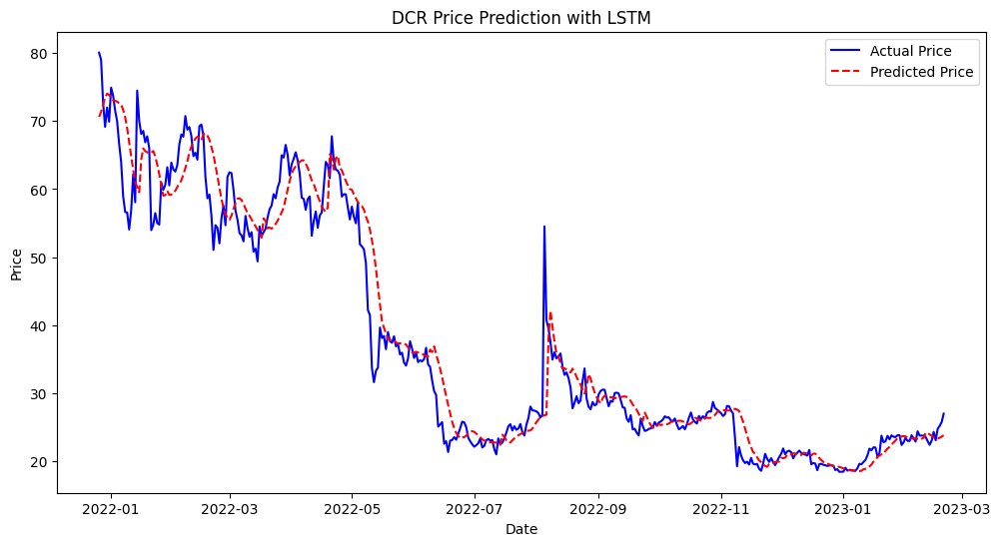

Metrics for LSTM Model on DCR: {'MSE': 0.00030547081182394164, 'MAE': 0.01100416234895016, 'RMSE': 0.017477723302076323, 'R2': 0.9376937345822831}


In [82]:
# Define features and target
dcr = get_crypto_data('DCR')
features = dcr.drop(["Close"], axis=1)
label = dcr["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_dcr_features, validation_label, test_dcr_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)


# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_dcr, y_train_dcr = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_dcr, y_validation_dcr = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_dcr = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_dcr.shape[1], X_train_dcr.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_dcr.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_dcr = model_lstm_dcr.fit(X_train_dcr, y_train_dcr, epochs=100, batch_size=32, validation_data=(X_validation_dcr, y_validation_dcr), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_dcr = model_lstm_dcr.evaluate(X_validation_dcr, y_validation_dcr)

# prediction
y_pred_lstm_dcr = model_lstm_dcr.predict(X_validation_dcr).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_dcr = mean_squared_error(y_validation_dcr, y_pred_lstm_dcr)
mae_lstm_dcr = mean_absolute_error(y_validation_dcr, y_pred_lstm_dcr)
rmse_lstm_dcr = np.sqrt(mse_lstm_dcr)
r2_lstm_dcr = r2_score(y_validation_dcr, y_pred_lstm_dcr)

# Store metrics for later comparison
metrics_lstm_dcr = {
    "MSE": mse_lstm_dcr,
    "MAE": mae_lstm_dcr,
    "RMSE": rmse_lstm_dcr,
    "R2": r2_lstm_dcr
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_dcr = scaler_label.inverse_transform(y_validation_dcr.reshape(-1, 1))
y_pred_actual_lstm_dcr = scaler_label.inverse_transform(y_pred_lstm_dcr)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_dcr.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_dcr.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('DCR Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on DCR:", metrics_lstm_dcr)

## GRU

Epoch 1/100
66/66 [==============================] - 1s 7ms/step - loss: 0.0049 - val_loss: 4.4393e-04
Epoch 2/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 0.0011
Epoch 3/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 4.9952e-04
Epoch 4/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 2.0945e-04
Epoch 5/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 3.4738e-04
Epoch 6/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 3.5639e-04
Epoch 7/100
66/66 [==============================] - 0s 5ms/step - loss: 9.2821e-04 - val_loss: 3.7412e-04
Epoch 8/100
66/66 [==============================] - 0s 5ms/step - loss: 9.1313e-04 - val_loss: 2.4953e-04
Epoch 9/100
66/66 [==============================] - 0s 5ms/step - loss: 8.7990e-04 - val_loss: 3.8352e-04
Epoch 10/100
66/66 [==============================] - 0s 5ms/step

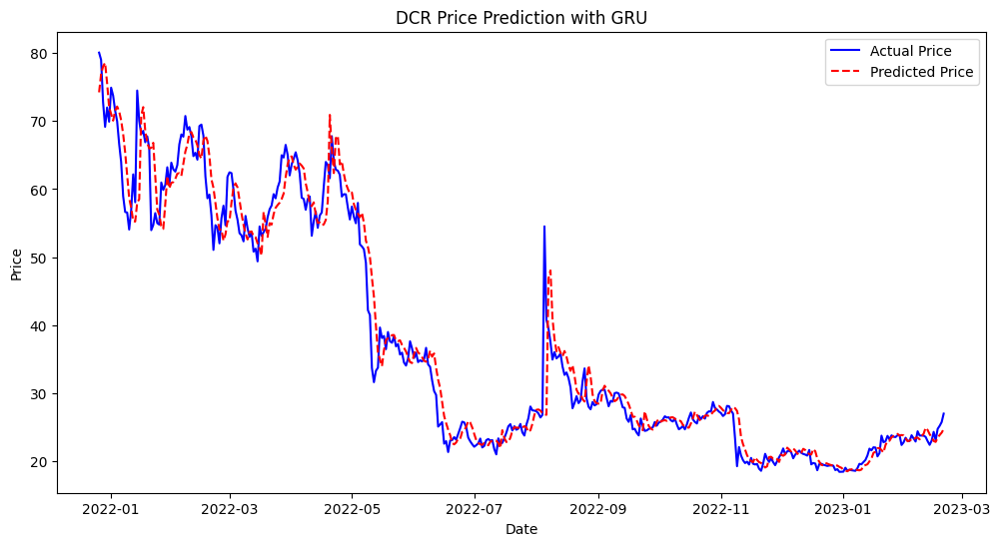

Metrics for GRU Model on DCR: {'MSE': 0.00020635744669479506, 'MAE': 0.00897720673123369, 'RMSE': 0.014365146943028291, 'R2': 0.9579096877769827}


In [83]:
# Build the GRU model
model_gru_dcr = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_dcr.shape[1], X_train_dcr.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_dcr.compile(optimizer='adam', loss='mse')
history_gru_dcr = model_gru_dcr.fit(X_train_dcr, y_train_dcr, epochs=100, batch_size=32, validation_data=(X_validation_dcr, y_validation_dcr), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_dcr = model_gru_dcr.predict(X_validation_dcr).reshape(-1,1)
mse_gru_dcr = mean_squared_error(y_validation_dcr, y_pred_gru_dcr)
mae_gru_dcr = mean_absolute_error(y_validation_dcr, y_pred_gru_dcr)
rmse_gru_dcr = np.sqrt(mse_gru_dcr)
r2_gru_dcr = r2_score(y_validation_dcr, y_pred_gru_dcr)

# Store metrics
metrics_gru_dcr = {
    "MSE": mse_gru_dcr,
    "MAE": mae_gru_dcr,
    "RMSE": rmse_gru_dcr,
    "R2": r2_gru_dcr
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_dcr = scaler_label.inverse_transform(y_validation_dcr.reshape(-1, 1))
y_pred_actual_gru_dcr = scaler_label.inverse_transform(y_pred_gru_dcr)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_dcr.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_dcr.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('DCR Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on DCR:", metrics_gru_dcr)

## Bi-LSTM

Epoch 1/100
66/66 [==============================] - 2s 9ms/step - loss: 0.0102 - val_loss: 9.7661e-04
Epoch 2/100
66/66 [==============================] - 0s 6ms/step - loss: 0.0026 - val_loss: 8.4674e-04
Epoch 3/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 0.0012
Epoch 4/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 4.3603e-04
Epoch 5/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 4.3931e-04
Epoch 6/100
66/66 [==============================] - 0s 6ms/step - loss: 0.0013 - val_loss: 3.9402e-04
Epoch 7/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 5.8552e-04
Epoch 8/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 4.3452e-04
Epoch 9/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 4.7096e-04
Epoch 10/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0

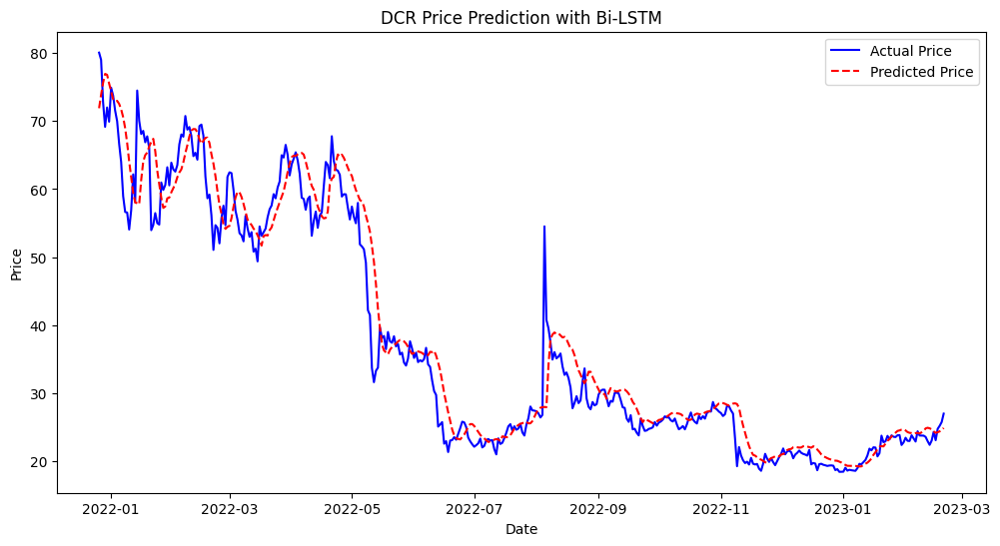

Metrics for Bi-LSTM Model on DCR: {'MSE': 0.00029810164554824414, 'MAE': 0.011367003924212506, 'RMSE': 0.017265620334880646, 'R2': 0.9391968085654876}


In [84]:
# Build the Bi-LSTM model
model_bilstm_dcr = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_dcr.shape[1], X_train_dcr.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_dcr.compile(optimizer='adam', loss='mse')
history_bilstm_dcr = model_bilstm_dcr.fit(X_train_dcr, y_train_dcr, epochs=100, batch_size=32, validation_data=(X_validation_dcr, y_validation_dcr), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_dcr = model_bilstm_dcr.predict(X_validation_dcr).reshape(-1, 1)
mse_bilstm_dcr = mean_squared_error(y_validation_dcr, y_pred_bilstm_dcr)
mae_bilstm_dcr = mean_absolute_error(y_validation_dcr, y_pred_bilstm_dcr)
rmse_bilstm_dcr = np.sqrt(mse_bilstm_dcr)
r2_bilstm_dcr = r2_score(y_validation_dcr, y_pred_bilstm_dcr)

# Store metrics
metrics_bilstm_dcr = {
    "MSE": mse_bilstm_dcr,
    "MAE": mae_bilstm_dcr,
    "RMSE": rmse_bilstm_dcr,
    "R2": r2_bilstm_dcr
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_dcr = scaler_label.inverse_transform(y_validation_dcr.reshape(-1, 1))
y_pred_actual_bilstm_dcr = scaler_label.inverse_transform(y_pred_bilstm_dcr)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_dcr.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_dcr.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('DCR Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on DCR:", metrics_bilstm_dcr)

# 25. MKR

## LSTM

Epoch 1/100
52/52 [==============================] - 1s 8ms/step - loss: 0.0096 - val_loss: 1.3944e-04
Epoch 2/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 1.3710e-04
Epoch 3/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 1.0870e-04
Epoch 4/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 1.0566e-04
Epoch 5/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 1.0666e-04
Epoch 6/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 1.4642e-04
Epoch 7/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 1.5008e-04
Epoch 8/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 2.0328e-04
Epoch 9/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 1.2120e-04
Epoch 10/100
52/52 [==============================] - 0s 5ms/step - loss:

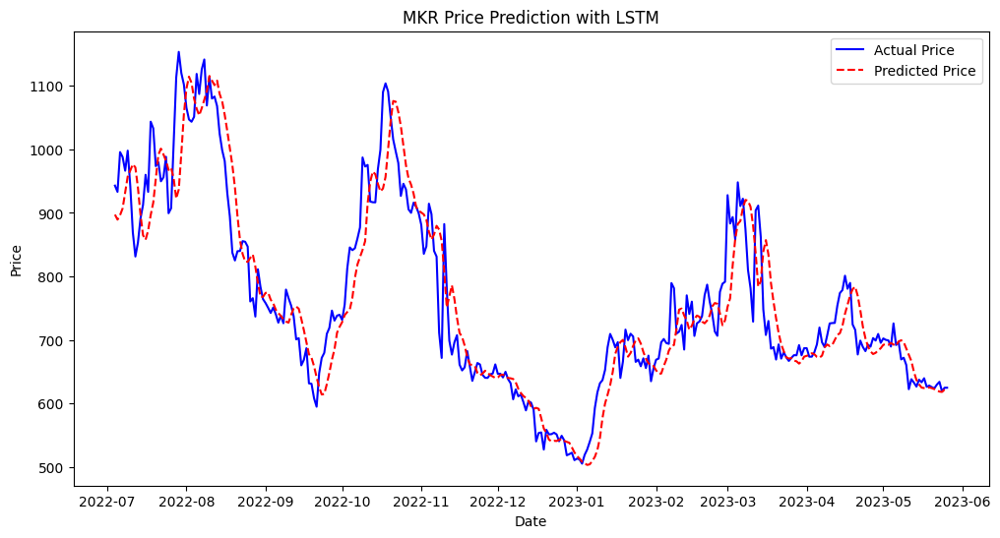

Metrics for LSTM Model on MKR: {'MSE': 8.930199261866308e-05, 'MAE': 0.006878881470153438, 'RMSE': 0.009449973154388487, 'R2': 0.8548348012446827}


In [85]:
# Define features and target
mkr = get_crypto_data('MKR')
features = mkr.drop(["Close"], axis=1)
label = mkr["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_mkr_features, validation_label, test_mkr_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)

# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_mkr, y_train_mkr = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_mkr, y_validation_mkr = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_mkr = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_mkr.shape[1], X_train_mkr.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_mkr.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_mkr = model_lstm_mkr.fit(X_train_mkr, y_train_mkr, epochs=100, batch_size=32, validation_data=(X_validation_mkr, y_validation_mkr), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_mkr = model_lstm_mkr.evaluate(X_validation_mkr, y_validation_mkr)

# prediction
y_pred_lstm_mkr = model_lstm_mkr.predict(X_validation_mkr).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_mkr = mean_squared_error(y_validation_mkr, y_pred_lstm_mkr)
mae_lstm_mkr = mean_absolute_error(y_validation_mkr, y_pred_lstm_mkr)
rmse_lstm_mkr = np.sqrt(mse_lstm_mkr)
r2_lstm_mkr = r2_score(y_validation_mkr, y_pred_lstm_mkr)

# Store metrics for later comparison
metrics_lstm_mkr = {
    "MSE": mse_lstm_mkr,
    "MAE": mae_lstm_mkr,
    "RMSE": rmse_lstm_mkr,
    "R2": r2_lstm_mkr
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_mkr = scaler_label.inverse_transform(y_validation_mkr.reshape(-1, 1))
y_pred_actual_lstm_mkr = scaler_label.inverse_transform(y_pred_lstm_mkr)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_mkr.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_mkr.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('MKR Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on MKR:", metrics_lstm_mkr)

## GRU

Epoch 1/100
52/52 [==============================] - 1s 8ms/step - loss: 0.0122 - val_loss: 4.6613e-04
Epoch 2/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 1.6286e-04
Epoch 3/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 1.3913e-04
Epoch 4/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 9.5463e-05
Epoch 5/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 1.1472e-04
Epoch 6/100
52/52 [==============================] - 0s 6ms/step - loss: 0.0012 - val_loss: 9.2698e-05
Epoch 7/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 2.7356e-04
Epoch 8/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 1.0813e-04
Epoch 9/100
52/52 [==============================] - 0s 5ms/step - loss: 9.6823e-04 - val_loss: 1.1847e-04
Epoch 10/100
52/52 [==============================] - 0s 5ms/step - l

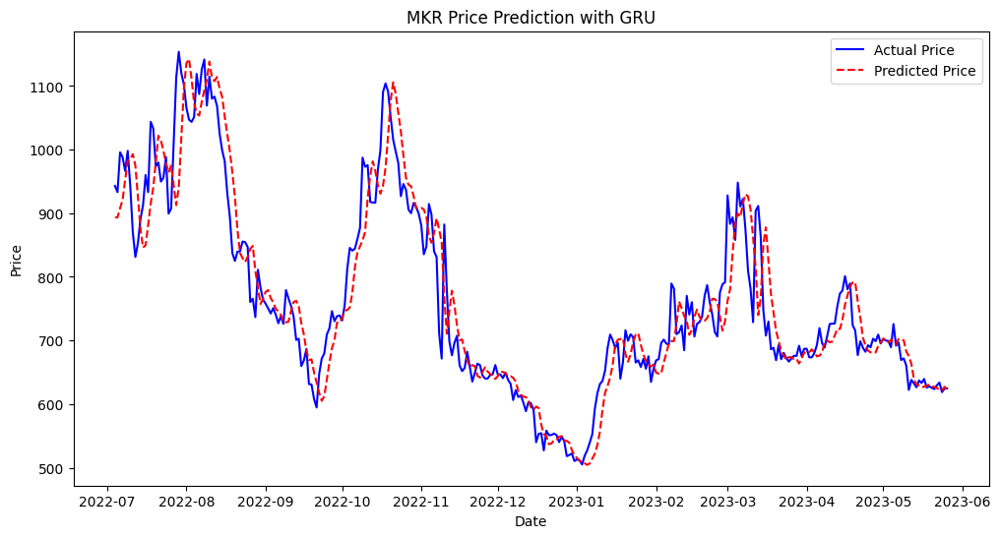

Metrics for GRU Model on MKR: {'MSE': 8.61680956939821e-05, 'MAE': 0.006694621854202795, 'RMSE': 0.009282677183549049, 'R2': 0.8599291194856277}


In [86]:
# Build the GRU model
model_gru_mkr = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_mkr.shape[1], X_train_mkr.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_mkr.compile(optimizer='adam', loss='mse')
history_gru_mkr = model_gru_mkr.fit(X_train_mkr, y_train_mkr, epochs=100, batch_size=32, validation_data=(X_validation_mkr, y_validation_mkr), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_mkr = model_gru_mkr.predict(X_validation_mkr).reshape(-1,1)
mse_gru_mkr = mean_squared_error(y_validation_mkr, y_pred_gru_mkr)
mae_gru_mkr = mean_absolute_error(y_validation_mkr, y_pred_gru_mkr)
rmse_gru_mkr = np.sqrt(mse_gru_mkr)
r2_gru_mkr = r2_score(y_validation_mkr, y_pred_gru_mkr)

# Store metrics
metrics_gru_mkr = {
    "MSE": mse_gru_mkr,
    "MAE": mae_gru_mkr,
    "RMSE": rmse_gru_mkr,
    "R2": r2_gru_mkr
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_mkr = scaler_label.inverse_transform(y_validation_mkr.reshape(-1, 1))
y_pred_actual_gru_mkr = scaler_label.inverse_transform(y_pred_gru_mkr)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_mkr.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_mkr.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('MKR Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on MKR:", metrics_gru_mkr)

## Bi-LSTM

Epoch 1/100
52/52 [==============================] - 1s 10ms/step - loss: 0.0084 - val_loss: 3.1890e-04
Epoch 2/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0031 - val_loss: 2.4796e-04
Epoch 3/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 1.5154e-04
Epoch 4/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 1.7128e-04
Epoch 5/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 1.4545e-04
Epoch 6/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 1.2445e-04
Epoch 7/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 1.3958e-04
Epoch 8/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 2.1984e-04
Epoch 9/100
52/52 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 1.2027e-04
Epoch 10/100
52/52 [==============================] - 0s 5ms/step - loss

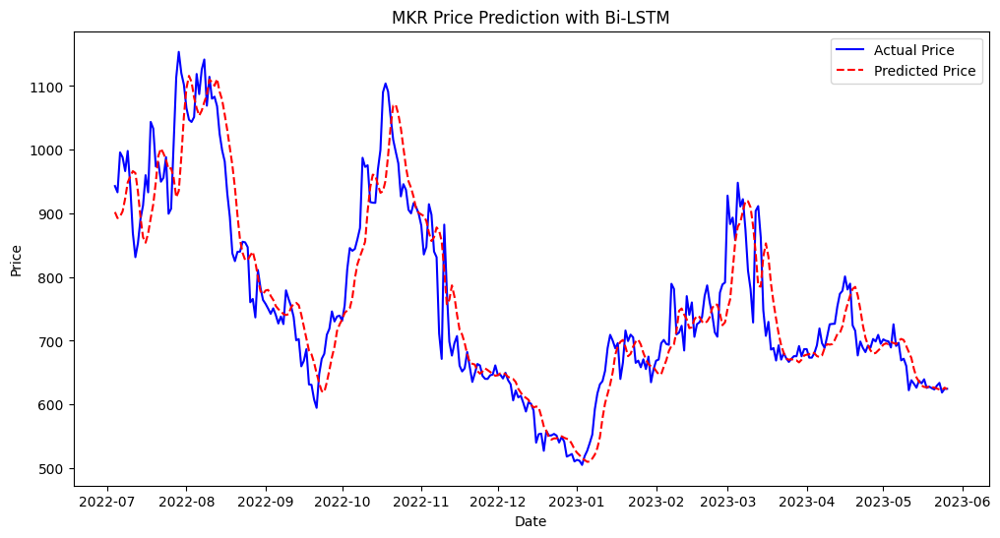

Metrics for Bi-LSTM Model on MKR: {'MSE': 8.970842857587534e-05, 'MAE': 0.006886371596999878, 'RMSE': 0.00947145335077333, 'R2': 0.8541741177058285}


In [87]:
# Build the Bi-LSTM model
model_bilstm_mkr = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_mkr.shape[1], X_train_mkr.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_mkr.compile(optimizer='adam', loss='mse')
history_bilstm_mkr = model_bilstm_mkr.fit(X_train_mkr, y_train_mkr, epochs=100, batch_size=32, validation_data=(X_validation_mkr, y_validation_mkr), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_mkr = model_bilstm_mkr.predict(X_validation_mkr).reshape(-1, 1)
mse_bilstm_mkr = mean_squared_error(y_validation_mkr, y_pred_bilstm_mkr)
mae_bilstm_mkr = mean_absolute_error(y_validation_mkr, y_pred_bilstm_mkr)
rmse_bilstm_mkr = np.sqrt(mse_bilstm_mkr)
r2_bilstm_mkr = r2_score(y_validation_mkr, y_pred_bilstm_mkr)

# Store metrics
metrics_bilstm_mkr = {
    "MSE": mse_bilstm_mkr,
    "MAE": mae_bilstm_mkr,
    "RMSE": rmse_bilstm_mkr,
    "R2": r2_bilstm_mkr
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_mkr = scaler_label.inverse_transform(y_validation_mkr.reshape(-1, 1))
y_pred_actual_bilstm_mkr = scaler_label.inverse_transform(y_pred_bilstm_mkr)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_mkr.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_mkr.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('MKR Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on MKR:", metrics_bilstm_mkr)

# 26. ATOM

## LSTM

Epoch 1/100
41/41 [==============================] - 1s 9ms/step - loss: 0.0125 - val_loss: 4.8844e-04
Epoch 2/100
41/41 [==============================] - 0s 5ms/step - loss: 0.0042 - val_loss: 9.0980e-04
Epoch 3/100
41/41 [==============================] - 0s 5ms/step - loss: 0.0036 - val_loss: 2.9012e-04
Epoch 4/100
41/41 [==============================] - 0s 5ms/step - loss: 0.0030 - val_loss: 3.7878e-04
Epoch 5/100
41/41 [==============================] - 0s 5ms/step - loss: 0.0027 - val_loss: 3.1916e-04
Epoch 6/100
41/41 [==============================] - 0s 6ms/step - loss: 0.0025 - val_loss: 6.0788e-04
Epoch 7/100
41/41 [==============================] - 0s 5ms/step - loss: 0.0025 - val_loss: 2.3359e-04
Epoch 8/100
41/41 [==============================] - 0s 5ms/step - loss: 0.0026 - val_loss: 2.2737e-04
Epoch 9/100
41/41 [==============================] - 0s 5ms/step - loss: 0.0027 - val_loss: 2.2344e-04
Epoch 10/100
41/41 [==============================] - 0s 5ms/step - loss:

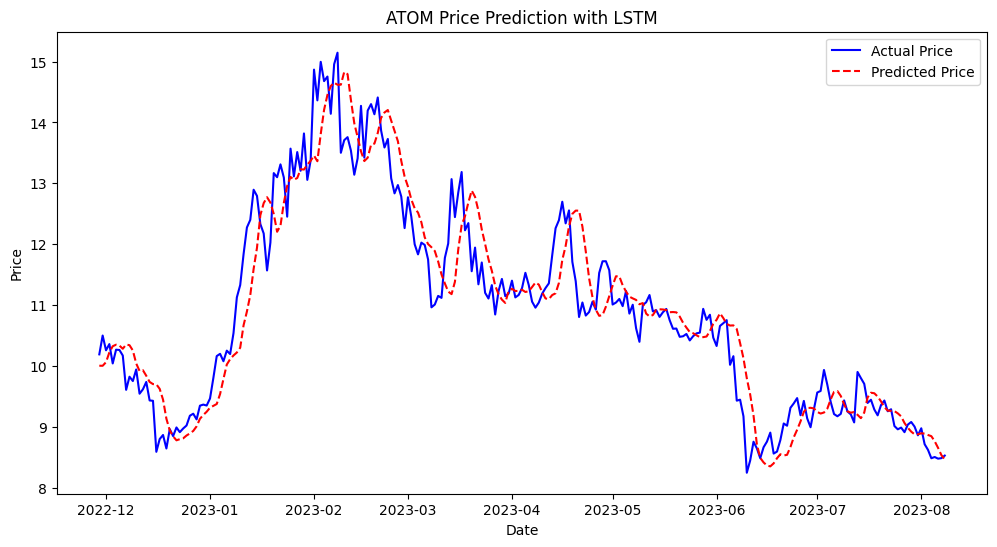

Metrics for LSTM Model on ATOM: {'MSE': 0.00018056798997562897, 'MAE': 0.010218644053939513, 'RMSE': 0.013437558929196514, 'R2': 0.8809485282572824}


In [88]:
# Define features and target
atom = get_crypto_data('ATOM')
features = atom.drop(["Close"], axis=1)
label = atom["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_atom_features, validation_label, test_atom_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)


# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_atom, y_train_atom = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_atom, y_validation_atom = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_atom = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_atom.shape[1], X_train_atom.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_atom.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_atom = model_lstm_atom.fit(X_train_atom, y_train_atom, epochs=100, batch_size=32, validation_data=(X_validation_atom, y_validation_atom), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_atom = model_lstm_atom.evaluate(X_validation_atom, y_validation_atom)

# prediction
y_pred_lstm_atom = model_lstm_atom.predict(X_validation_atom).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_atom = mean_squared_error(y_validation_atom, y_pred_lstm_atom)
mae_lstm_atom = mean_absolute_error(y_validation_atom, y_pred_lstm_atom)
rmse_lstm_atom = np.sqrt(mse_lstm_atom)
r2_lstm_atom = r2_score(y_validation_atom, y_pred_lstm_atom)

# Store metrics for later comparison
metrics_lstm_atom = {
    "MSE": mse_lstm_atom,
    "MAE": mae_lstm_atom,
    "RMSE": rmse_lstm_atom,
    "R2": r2_lstm_atom
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_atom = scaler_label.inverse_transform(y_validation_atom.reshape(-1, 1))
y_pred_actual_lstm_atom = scaler_label.inverse_transform(y_pred_lstm_atom)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_atom.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_atom.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('ATOM Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on ATOM:", metrics_lstm_atom)

## GRU

Epoch 1/100
41/41 [==============================] - 1s 9ms/step - loss: 0.0058 - val_loss: 2.0334e-04
Epoch 2/100
41/41 [==============================] - 0s 5ms/step - loss: 0.0032 - val_loss: 2.3473e-04
Epoch 3/100
41/41 [==============================] - 0s 5ms/step - loss: 0.0027 - val_loss: 6.4842e-04
Epoch 4/100
41/41 [==============================] - 0s 5ms/step - loss: 0.0027 - val_loss: 3.8587e-04
Epoch 5/100
41/41 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 2.1587e-04
Epoch 6/100
41/41 [==============================] - 0s 5ms/step - loss: 0.0022 - val_loss: 2.0027e-04
Epoch 7/100
41/41 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 1.5852e-04
Epoch 8/100
41/41 [==============================] - 0s 5ms/step - loss: 0.0020 - val_loss: 2.3964e-04
Epoch 9/100
41/41 [==============================] - 0s 7ms/step - loss: 0.0019 - val_loss: 3.0492e-04
Epoch 10/100
41/41 [==============================] - 0s 5ms/step - loss:

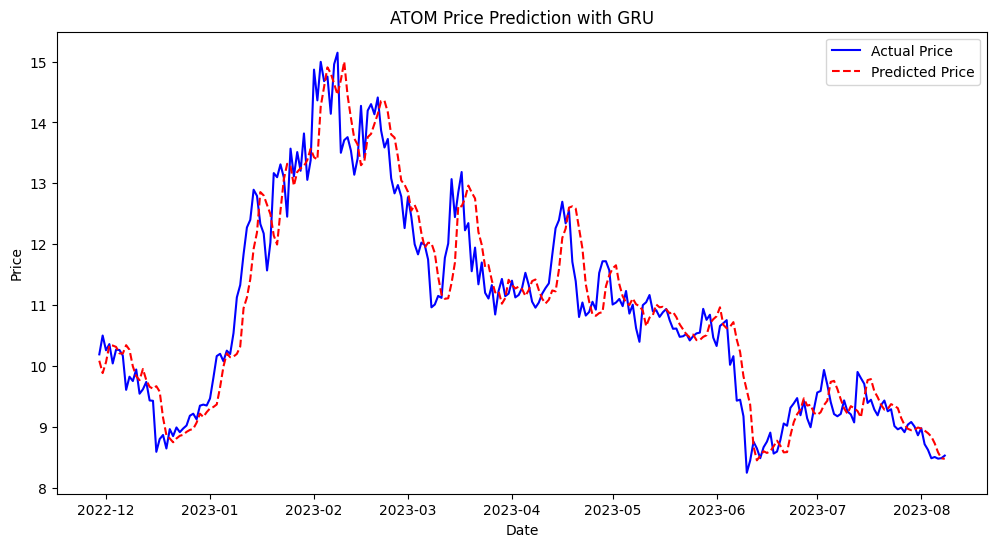

Metrics for GRU Model on ATOM: {'MSE': 0.00014292464795813672, 'MAE': 0.008988291595454218, 'RMSE': 0.011955109700798931, 'R2': 0.9057674082210113}


In [89]:
# Build the GRU model
model_gru_atom = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_atom.shape[1], X_train_atom.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_atom.compile(optimizer='adam', loss='mse')
history_gru_atom = model_gru_atom.fit(X_train_atom, y_train_atom, epochs=100, batch_size=32, validation_data=(X_validation_atom, y_validation_atom), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_atom = model_gru_atom.predict(X_validation_atom).reshape(-1,1)
mse_gru_atom = mean_squared_error(y_validation_atom, y_pred_gru_atom)
mae_gru_atom = mean_absolute_error(y_validation_atom, y_pred_gru_atom)
rmse_gru_atom = np.sqrt(mse_gru_atom)
r2_gru_atom = r2_score(y_validation_atom, y_pred_gru_atom)

# Store metrics
metrics_gru_atom = {
    "MSE": mse_gru_atom,
    "MAE": mae_gru_atom,
    "RMSE": rmse_gru_atom,
    "R2": r2_gru_atom
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_atom = scaler_label.inverse_transform(y_validation_atom.reshape(-1, 1))
y_pred_actual_gru_atom = scaler_label.inverse_transform(y_pred_gru_atom)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_atom.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_atom.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('ATOM Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on ATOM:", metrics_gru_atom)

## Bi-LSTM

Epoch 1/100
41/41 [==============================] - 1s 11ms/step - loss: 0.0117 - val_loss: 0.0019
Epoch 2/100
41/41 [==============================] - 0s 6ms/step - loss: 0.0045 - val_loss: 7.4192e-04
Epoch 3/100
41/41 [==============================] - 0s 6ms/step - loss: 0.0036 - val_loss: 4.2018e-04
Epoch 4/100
41/41 [==============================] - 0s 6ms/step - loss: 0.0030 - val_loss: 3.4380e-04
Epoch 5/100
41/41 [==============================] - 0s 6ms/step - loss: 0.0027 - val_loss: 2.3850e-04
Epoch 6/100
41/41 [==============================] - 0s 6ms/step - loss: 0.0029 - val_loss: 2.2715e-04
Epoch 7/100
41/41 [==============================] - 0s 6ms/step - loss: 0.0026 - val_loss: 2.6553e-04
Epoch 8/100
41/41 [==============================] - 0s 6ms/step - loss: 0.0023 - val_loss: 2.8426e-04
Epoch 9/100
41/41 [==============================] - 0s 6ms/step - loss: 0.0023 - val_loss: 2.9925e-04
Epoch 10/100
41/41 [==============================] - 0s 6ms/step - loss: 0.

Epoch 80/100
41/41 [==============================] - 0s 6ms/step - loss: 0.0018 - val_loss: 1.6883e-04
Epoch 81/100
41/41 [==============================] - 0s 6ms/step - loss: 0.0017 - val_loss: 3.0299e-04
Epoch 82/100
41/41 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 1.7388e-04
Epoch 83/100
8/8 [==============================] - 0s 2ms/step


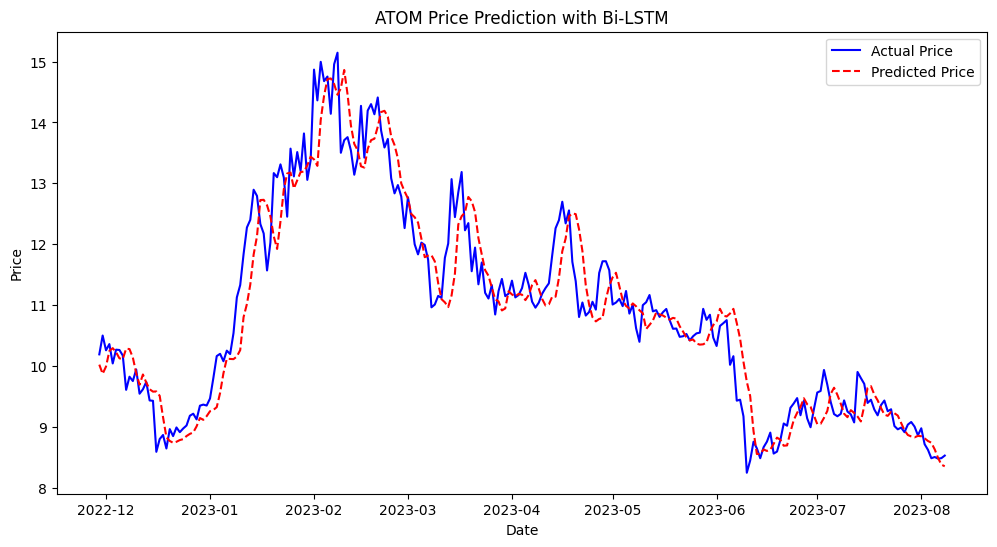

Metrics for Bi-LSTM Model on ATOM: {'MSE': 0.0001518261268641564, 'MAE': 0.009230290506519415, 'RMSE': 0.012321774501432672, 'R2': 0.8998985154865271}


In [90]:
# Build the Bi-LSTM model
model_bilstm_atom = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_atom.shape[1], X_train_atom.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_atom.compile(optimizer='adam', loss='mse')
history_bilstm_atom = model_bilstm_atom.fit(X_train_atom, y_train_atom, epochs=100, batch_size=32, validation_data=(X_validation_atom, y_validation_atom), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_atom = model_bilstm_atom.predict(X_validation_atom).reshape(-1, 1)
mse_bilstm_atom = mean_squared_error(y_validation_atom, y_pred_bilstm_atom)
mae_bilstm_atom = mean_absolute_error(y_validation_atom, y_pred_bilstm_atom)
rmse_bilstm_atom = np.sqrt(mse_bilstm_atom)
r2_bilstm_atom = r2_score(y_validation_atom, y_pred_bilstm_atom)

# Store metrics
metrics_bilstm_atom = {
    "MSE": mse_bilstm_atom,
    "MAE": mae_bilstm_atom,
    "RMSE": rmse_bilstm_atom,
    "R2": r2_bilstm_atom
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_atom = scaler_label.inverse_transform(y_validation_atom.reshape(-1, 1))
y_pred_actual_bilstm_atom = scaler_label.inverse_transform(y_pred_bilstm_atom)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_atom.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_atom.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('ATOM Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on ATOM:", metrics_bilstm_atom)

# 27. STX

## LSTM

Epoch 1/100
36/36 [==============================] - 1s 10ms/step - loss: 0.0306 - val_loss: 0.0019
Epoch 2/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0047 - val_loss: 0.0028
Epoch 3/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0040 - val_loss: 0.0023
Epoch 4/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0038 - val_loss: 0.0017
Epoch 5/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0037 - val_loss: 0.0016
Epoch 6/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0033 - val_loss: 0.0019
Epoch 7/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0033 - val_loss: 0.0024
Epoch 8/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0030 - val_loss: 0.0016
Epoch 9/100
36/36 [==============================] - 0s 6ms/step - loss: 0.0033 - val_loss: 0.0041
Epoch 10/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0029 - val_loss: 0.0020
Epoch 11

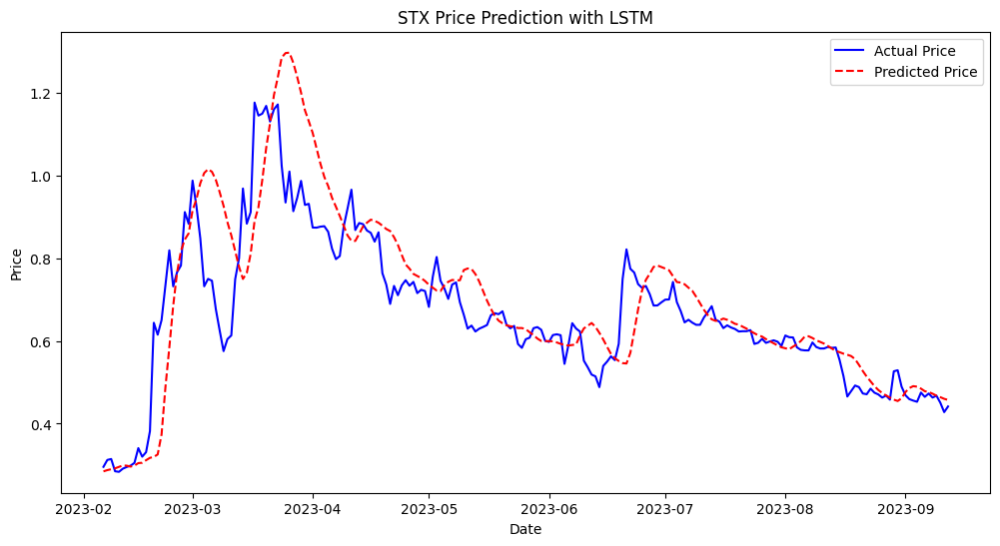

Metrics for LSTM Model on STX: {'MSE': 0.0015849156601568041, 'MAE': 0.02556088381887226, 'RMSE': 0.03981099923584943, 'R2': 0.6009597674332365}


In [91]:
# Define features and target
stx = get_crypto_data('STX')
features = stx.drop(["Close"], axis=1)
label = stx["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_stx_features, validation_label, test_stx_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)


# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_stx, y_train_stx = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_stx, y_validation_stx = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model
model_lstm_stx = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_stx.shape[1], X_train_stx.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_stx.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_stx = model_lstm_stx.fit(X_train_stx, y_train_stx, epochs=100, batch_size=32, validation_data=(X_validation_stx, y_validation_stx), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_stx = model_lstm_stx.evaluate(X_validation_stx, y_validation_stx)

# Prediction
y_pred_lstm_stx = model_lstm_stx.predict(X_validation_stx).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_stx = mean_squared_error(y_validation_stx, y_pred_lstm_stx)
mae_lstm_stx = mean_absolute_error(y_validation_stx, y_pred_lstm_stx)
rmse_lstm_stx = np.sqrt(mse_lstm_stx)
r2_lstm_stx = r2_score(y_validation_stx, y_pred_lstm_stx)

# Store metrics for later comparison
metrics_lstm_stx = {
    "MSE": mse_lstm_stx,
    "MAE": mae_lstm_stx,
    "RMSE": rmse_lstm_stx,
    "R2": r2_lstm_stx
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_stx = scaler_label.inverse_transform(y_validation_stx.reshape(-1, 1))
y_pred_actual_lstm_stx = scaler_label.inverse_transform(y_pred_lstm_stx)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_stx.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_stx.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('STX Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on STX:", metrics_lstm_stx)

## GRU

Epoch 1/100
36/36 [==============================] - 2s 10ms/step - loss: 0.0266 - val_loss: 0.0011
Epoch 2/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0041 - val_loss: 0.0011
Epoch 3/100
36/36 [==============================] - 0s 6ms/step - loss: 0.0033 - val_loss: 0.0012
Epoch 4/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0032 - val_loss: 0.0010
Epoch 5/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0032 - val_loss: 0.0012
Epoch 6/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0034 - val_loss: 0.0013
Epoch 7/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0035 - val_loss: 8.4806e-04
Epoch 8/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0029 - val_loss: 9.5019e-04
Epoch 9/100
36/36 [==============================] - 0s 7ms/step - loss: 0.0028 - val_loss: 0.0010
Epoch 10/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0027 - val_loss: 0.0013


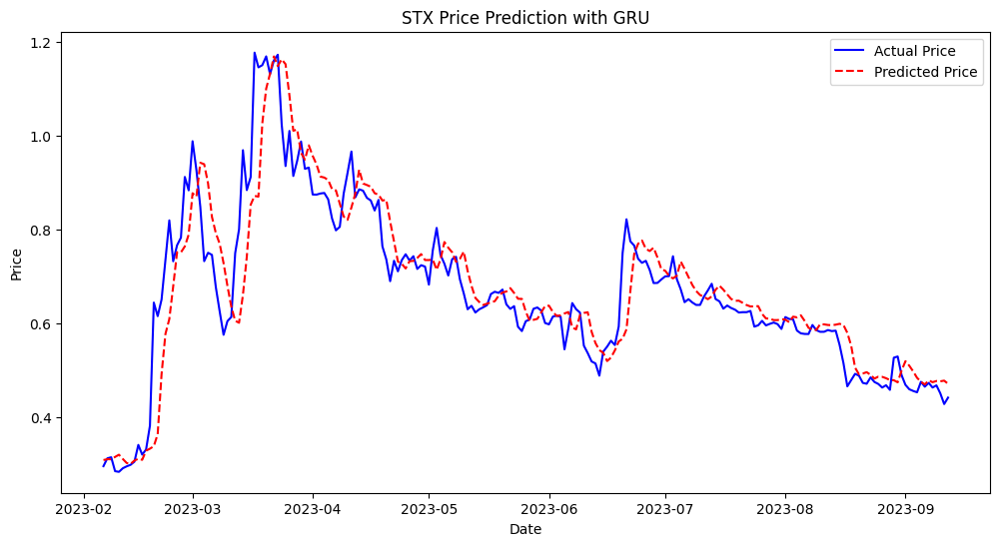

Metrics for GRU Model on STX: {'MSE': 0.0007322999370070938, 'MAE': 0.01762385908923441, 'RMSE': 0.027061040944632818, 'R2': 0.8156260648323543}


In [93]:
# Build the GRU model for STX
model_gru_stx = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_stx.shape[1], X_train_stx.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model for STX
model_gru_stx.compile(optimizer='adam', loss='mse')
history_gru_stx = model_gru_stx.fit(X_train_stx, y_train_stx, epochs=100, batch_size=32, validation_data=(X_validation_stx, y_validation_stx), callbacks=[early_stopping])

# Evaluate the model for STX
y_pred_gru_stx = model_gru_stx.predict(X_validation_stx).reshape(-1,1)
mse_gru_stx = mean_squared_error(y_validation_stx, y_pred_gru_stx)
mae_gru_stx = mean_absolute_error(y_validation_stx, y_pred_gru_stx)
rmse_gru_stx = np.sqrt(mse_gru_stx)
r2_gru_stx = r2_score(y_validation_stx, y_pred_gru_stx)

# Store metrics for GRU model on STX
metrics_gru_stx = {
    "MSE": mse_gru_stx,
    "MAE": mae_gru_stx,
    "RMSE": rmse_gru_stx,
    "R2": r2_gru_stx
}

# Visualize the actual vs. predicted values for GRU on STX
y_validation_actual_gru_stx = scaler_label.inverse_transform(y_validation_stx.reshape(-1, 1))
y_pred_actual_gru_stx = scaler_label.inverse_transform(y_pred_gru_stx)

# Plotting for GRU on STX
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_stx.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_stx.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('STX Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics for STX
print("Metrics for GRU Model on STX:", metrics_gru_stx)

## Bi-LSTM

Epoch 1/100
36/36 [==============================] - 1s 12ms/step - loss: 0.0124 - val_loss: 0.0022
Epoch 2/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0048 - val_loss: 0.0021
Epoch 3/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0039 - val_loss: 0.0033
Epoch 4/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 5/100
36/36 [==============================] - 0s 6ms/step - loss: 0.0029 - val_loss: 0.0029
Epoch 6/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0031 - val_loss: 0.0022
Epoch 7/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0030 - val_loss: 0.0030
Epoch 8/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0026 - val_loss: 0.0038
Epoch 9/100
36/36 [==============================] - 0s 5ms/step - loss: 0.0027 - val_loss: 0.0038
Epoch 10/100
36/36 [==============================] - 0s 6ms/step - loss: 0.0027 - val_loss: 0.0025
Epoch 11

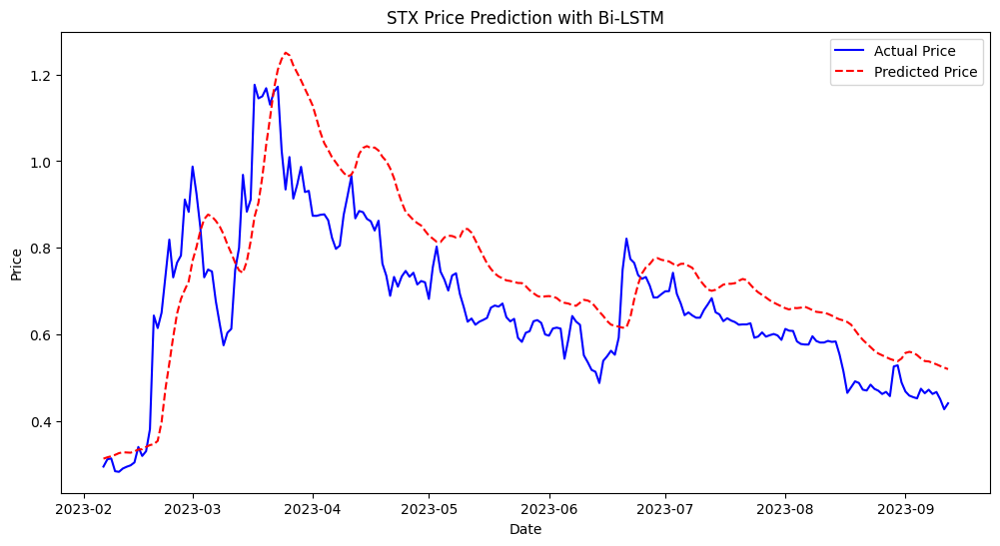

Metrics for Bi-LSTM Model on STX: {'MSE': 0.0021497380676157784, 'MAE': 0.03930599067426432, 'RMSE': 0.04636526790190884, 'R2': 0.45875228567420745}


In [94]:
# Build the Bi-LSTM model for STX
model_bilstm_stx = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_stx.shape[1], X_train_stx.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model for STX
model_bilstm_stx.compile(optimizer='adam', loss='mse')
history_bilstm_stx = model_bilstm_stx.fit(X_train_stx, y_train_stx, epochs=100, batch_size=32, validation_data=(X_validation_stx, y_validation_stx), callbacks=[early_stopping])

# Evaluate the model for STX
y_pred_bilstm_stx = model_bilstm_stx.predict(X_validation_stx).reshape(-1, 1)
mse_bilstm_stx = mean_squared_error(y_validation_stx, y_pred_bilstm_stx)
mae_bilstm_stx = mean_absolute_error(y_validation_stx, y_pred_bilstm_stx)
rmse_bilstm_stx = np.sqrt(mse_bilstm_stx)
r2_bilstm_stx = r2_score(y_validation_stx, y_pred_bilstm_stx)

# Store metrics for Bi-LSTM model on STX
metrics_bilstm_stx = {
    "MSE": mse_bilstm_stx,
    "MAE": mae_bilstm_stx,
    "RMSE": rmse_bilstm_stx,
    "R2": r2_bilstm_stx
}

# Visualize the actual vs. predicted values for Bi-LSTM on STX
y_validation_actual_bilstm_stx = scaler_label.inverse_transform(y_validation_stx.reshape(-1, 1))
y_pred_actual_bilstm_stx = scaler_label.inverse_transform(y_pred_bilstm_stx)

# Plotting for Bi-LSTM on STX
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_stx.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_stx.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('STX Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics for STX
print("Metrics for Bi-LSTM Model on STX:", metrics_bilstm_stx)

# 28. XLM

## LSTM

Epoch 1/100
78/78 [==============================] - 1s 7ms/step - loss: 0.0041 - val_loss: 7.1146e-04
Epoch 2/100
78/78 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 0.0013
Epoch 3/100
78/78 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 8.6823e-04
Epoch 4/100
78/78 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 5.6285e-04
Epoch 5/100
78/78 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 5.2633e-04
Epoch 6/100
78/78 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 6.1534e-04
Epoch 7/100
78/78 [==============================] - 0s 5ms/step - loss: 9.7721e-04 - val_loss: 3.7082e-04
Epoch 8/100
78/78 [==============================] - 0s 5ms/step - loss: 9.7012e-04 - val_loss: 4.7993e-04
Epoch 9/100
78/78 [==============================] - 0s 5ms/step - loss: 9.9371e-04 - val_loss: 9.7441e-04
Epoch 10/100
78/78 [==============================] - 0s 5ms/step

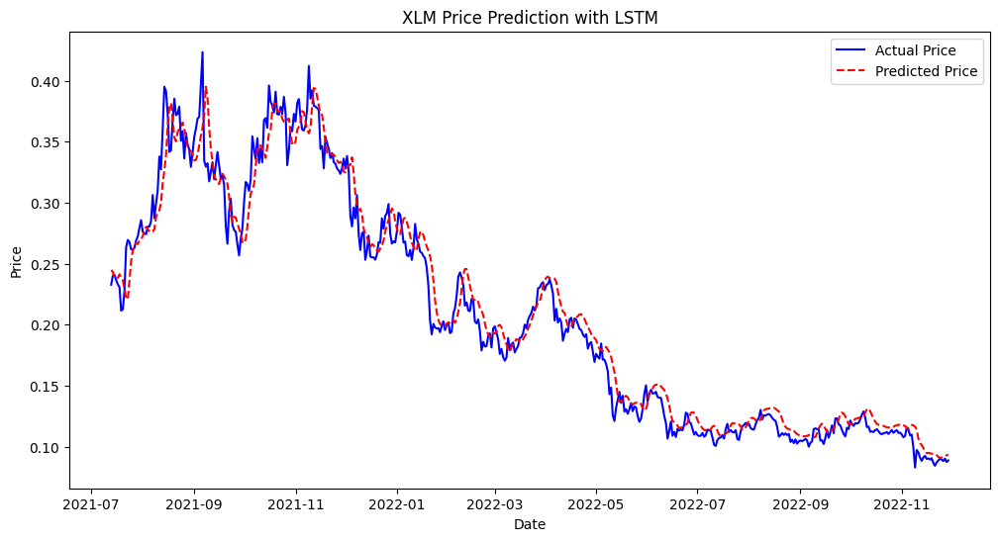

Metrics for LSTM Model on XLM: {'MSE': 0.0003560318743650432, 'MAE': 0.01360418462310573, 'RMSE': 0.018868806914191558, 'R2': 0.9679792023804416}


In [95]:
# Define features and target
xlm = get_crypto_data('XLM')
features = xlm.drop(["Close"], axis=1)
label = xlm["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_xlm_features, validation_label, test_xlm_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)


# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_xlm, y_train_xlm = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_xlm, y_validation_xlm = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model for XLM
model_lstm_xlm = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_xlm.shape[1], X_train_xlm.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_xlm.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_xlm = model_lstm_xlm.fit(X_train_xlm, y_train_xlm, epochs=100, batch_size=32, validation_data=(X_validation_xlm, y_validation_xlm), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_xlm = model_lstm_xlm.evaluate(X_validation_xlm, y_validation_xlm)

# Prediction
y_pred_lstm_xlm = model_lstm_xlm.predict(X_validation_xlm).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_xlm = mean_squared_error(y_validation_xlm, y_pred_lstm_xlm)
mae_lstm_xlm = mean_absolute_error(y_validation_xlm, y_pred_lstm_xlm)
rmse_lstm_xlm = np.sqrt(mse_lstm_xlm)
r2_lstm_xlm = r2_score(y_validation_xlm, y_pred_lstm_xlm)

# Store metrics for later comparison
metrics_lstm_xlm = {
    "MSE": mse_lstm_xlm,
    "MAE": mae_lstm_xlm,
    "RMSE": rmse_lstm_xlm,
    "R2": r2_lstm_xlm
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_xlm = scaler_label.inverse_transform(y_validation_xlm.reshape(-1, 1))
y_pred_actual_lstm_xlm = scaler_label.inverse_transform(y_pred_lstm_xlm)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_xlm.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_xlm.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('XLM Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on XLM:", metrics_lstm_xlm)

## GRU

Epoch 1/100
78/78 [==============================] - 1s 7ms/step - loss: 0.0041 - val_loss: 6.6295e-04
Epoch 2/100
78/78 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 4.9552e-04
Epoch 3/100
78/78 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 3.8860e-04
Epoch 4/100
78/78 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 3.4984e-04
Epoch 5/100
78/78 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 6.1435e-04
Epoch 6/100
78/78 [==============================] - 0s 5ms/step - loss: 9.6470e-04 - val_loss: 3.5359e-04
Epoch 7/100
78/78 [==============================] - 0s 5ms/step - loss: 9.5094e-04 - val_loss: 9.5134e-04
Epoch 8/100
78/78 [==============================] - 0s 5ms/step - loss: 8.3178e-04 - val_loss: 3.9465e-04
Epoch 9/100
78/78 [==============================] - 0s 5ms/step - loss: 9.3547e-04 - val_loss: 3.2572e-04
Epoch 10/100
78/78 [==============================] - 0s 

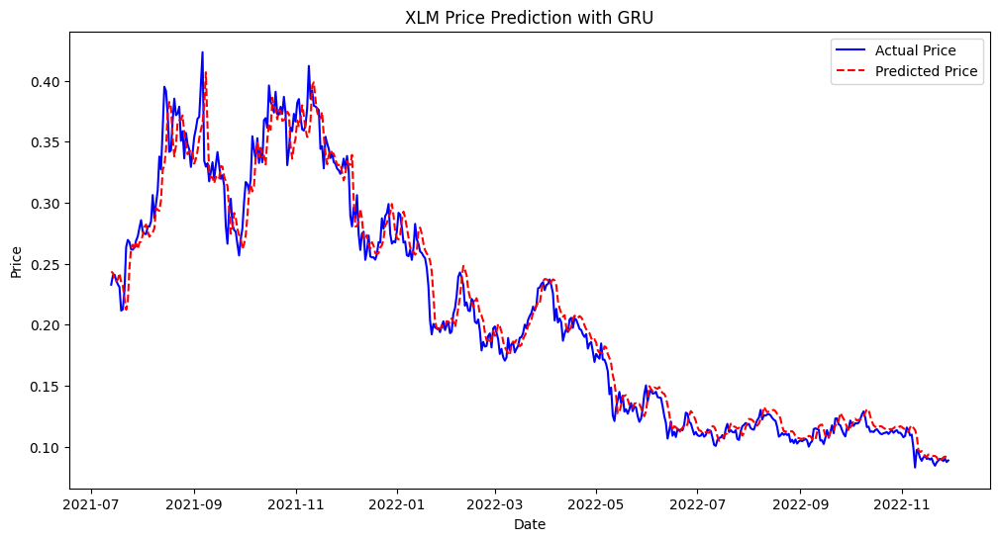

Metrics for GRU Model on XLM: {'MSE': 0.0003083717892935246, 'MAE': 0.012112185956842226, 'RMSE': 0.01756051791074297, 'R2': 0.9722656555002015}


In [96]:
# Build the GRU model for XLM
model_gru_xlm = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_xlm.shape[1], X_train_xlm.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model for XLM
model_gru_xlm.compile(optimizer='adam', loss='mse')
history_gru_xlm = model_gru_xlm.fit(X_train_xlm, y_train_xlm, epochs=100, batch_size=32, validation_data=(X_validation_xlm, y_validation_xlm), callbacks=[early_stopping])

# Evaluate the model for XLM
y_pred_gru_xlm = model_gru_xlm.predict(X_validation_xlm).reshape(-1,1)
mse_gru_xlm = mean_squared_error(y_validation_xlm, y_pred_gru_xlm)
mae_gru_xlm = mean_absolute_error(y_validation_xlm, y_pred_gru_xlm)
rmse_gru_xlm = np.sqrt(mse_gru_xlm)
r2_gru_xlm = r2_score(y_validation_xlm, y_pred_gru_xlm)

# Store metrics for GRU model on XLM
metrics_gru_xlm = {
    "MSE": mse_gru_xlm,
    "MAE": mae_gru_xlm,
    "RMSE": rmse_gru_xlm,
    "R2": r2_gru_xlm
}

# Visualize the actual vs. predicted values for GRU on XLM
y_validation_actual_gru_xlm = scaler_label.inverse_transform(y_validation_xlm.reshape(-1, 1))
y_pred_actual_gru_xlm = scaler_label.inverse_transform(y_pred_gru_xlm)

# Plotting for GRU on XLM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_xlm.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_xlm.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('XLM Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics for XLM
print("Metrics for GRU Model on XLM:", metrics_gru_xlm)

## Bi-LSTM

Epoch 1/100
78/78 [==============================] - 2s 8ms/step - loss: 0.0043 - val_loss: 0.0010
Epoch 2/100
78/78 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 4.9380e-04
Epoch 3/100
78/78 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 4.6198e-04
Epoch 4/100
78/78 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 4.9455e-04
Epoch 5/100
78/78 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 0.0010
Epoch 6/100
78/78 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 7.1447e-04
Epoch 7/100
78/78 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 4.1430e-04
Epoch 8/100
78/78 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 3.5587e-04
Epoch 9/100
78/78 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 4.4288e-04
Epoch 10/100
78/78 [==============================] - 0s 5ms/step - loss: 9.4729e

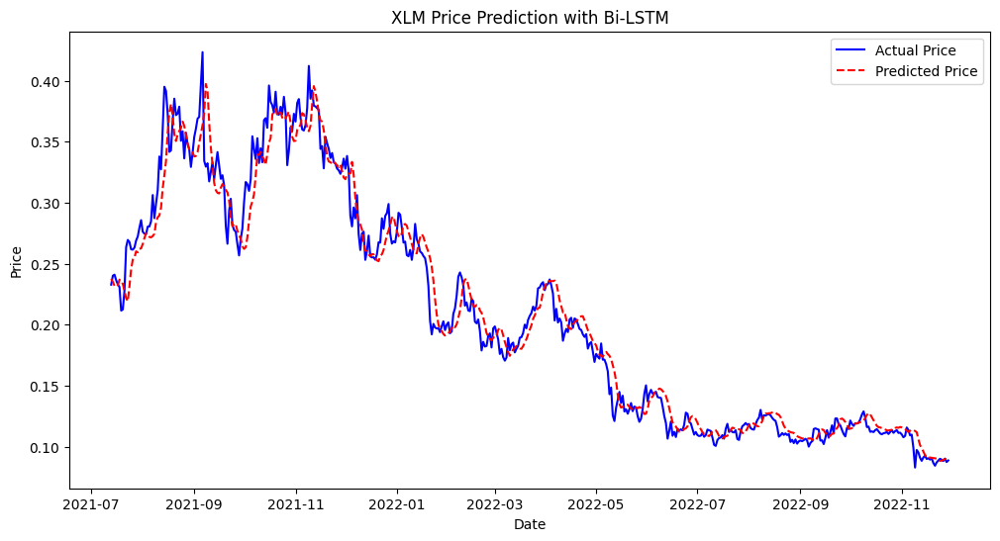

Metrics for Bi-LSTM Model on XLM: {'MSE': 0.00035586663327565727, 'MAE': 0.01303642943898713, 'RMSE': 0.018864427721923007, 'R2': 0.967994063834886}


In [97]:
# Build the Bi-LSTM model for XLM
model_bilstm_xlm = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_xlm.shape[1], X_train_xlm.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model for XLM
model_bilstm_xlm.compile(optimizer='adam', loss='mse')
history_bilstm_xlm = model_bilstm_xlm.fit(X_train_xlm, y_train_xlm, epochs=100, batch_size=32, validation_data=(X_validation_xlm, y_validation_xlm), callbacks=[early_stopping])

# Evaluate the model for XLM
y_pred_bilstm_xlm = model_bilstm_xlm.predict(X_validation_xlm).reshape(-1, 1)
mse_bilstm_xlm = mean_squared_error(y_validation_xlm, y_pred_bilstm_xlm)
mae_bilstm_xlm = mean_absolute_error(y_validation_xlm, y_pred_bilstm_xlm)
rmse_bilstm_xlm = np.sqrt(mse_bilstm_xlm)
r2_bilstm_xlm = r2_score(y_validation_xlm, y_pred_bilstm_xlm)

# Store metrics for Bi-LSTM model on XLM
metrics_bilstm_xlm = {
    "MSE": mse_bilstm_xlm,
    "MAE": mae_bilstm_xlm,
    "RMSE": rmse_bilstm_xlm,
    "R2": r2_bilstm_xlm
}

# Visualize the actual vs. predicted values for Bi-LSTM on XLM
y_validation_actual_bilstm_xlm = scaler_label.inverse_transform(y_validation_xlm.reshape(-1, 1))
y_pred_actual_bilstm_xlm = scaler_label.inverse_transform(y_pred_bilstm_xlm)

# Plotting for Bi-LSTM on XLM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_xlm.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_xlm.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('XLM Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics for XLM
print("Metrics for Bi-LSTM Model on XLM:", metrics_bilstm_xlm)

# 29. QNT

## LSTM

Epoch 1/100
46/46 [==============================] - 1s 8ms/step - loss: 0.0030 - val_loss: 9.4815e-04
Epoch 2/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 8.8096e-04
Epoch 3/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 0.0011
Epoch 4/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 8.2321e-04
Epoch 5/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 8.4056e-04
Epoch 6/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 7.0739e-04
Epoch 7/100
46/46 [==============================] - 0s 5ms/step - loss: 9.8301e-04 - val_loss: 0.0017
Epoch 8/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 7.8229e-04
Epoch 9/100
46/46 [==============================] - 0s 5ms/step - loss: 8.8476e-04 - val_loss: 7.7305e-04
Epoch 10/100
46/46 [==============================] - 0s 5ms/step - loss:

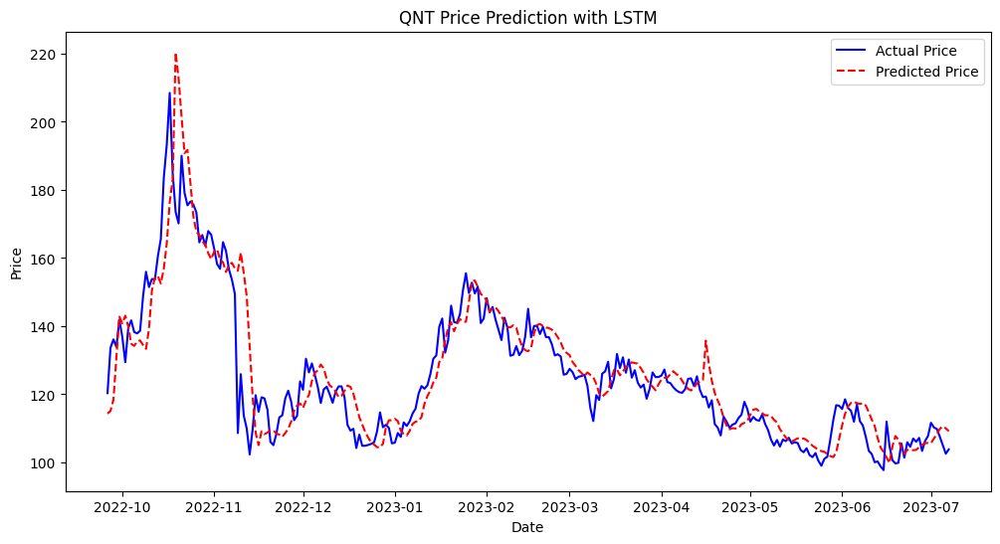

Metrics for LSTM Model on QNT: {'MSE': 0.0005680988561851705, 'MAE': 0.01533562444966262, 'RMSE': 0.02383482444208831, 'R2': 0.7820370452771247}


In [98]:
# Define features and target for QNT
qnt = get_crypto_data('QNT')
features = qnt.drop(["Close"], axis=1)
label = qnt["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_qnt_features, validation_label, test_qnt_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)


# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_qnt, y_train_qnt = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_qnt, y_validation_qnt = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model for QNT
model_lstm_qnt = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_qnt.shape[1], X_train_qnt.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_qnt.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_qnt = model_lstm_qnt.fit(X_train_qnt, y_train_qnt, epochs=100, batch_size=32, validation_data=(X_validation_qnt, y_validation_qnt), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_qnt = model_lstm_qnt.evaluate(X_validation_qnt, y_validation_qnt)

# prediction
y_pred_lstm_qnt = model_lstm_qnt.predict(X_validation_qnt).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_qnt = mean_squared_error(y_validation_qnt, y_pred_lstm_qnt)
mae_lstm_qnt = mean_absolute_error(y_validation_qnt, y_pred_lstm_qnt)
rmse_lstm_qnt = np.sqrt(mse_lstm_qnt)
r2_lstm_qnt = r2_score(y_validation_qnt, y_pred_lstm_qnt)

# Store metrics for later comparison
metrics_lstm_qnt = {
    "MSE": mse_lstm_qnt,
    "MAE": mae_lstm_qnt,
    "RMSE": rmse_lstm_qnt,
    "R2": r2_lstm_qnt
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_qnt = scaler_label.inverse_transform(y_validation_qnt.reshape(-1, 1))
y_pred_actual_lstm_qnt = scaler_label.inverse_transform(y_pred_lstm_qnt)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_qnt.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_qnt.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('QNT Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on QNT:", metrics_lstm_qnt)

## GRU

Epoch 1/100
46/46 [==============================] - 1s 8ms/step - loss: 0.0188 - val_loss: 8.0336e-04
Epoch 2/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 6.5860e-04
Epoch 3/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 8.9304e-04
Epoch 4/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 6.8148e-04
Epoch 5/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 6.8001e-04
Epoch 6/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 8.8117e-04
Epoch 7/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 7.1550e-04
Epoch 8/100
46/46 [==============================] - 0s 5ms/step - loss: 9.7960e-04 - val_loss: 6.4233e-04
Epoch 9/100
46/46 [==============================] - 0s 5ms/step - loss: 9.2717e-04 - val_loss: 8.2196e-04
Epoch 10/100
46/46 [==============================] - 0s 5ms/step

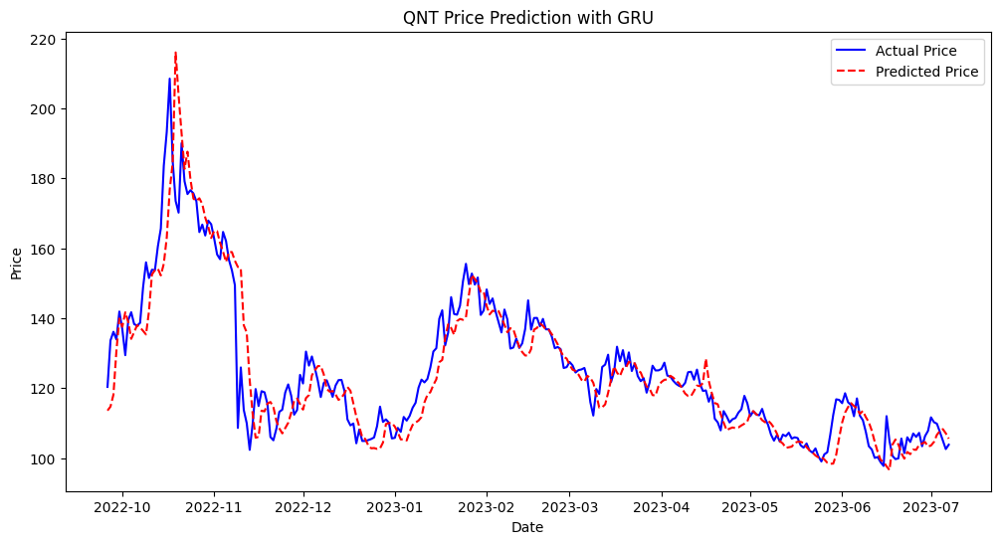

Metrics for GRU Model on QNT: {'MSE': 0.00044652077091056927, 'MAE': 0.013588876188560304, 'RMSE': 0.02113103809353836, 'R2': 0.8286830091045265}


In [99]:
# Build the GRU model
model_gru_qnt = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_qnt.shape[1], X_train_qnt.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model
model_gru_qnt.compile(optimizer='adam', loss='mse')
history_gru_qnt = model_gru_qnt.fit(X_train_qnt, y_train_qnt, epochs=100, batch_size=32, validation_data=(X_validation_qnt, y_validation_qnt), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_qnt = model_gru_qnt.predict(X_validation_qnt).reshape(-1,1)
mse_gru_qnt = mean_squared_error(y_validation_qnt, y_pred_gru_qnt)
mae_gru_qnt = mean_absolute_error(y_validation_qnt, y_pred_gru_qnt)
rmse_gru_qnt = np.sqrt(mse_gru_qnt)
r2_gru_qnt = r2_score(y_validation_qnt, y_pred_gru_qnt)

# Store metrics
metrics_gru_qnt = {
    "MSE": mse_gru_qnt,
    "MAE": mae_gru_qnt,
    "RMSE": rmse_gru_qnt,
    "R2": r2_gru_qnt
}

# Visualize the actual vs. predicted values for GRU
y_validation_actual_gru_qnt = scaler_label.inverse_transform(y_validation_qnt.reshape(-1, 1))
y_pred_actual_gru_qnt = scaler_label.inverse_transform(y_pred_gru_qnt)

# Plotting for GRU
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_qnt.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_qnt.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('QNT Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics
print("Metrics for GRU Model on QNT:", metrics_gru_qnt)

## Bi-LSTM

Epoch 1/100
46/46 [==============================] - 1s 11ms/step - loss: 0.0071 - val_loss: 0.0020
Epoch 2/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0024 - val_loss: 0.0018
Epoch 3/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 0.0011
Epoch 4/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 5/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 0.0010
Epoch 6/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 8.5118e-04
Epoch 7/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 8.1844e-04
Epoch 8/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 8.4997e-04
Epoch 9/100
46/46 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 7.3301e-04
Epoch 10/100
46/46 [==============================] - 0s 5ms/step - loss: 8.7589e-04 - val_l

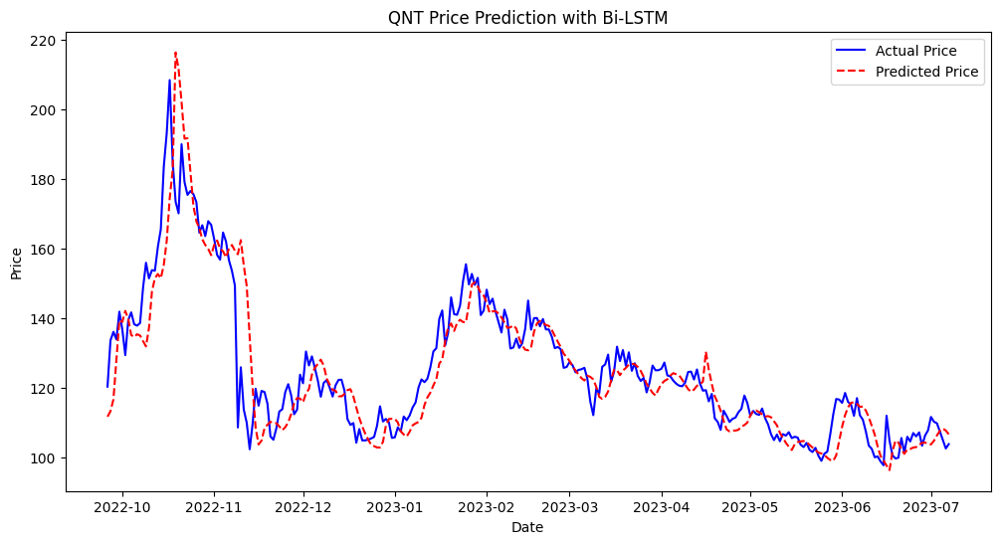

Metrics for Bi-LSTM Model on QNT: {'MSE': 0.0005807793149043658, 'MAE': 0.015216563269398058, 'RMSE': 0.024099363371349995, 'R2': 0.7771719232660774}


In [100]:
# Build the Bi-LSTM model
model_bilstm_qnt = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_qnt.shape[1], X_train_qnt.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_qnt.compile(optimizer='adam', loss='mse')
history_bilstm_qnt = model_bilstm_qnt.fit(X_train_qnt, y_train_qnt, epochs=100, batch_size=32, validation_data=(X_validation_qnt, y_validation_qnt), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_qnt = model_bilstm_qnt.predict(X_validation_qnt).reshape(-1, 1)
mse_bilstm_qnt = mean_squared_error(y_validation_qnt, y_pred_bilstm_qnt)
mae_bilstm_qnt = mean_absolute_error(y_validation_qnt, y_pred_bilstm_qnt)
rmse_bilstm_qnt = np.sqrt(mse_bilstm_qnt)
r2_bilstm_qnt = r2_score(y_validation_qnt, y_pred_bilstm_qnt)

# Store metrics
metrics_bilstm_qnt = {
    "MSE": mse_bilstm_qnt,
    "MAE": mae_bilstm_qnt,
    "RMSE": rmse_bilstm_qnt,
    "R2": r2_bilstm_qnt
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_qnt = scaler_label.inverse_transform(y_validation_qnt.reshape(-1, 1))
y_pred_actual_bilstm_qnt = scaler_label.inverse_transform(y_pred_bilstm_qnt)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_qnt.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_qnt.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('QNT Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on QNT:", metrics_bilstm_qnt)

# 30. NEO

## LSTM

Epoch 1/100
61/61 [==============================] - 1s 8ms/step - loss: 0.0026 - val_loss: 1.0366e-04
Epoch 2/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 7.8571e-05
Epoch 3/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 4.6079e-05
Epoch 4/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 4.4508e-05
Epoch 5/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 4.8205e-05
Epoch 6/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 8.5436e-05
Epoch 7/100
61/61 [==============================] - 0s 5ms/step - loss: 9.5346e-04 - val_loss: 5.5190e-05
Epoch 8/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 3.5531e-05
Epoch 9/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 4.6615e-05
Epoch 10/100
61/61 [==============================] - 0s 5ms/step - l

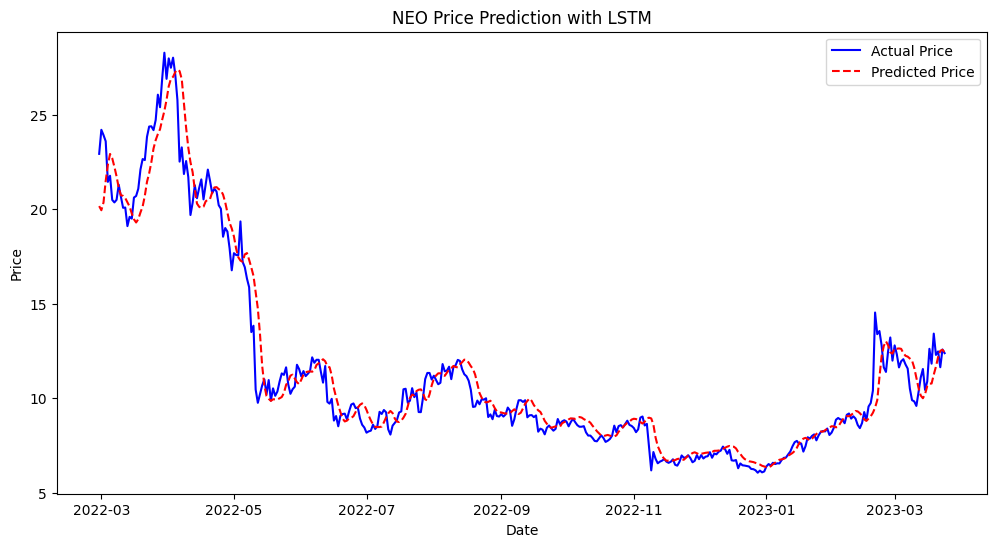

Metrics for LSTM Model on NEO: {'MSE': 3.5531480620853936e-05, 'MAE': 0.0038681719824270933, 'RMSE': 0.005960828853511392, 'R2': 0.9544983212778263}


In [101]:
# Define features and target
neo = get_crypto_data('NEO')
features = neo.drop(["Close"], axis=1)
label = neo["Close"]

# Splitting features and label into training, validation, and test sets *70%, 15%, and 15% respectively)
train_features, reserved_features, train_label, reserved_label = train_test_split(features, label, test_size=0.3, shuffle=False)
validation_features, test_neo_features, validation_label, test_neo_label = train_test_split(reserved_features, reserved_label, test_size=0.5, shuffle=False)

# Instantiate a MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on training features to avoid data leakage
scaler.fit(train_features)

# Transform the training and validationing features
train_features_scaled = scaler.transform(train_features) 
validation_features_scaled = scaler.transform(validation_features)

# Scale the label (target)
scaler_label = MinMaxScaler()
train_label_scaled = scaler_label.fit_transform(train_label.values.reshape(-1, 1))
validation_label_scaled = scaler_label.transform(validation_label.values.reshape(-1, 1))

# Define the function to create window input with a given lookback and two days prediction
def sliding_window(data, label, lookback):
    X, y = [], []
    for i in range(len(data) - lookback - 1):
        X.append(data[i:i + lookback])
        y.append(label[i + lookback + 1])
    return np.array(X), np.array(y)

# Define lookback period
lookback = 30

# Create LSTM input for training and validationing using scaled label
X_train_neo, y_train_neo = sliding_window(train_features_scaled, train_label_scaled.flatten(), lookback)
X_validation_neo, y_validation_neo = sliding_window(validation_features_scaled, validation_label_scaled.flatten(), lookback)

# Build the LSTM model for NEO
model_lstm_neo = Sequential([
    LSTM(50, activation='tanh', return_sequences=False, input_shape=(X_train_neo.shape[1], X_train_neo.shape[2])),
    Dropout(0.1), # Dropout for regularization
    Dense(1) # Output layer that predicts the price
])

# Compile the model with Adam optimizer and MSE loss function
model_lstm_neo.compile(optimizer='adam', loss="mse")

# Setting up early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for 100 epochs with a batch size of 32
history_lstm_neo = model_lstm_neo.fit(X_train_neo, y_train_neo, epochs=100, batch_size=32, validation_data=(X_validation_neo, y_validation_neo), 
                             verbose=1, callbacks=[early_stopping])

# Evaluate the model on the validation set
loss_lstm_neo = model_lstm_neo.evaluate(X_validation_neo, y_validation_neo)

# Prediction
y_pred_lstm_neo = model_lstm_neo.predict(X_validation_neo).reshape(-1, 1)  # Reshape for inverse transformation

# Calculate metrics on scaled data
mse_lstm_neo = mean_squared_error(y_validation_neo, y_pred_lstm_neo)
mae_lstm_neo = mean_absolute_error(y_validation_neo, y_pred_lstm_neo)
rmse_lstm_neo = np.sqrt(mse_lstm_neo)
r2_lstm_neo = r2_score(y_validation_neo, y_pred_lstm_neo)

# Store metrics for later comparison
metrics_lstm_neo = {
    "MSE": mse_lstm_neo,
    "MAE": mae_lstm_neo,
    "RMSE": rmse_lstm_neo,
    "R2": r2_lstm_neo
}

# Inverse transform predictions and actual values to their original scale
y_validation_actual_lstm_neo = scaler_label.inverse_transform(y_validation_neo.reshape(-1, 1))
y_pred_actual_lstm_neo = scaler_label.inverse_transform(y_pred_lstm_neo)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_lstm_neo.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_lstm_neo.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('NEO Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print metrics
print("Metrics for LSTM Model on NEO:", metrics_lstm_neo)

## GRU

Epoch 1/100
61/61 [==============================] - 1s 8ms/step - loss: 0.0122 - val_loss: 5.9115e-05
Epoch 2/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 5.6230e-05
Epoch 3/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 6.6905e-05
Epoch 4/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 6.9028e-05
Epoch 5/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 4.6830e-05
Epoch 6/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 1.5315e-04
Epoch 7/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 1.2395e-04
Epoch 8/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 2.7561e-04
Epoch 9/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 4.1603e-05
Epoch 10/100
61/61 [==============================] - 0s 5ms/step - loss:

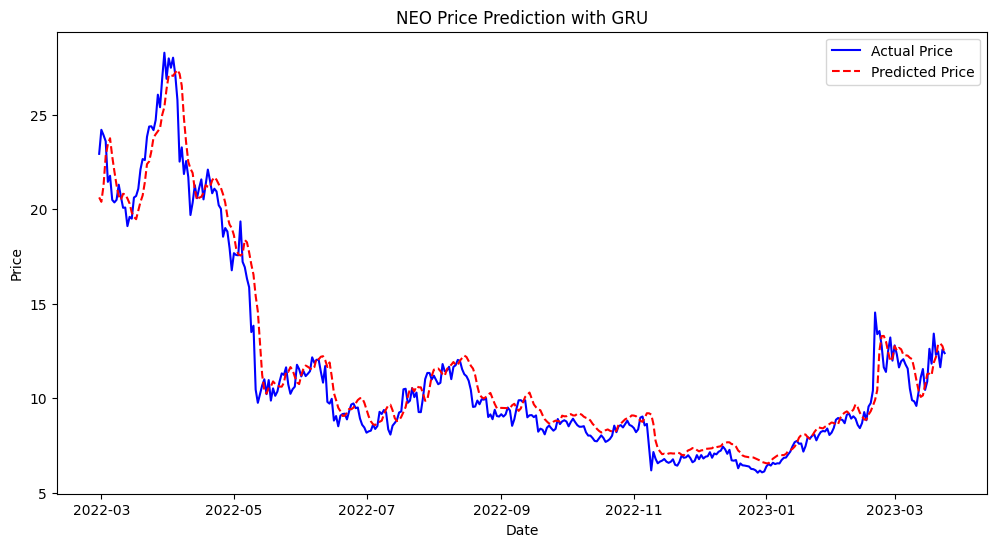

Metrics for GRU Model on NEO: {'MSE': 3.207078528760391e-05, 'MAE': 0.003952000663097966, 'RMSE': 0.005663107387963247, 'R2': 0.9589300940173066}


In [102]:
# Build the GRU model for NEO
model_gru_neo = Sequential([
    GRU(50, activation='tanh', return_sequences=False, input_shape=(X_train_neo.shape[1], X_train_neo.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the GRU model for NEO
model_gru_neo.compile(optimizer='adam', loss='mse')
history_gru_neo = model_gru_neo.fit(X_train_neo, y_train_neo, epochs=100, batch_size=32, validation_data=(X_validation_neo, y_validation_neo), callbacks=[early_stopping])

# Evaluate the model
y_pred_gru_neo = model_gru_neo.predict(X_validation_neo).reshape(-1,1)
mse_gru_neo = mean_squared_error(y_validation_neo, y_pred_gru_neo)
mae_gru_neo = mean_absolute_error(y_validation_neo, y_pred_gru_neo)
rmse_gru_neo = np.sqrt(mse_gru_neo)
r2_gru_neo = r2_score(y_validation_neo, y_pred_gru_neo)

# Store metrics
metrics_gru_neo = {
    "MSE": mse_gru_neo,
    "MAE": mae_gru_neo,
    "RMSE": rmse_gru_neo,
    "R2": r2_gru_neo
}

# Visualize the actual vs. predicted values for GRU on NEO
y_validation_actual_gru_neo = scaler_label.inverse_transform(y_validation_neo.reshape(-1, 1))
y_pred_actual_gru_neo = scaler_label.inverse_transform(y_pred_gru_neo)

# Plotting for GRU on NEO
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_gru_neo.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_gru_neo.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('NEO Price Prediction with GRU')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print GRU metrics for NEO
print("Metrics for GRU Model on NEO:", metrics_gru_neo)

## Bi-LSTM

Epoch 1/100
61/61 [==============================] - 2s 9ms/step - loss: 0.0070 - val_loss: 9.8343e-05
Epoch 2/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0022 - val_loss: 1.7131e-04
Epoch 3/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 5.8383e-05
Epoch 4/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 7.5966e-05
Epoch 5/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 4.8469e-05
Epoch 6/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 6.7090e-05
Epoch 7/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 9.1819e-05
Epoch 8/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 1.0985e-04
Epoch 9/100
61/61 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 1.2131e-04
Epoch 10/100
61/61 [==============================] - 0s 5ms/step - loss:

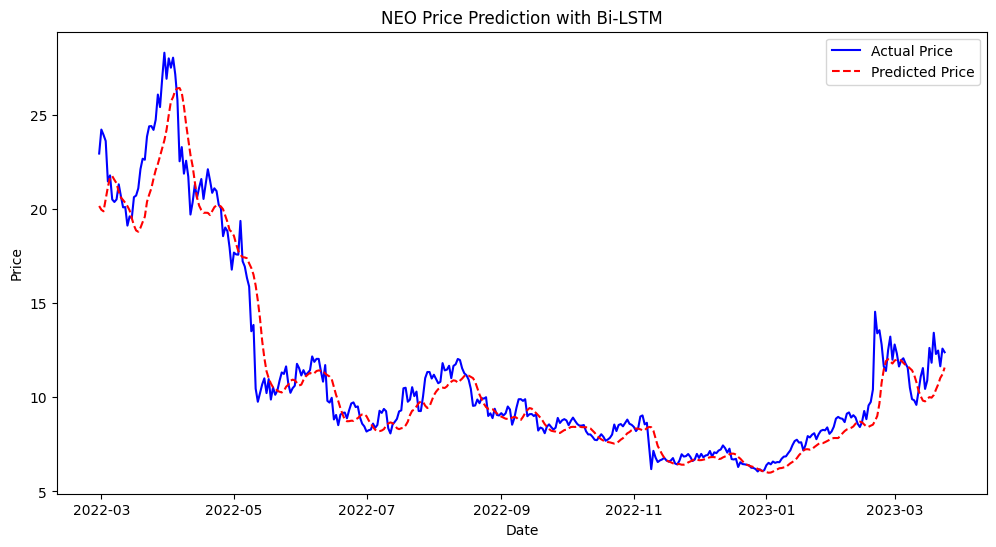

Metrics for Bi-LSTM Model on NEO: {'MSE': 4.846883057783589e-05, 'MAE': 0.0045975754973954525, 'RMSE': 0.006961955944835898, 'R2': 0.9379307273872013}


In [103]:
# Build the Bi-LSTM model
model_bilstm_neo = Sequential([
    Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(X_train_neo.shape[1], X_train_neo.shape[2])),
    Dropout(0.1),
    Dense(1)
])

# Compile and train the Bi-LSTM model
model_bilstm_neo.compile(optimizer='adam', loss='mse')
history_bilstm_neo = model_bilstm_neo.fit(X_train_neo, y_train_neo, epochs=100, batch_size=32, validation_data=(X_validation_neo, y_validation_neo), callbacks=[early_stopping])

# Evaluate the model
y_pred_bilstm_neo = model_bilstm_neo.predict(X_validation_neo).reshape(-1, 1)
mse_bilstm_neo = mean_squared_error(y_validation_neo, y_pred_bilstm_neo)
mae_bilstm_neo = mean_absolute_error(y_validation_neo, y_pred_bilstm_neo)
rmse_bilstm_neo = np.sqrt(mse_bilstm_neo)
r2_bilstm_neo = r2_score(y_validation_neo, y_pred_bilstm_neo)

# Store metrics
metrics_bilstm_neo = {
    "MSE": mse_bilstm_neo,
    "MAE": mae_bilstm_neo,
    "RMSE": rmse_bilstm_neo,
    "R2": r2_bilstm_neo
}

# Visualize the actual vs. predicted values for Bi-LSTM
y_validation_actual_bilstm_neo = scaler_label.inverse_transform(y_validation_neo.reshape(-1, 1))
y_pred_actual_bilstm_neo = scaler_label.inverse_transform(y_pred_bilstm_neo)

# Plotting for Bi-LSTM
plt.figure(figsize=(12, 6))
plt.plot(validation_label.index[lookback + 1:], y_validation_actual_bilstm_neo.flatten(), label="Actual Price", color='blue')
plt.plot(validation_label.index[lookback + 1:], y_pred_actual_bilstm_neo.flatten(), label="Predicted Price", linestyle='--', color='red')
plt.title('NEO Price Prediction with Bi-LSTM')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

# Print Bi-LSTM metrics
print("Metrics for Bi-LSTM Model on NEO:", metrics_bilstm_neo)

# B) Collecting individual performance metrics and trained models

In [104]:
# Creating dictionary to hold all metrics and models
all_metrics = {}
all_models = {}
all_predictions = {}

# List all cryptos
cryptos = ["BTC", "ETH", "BNB", "ADA", "SOL", "XRP", "LTC","LINK", "DOGE", "SHIB", 
            "MANA", "VET", "XMR", "BCH", "AVAX", "TRX", "MATIC", "CRO", "RNDR", "XTZ", 
            "BAT", "SC", "FTM","DCR","MKR", "ATOM","STX", "XLM", "QNT", "NEO"]
# List of models
model_types = ['lstm', 'gru', 'bilstm']

for crypto in cryptos:
    # Initialize sub-dictionaries for each crypto
    all_metrics[crypto]  = {}
    all_models[crypto] = {}
    all_predictions[crypto] = {}
    
    for model_type in model_types:
        # collect trained model and metrics with correct variable names
        model = eval(f'model_{model_type}_{crypto.lower()}')
        metrics = eval(f'metrics_{model_type}_{crypto.lower()}')
        predictions = eval(f'y_pred_{model_type}_{crypto.lower()}')
        
        # store the model and metrics in the respective dictionaries
        all_models[crypto][model_type] = model
        all_metrics[crypto][model_type] = metrics
        all_predictions[crypto][model_type] = predictions

# Save the dictionaries into a pickle file
with open('crypto_metrics_models_predictions.pkl', 'wb') as f:
    pickle.dump({'all_metrics': all_metrics, 'all_models': all_models, 'all_predictions': all_predictions}, f)

    
"""
# Load the dictionaries from the pickle file
with open('crypto_metrics_models.pkl', 'rb') as f:
    data = pickle.load(f)
    all_metrics = data['all_metrics']
    all_models = data['all_models']

# Now you can access all_metrics and all_models as needed
print(all_metrics)
print(all_models)

"""

"\n# Load the dictionaries from the pickle file\nwith open('crypto_metrics_models.pkl', 'rb') as f:\n    data = pickle.load(f)\n    all_metrics = data['all_metrics']\n    all_models = data['all_models']\n\n# Now you can access all_metrics and all_models as needed\nprint(all_metrics)\nprint(all_models)\n\n"

## Building DataFrame for each performance metrics

## a) Mean Sqaued Error (MSE)

In [106]:
# Create DataFrame to hold the data
selected_model_mse = {'Crypto': [], 'LSTM_MSE': [], 'GRU_MSE': [], 'Bi-LSTM_MSE': [], 'Best Model': []}

for crypto, metrics in all_metrics.items():
    selected_model_mse['Crypto'].append(crypto)
    selected_model_mse['LSTM_MSE'].append(metrics['lstm']['MSE'])
    selected_model_mse['GRU_MSE'].append(metrics['gru']['MSE'])
    selected_model_mse['Bi-LSTM_MSE'].append(metrics['bilstm']['MSE'])
    
    # Determine the best model
    best_model_type = min(metrics, key=lambda x: metrics[x]['MSE'])
    selected_model_mse['Best Model'].append(best_model_type.capitalize())  # Capitalize the model name

# Convert to DataFrame
df = pd.DataFrame(selected_model_mse)

# Set Crypto as the index
df.set_index('Crypto', inplace=True)

# Print the DataFrame
print(df)

        LSTM_MSE   GRU_MSE  Bi-LSTM_MSE Best Model
Crypto                                            
BTC     0.032810  0.022741     0.046717        Gru
ETH     0.001559  0.001451     0.001784        Gru
BNB     0.000506  0.000379     0.000423        Gru
ADA     0.000051  0.000050     0.000054        Gru
SOL     0.000027  0.000027     0.000027        Gru
XRP     0.000745  0.000648     0.000815        Gru
LTC     0.001483  0.001531     0.001675       Lstm
LINK    0.000073  0.000107     0.000067     Bilstm
DOGE    1.378571  0.377984     1.391379        Gru
SHIB    0.000030  0.000027     0.000041        Gru
MANA    0.000106  0.000083     0.000096        Gru
VET     0.000034  0.000024     0.000026        Gru
XMR     0.000915  0.000793     0.000825        Gru
BCH     0.000004  0.000006     0.000005       Lstm
AVAX    0.000023  0.000024     0.000023       Lstm
TRX     0.000084  0.000079     0.000109        Gru
MATIC   0.000348  0.000315     0.000337        Gru
CRO     0.000039  0.000032     

## b) Mean Absolute Error (MAE)

In [107]:
# Create DataFrame to hold the data
selected_model_mae = {'Crypto': [], 'LSTM_MAE': [], 'GRU_MAE': [], 'Bi-LSTM_MAE': [], 'Best Model': []}

for crypto, metrics in all_metrics.items():
    selected_model_mae['Crypto'].append(crypto)
    selected_model_mae['LSTM_MAE'].append(metrics['lstm']['MAE'])
    selected_model_mae['GRU_MAE'].append(metrics['gru']['MAE'])
    selected_model_mae['Bi-LSTM_MAE'].append(metrics['bilstm']['MAE'])
    
    # Determine the best model
    best_model_type = min(metrics, key=lambda x: metrics[x]['MAE'])
    selected_model_mae['Best Model'].append(best_model_type.capitalize())  # Capitalize the model name

# Convert to DataFrame
df = pd.DataFrame(selected_model_mae)

# Set Crypto as the index
df.set_index('Crypto', inplace=True)

# Print the DataFrame
print(df)

        LSTM_MAE   GRU_MAE  Bi-LSTM_MAE Best Model
Crypto                                            
BTC     0.125175  0.103222     0.148296        Gru
ETH     0.029283  0.028272     0.032057        Gru
BNB     0.016702  0.014023     0.015231        Gru
ADA     0.005292  0.005248     0.005517        Gru
SOL     0.003971  0.003802     0.003836        Gru
XRP     0.017655  0.015321     0.017780        Gru
LTC     0.024545  0.025139     0.026258       Lstm
LINK    0.006562  0.008278     0.006211     Bilstm
DOGE    0.711919  0.362084     0.721888        Gru
SHIB    0.003644  0.003447     0.004638        Gru
MANA    0.007410  0.006308     0.006836        Gru
VET     0.004328  0.003496     0.003715        Gru
XMR     0.021517  0.020175     0.020375        Gru
BCH     0.001449  0.001770     0.001549       Lstm
AVAX    0.003372  0.003531     0.003445       Lstm
TRX     0.006586  0.006248     0.007449        Gru
MATIC   0.013614  0.012519     0.013500        Gru
CRO     0.003845  0.003554     

## c) Root Mean Squared Error (RMSE)

In [108]:
# Create DataFrame to hold the data
selected_model_rmse = {'Crypto': [], 'LSTM_RMSE': [], 'GRU_RMSE': [], 'Bi-LSTM_RMSE': [], 'Best Model': []}

for crypto, metrics in all_metrics.items():
    selected_model_rmse['Crypto'].append(crypto)
    selected_model_rmse['LSTM_RMSE'].append(metrics['lstm']['RMSE'])
    selected_model_rmse['GRU_RMSE'].append(metrics['gru']['RMSE'])
    selected_model_rmse['Bi-LSTM_RMSE'].append(metrics['bilstm']['RMSE'])
    
    # Determine the best model
    best_model_type = min(metrics, key=lambda x: metrics[x]['RMSE'])
    selected_model_rmse['Best Model'].append(best_model_type.capitalize())  # Capitalize the model name

# Convert to DataFrame
df = pd.DataFrame(selected_model_rmse)

# Set Crypto as the index
df.set_index('Crypto', inplace=True)

# Print the DataFrame
print(df)

        LSTM_RMSE  GRU_RMSE  Bi-LSTM_RMSE Best Model
Crypto                                              
BTC      0.181134  0.150802      0.216140        Gru
ETH      0.039479  0.038093      0.042235        Gru
BNB      0.022489  0.019465      0.020575        Gru
ADA      0.007114  0.007075      0.007359        Gru
SOL      0.005234  0.005156      0.005217        Gru
XRP      0.027299  0.025451      0.028544        Gru
LTC      0.038510  0.039132      0.040925       Lstm
LINK     0.008545  0.010337      0.008212     Bilstm
DOGE     1.174126  0.614804      1.179567        Gru
SHIB     0.005497  0.005199      0.006417        Gru
MANA     0.010295  0.009103      0.009803        Gru
VET      0.005838  0.004931      0.005106        Gru
XMR      0.030242  0.028166      0.028730        Gru
BCH      0.002049  0.002419      0.002150       Lstm
AVAX     0.004817  0.004914      0.004841       Lstm
TRX      0.009162  0.008869      0.010464        Gru
MATIC    0.018643  0.017747      0.018359     

## d) Coefficient of Determination (R^2)

In [109]:
# Create DataFrame to hold the data
selected_model_r2 = {'Crypto': [], 'LSTM_R2': [], 'GRU_R2': [], 'Bi-LSTM_R2': [], 'Best Model': []}

for crypto, metrics in all_metrics.items():
    selected_model_r2['Crypto'].append(crypto)
    selected_model_r2['LSTM_R2'].append(metrics['lstm']['R2'])
    selected_model_r2['GRU_R2'].append(metrics['gru']['R2'])
    selected_model_r2['Bi-LSTM_R2'].append(metrics['bilstm']['R2'])
    
    # Determine the best model
    best_model_type = min(metrics, key=lambda x: metrics[x]['R2'])
    selected_model_r2['Best Model'].append(best_model_type.capitalize())  # Capitalize the model name

# Convert to DataFrame
df = pd.DataFrame(selected_model_r2)

# Set Crypto as the index
df.set_index('Crypto', inplace=True)

# Print the DataFrame
print(df)

         LSTM_R2    GRU_R2  Bi-LSTM_R2 Best Model
Crypto                                           
BTC     0.960357  0.972523    0.943554     Bilstm
ETH     0.976122  0.977770    0.972673     Bilstm
BNB     0.768882  0.826864    0.806548       Lstm
ADA     0.913425  0.914378    0.907365     Bilstm
SOL     0.737965  0.745709    0.739671       Lstm
XRP     0.921756  0.931989    0.914457     Bilstm
LTC     0.956919  0.955517    0.951347     Bilstm
LINK    0.569642  0.370240    0.602537        Gru
DOGE    0.233870  0.789938    0.226752     Bilstm
SHIB    0.757890  0.783460    0.670064     Bilstm
MANA    0.912591  0.931665    0.920744       Lstm
VET     0.796568  0.854912    0.844405       Lstm
XMR     0.915295  0.926528    0.923554       Lstm
BCH     0.727633  0.620397    0.700122        Gru
AVAX    0.893927  0.889608    0.892843        Gru
TRX     0.861427  0.870142    0.819252     Bilstm
MATIC   0.937401  0.943277    0.939295       Lstm
CRO     0.766783  0.808119    0.744486     Bilstm


# C) Building the final ensemble model using average method

## a) Build the Final Ensemble Model using Simple Average

create an ensemble prediction by averaging the predictions of your LSTM, GRU, and Bi-LSTM models for each cryptocurrency. Here's how you can do it:

In [110]:
# Initialize dictionary to hold final ensemble predictions
ensemble_predictions = {}

for crypto in cryptos:
    # Get predictions for each model type
    lstm_preds = all_predictions[crypto]['lstm']
    gru_preds = all_predictions[crypto]['gru']
    bilstm_preds = all_predictions[crypto]['bilstm']
    
    # Calculate the average of the predictions
    ensemble_pred = (lstm_preds + gru_preds + bilstm_preds) / 3
    ensemble_predictions[crypto] = ensemble_pred

## b) Prepare the Test Features and Labels for Evaluation

In [111]:
# Initialize dictionaries to hold test features and labels
test_features_scaled = {}
test_labels_scaled = {}

for crypto in cryptos:
    # Load data
    test_features = eval(f'test_{crypto.lower()}_features')
    test_labels = eval(f'test_{crypto.lower()}_label')
    
    # Scale features and labels
    scaler = MinMaxScaler()
    scaler.fit(train_features)  # Use the scaler fitted on training data
    
    test_features_scaled[crypto] = scaler.transform(test_features)
    test_labels_scaled[crypto] = scaler_label.transform(test_labels.values.reshape(-1, 1))

## c) Evaluate the Final Ensemble Model

Evaluate the ensemble model by comparing its predictions against the actual test labels:

In [116]:
# Initialize dictionary to hold ensemble metrics
ensemble_metrics = {}

for crypto in cryptos:
    # Get actual test labels and ensemble predictions
    y_test_actual = test_labels_scaled[crypto]
    
    # Since y_pred_ensemble will be shorter due to the sliding window, align y_test_actual
    lookback = 30  # Same lookback period used during training
    y_test_actual = y_test_actual[lookback + 1:len(y_test_actual) - lookback - 1]
    y_pred_ensemble = ensemble_predictions[crypto]
    
    # Ensure lengths are now consistent
    if len(y_test_actual) != len(y_pred_ensemble):
        print(f"Length mismatch for {crypto}: actual {len(y_test_actual)}, predicted {len(y_pred_ensemble)}")
        continue
    
    # Calculate metrics
    mse = mean_squared_error(y_test_actual, y_pred_ensemble)
    mae = mean_absolute_error(y_test_actual, y_pred_ensemble)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_actual, y_pred_ensemble)
    
    # Store metrics
    ensemble_metrics[crypto] = {
        "MSE": mse,
        "MAE": mae,
        "RMSE": rmse,
        "R2": r2
    }

# Print ensemble metrics for verification
for crypto, metrics in ensemble_metrics.items():
    print(f"Metrics for Ensemble Model on {crypto}:")
    print(f"MSE: {metrics['MSE']}")
    print(f"MAE: {metrics['MAE']}")
    print(f"RMSE: {metrics['RMSE']}")
    print(f"R2: {metrics['R2']}")

Length mismatch for BTC: actual 697, predicted 728
Length mismatch for ETH: actual 420, predicted 450
Length mismatch for BNB: actual 312, predicted 343
Length mismatch for ADA: actual 302, predicted 332
Length mismatch for SOL: actual 164, predicted 194
Length mismatch for XRP: actual 530, predicted 560
Length mismatch for LTC: actual 544, predicted 575
Length mismatch for LINK: actual 303, predicted 333
Length mismatch for DOGE: actual 510, predicted 540
Length mismatch for SHIB: actual 147, predicted 177
Length mismatch for MANA: actual 304, predicted 335
Length mismatch for VET: actual 256, predicted 287
Length mismatch for XMR: actual 486, predicted 517
Length mismatch for BCH: actual 312, predicted 343
Length mismatch for AVAX: actual 139, predicted 170
Length mismatch for TRX: actual 305, predicted 335
Length mismatch for MATIC: actual 216, predicted 246
Length mismatch for CRO: actual 236, predicted 267
Length mismatch for RNDR: actual 154, predicted 185
Length mismatch for XTZ

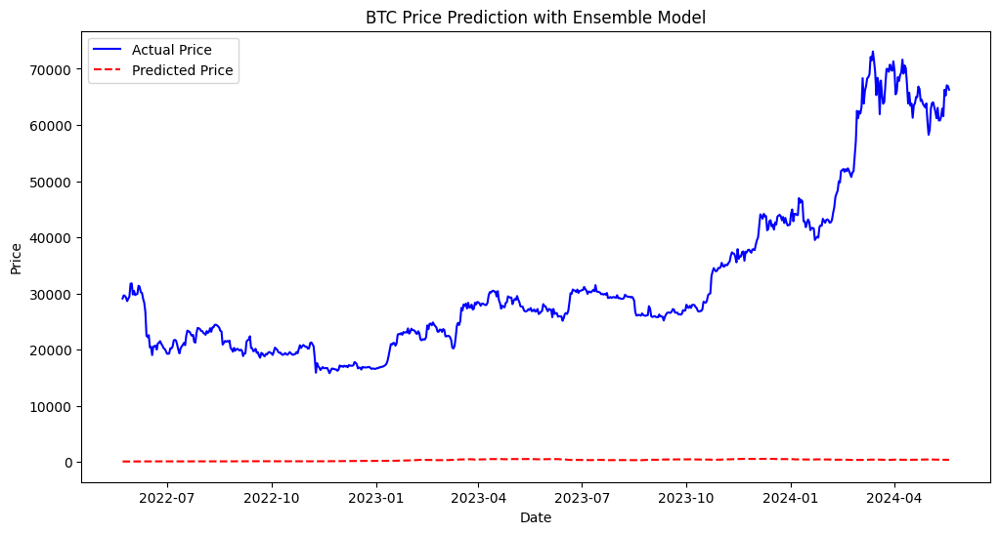

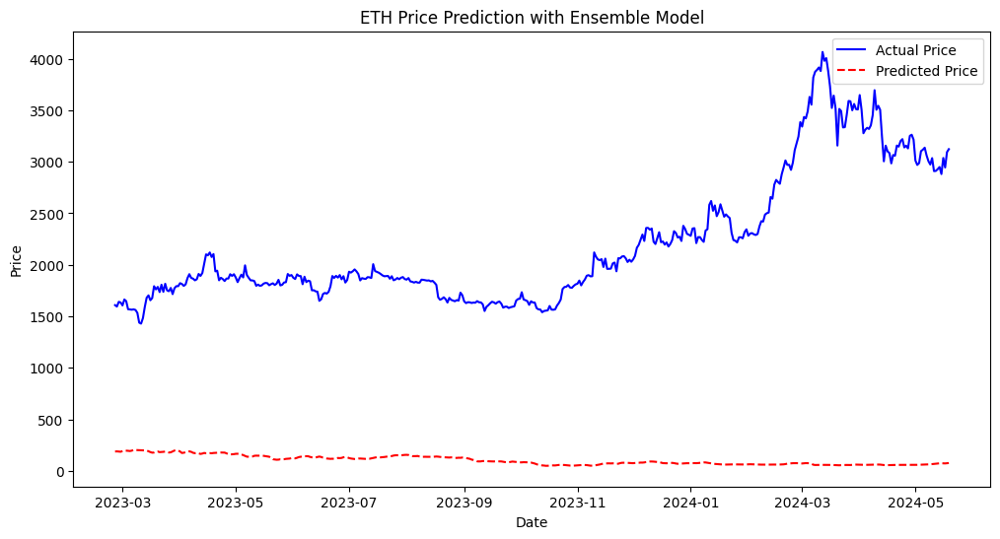

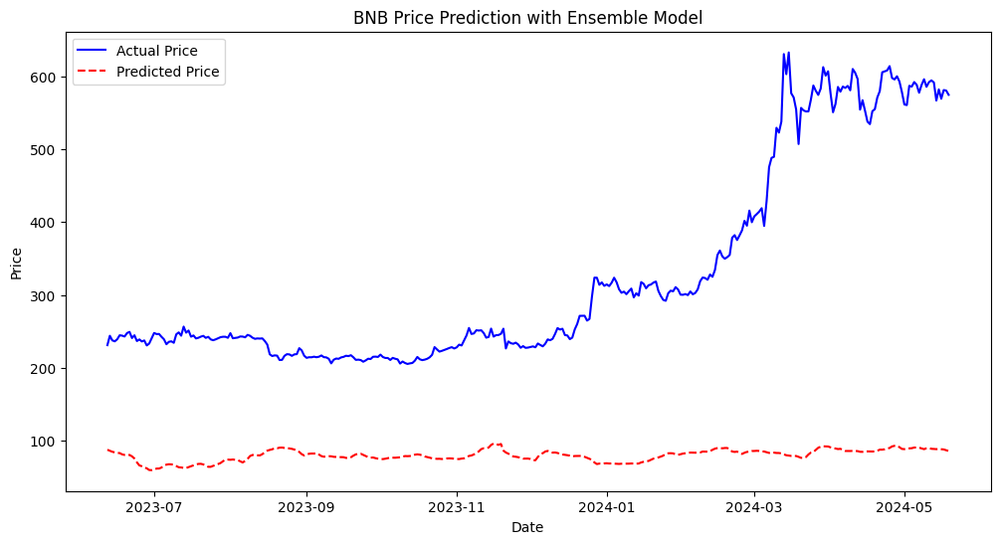

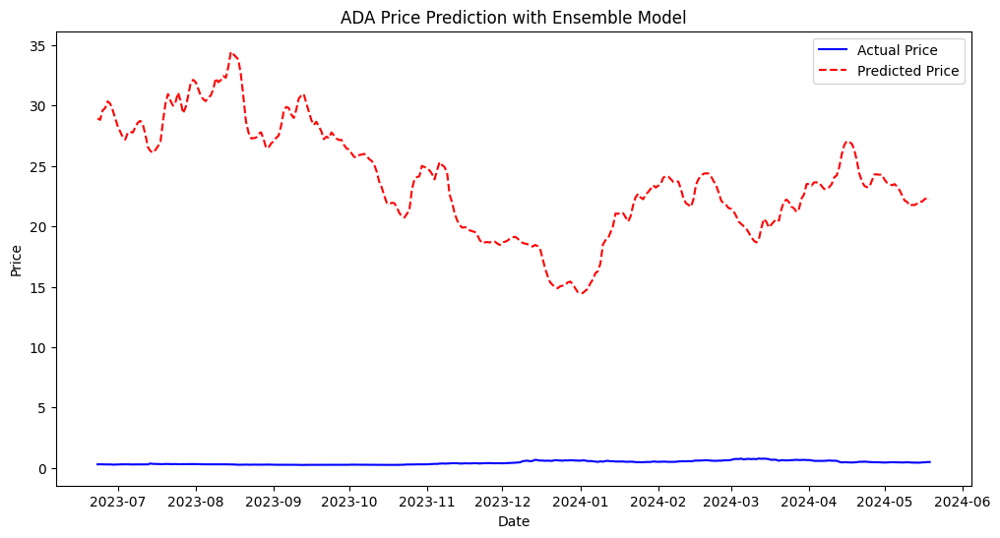

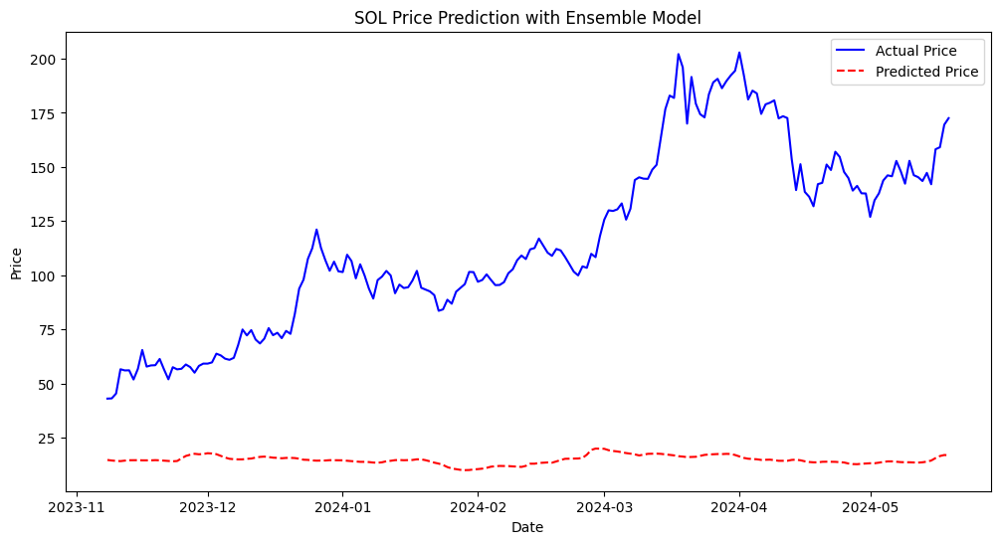

...

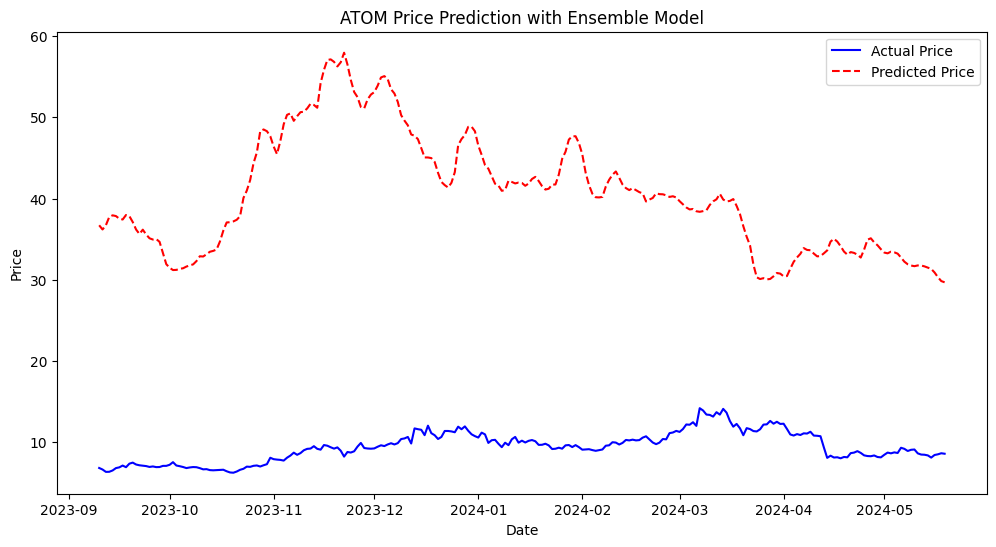

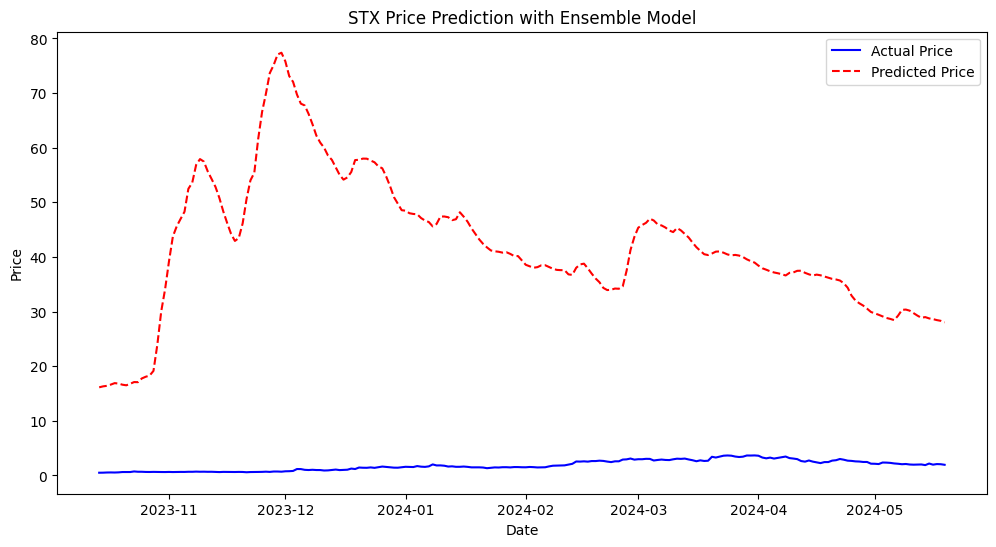

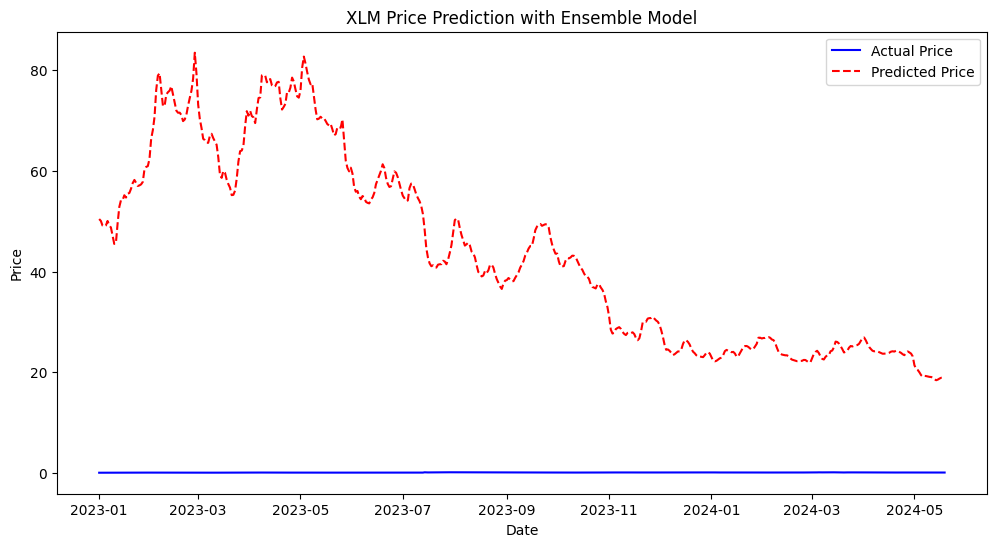

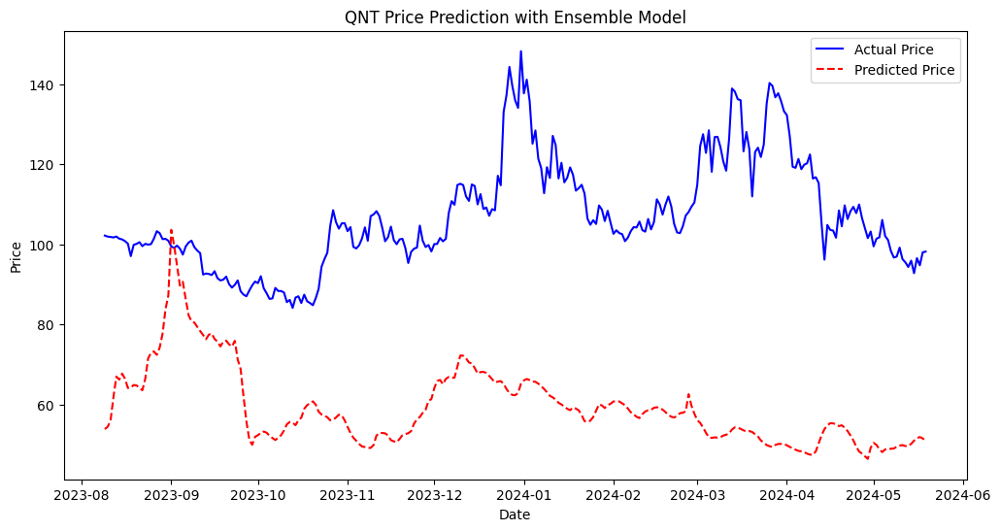

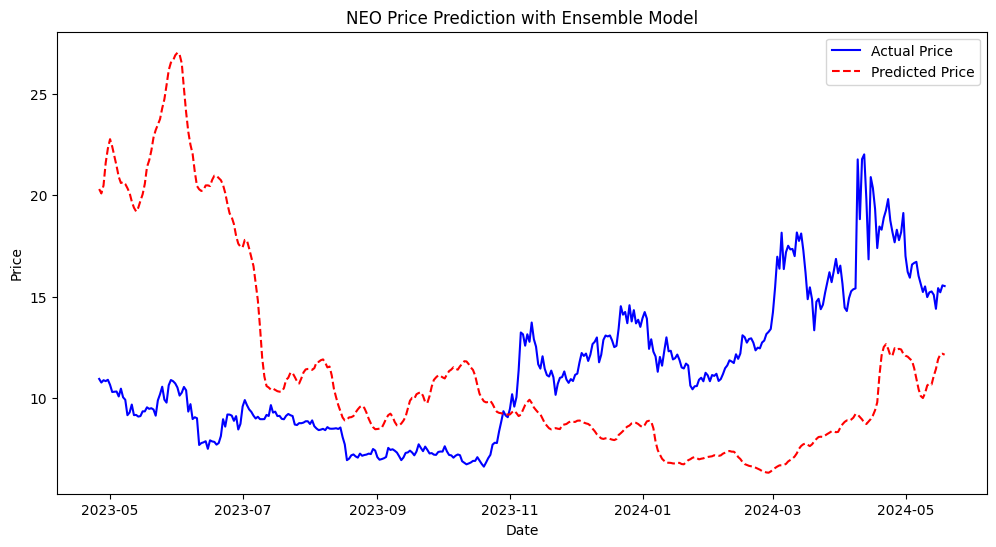

In [119]:
for crypto in cryptos:
    # Get actual test labels and ensemble predictions in original scale
    y_test_actual = scaler_label.inverse_transform(test_labels_scaled[crypto])
    y_pred_actual = scaler_label.inverse_transform(ensemble_predictions[crypto])
    
    # Get the corresponding test_label variable for each crypto
    test_label = eval(f'test_{crypto.lower()}_label')
    
    # Align the lengths of y_test_actual and y_pred_actual
    lookback = 30  # Same lookback period used during training
    y_test_actual = y_test_actual[lookback + 1:lookback + 1 + len(y_pred_actual)]
    
    # Plotting
    plt.figure(figsize=(12, 6))
    plt.plot(test_label.index[-len(y_test_actual):], y_test_actual.flatten(), label="Actual Price", color='blue')
    plt.plot(test_label.index[-len(y_test_actual):], y_pred_actual.flatten(), label="Predicted Price", linestyle='--', color='red')
    plt.title(f'{crypto} Price Prediction with Ensemble Model')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()